# Imports

In [3]:
import datetime
import graphviz
import json
import matplotlib as mpl
import matplotlib.pyplot as plt
import nltk
import numpy as np
import os
import pandas as pd
import pickle
import plotly
import plotly.express as px
import re
import seaborn as sns
import shutil
import string
import swifter
import tensorflow as tf
# import tensorflow_decision_forests as tfdf  # uncomment this to use it, it's just not compatible with tensorflow-macos==2.9.2 and tensorflow-metal==0.5.0

from collections import Counter
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from lazypredict.Supervised import LazyRegressor
from matplotlib import ticker
from mlxtend.evaluate import bias_variance_decomp
from pandas_profiling import ProfileReport
from sklearn import linear_model
from sklearn import metrics
from sklearn import metrics
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import VotingClassifier
from sklearn.exceptions import ConvergenceWarning
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.utils._testing import ignore_warnings
from tabulate import tabulate
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Rescaling
from tensorflow.keras.layers import Input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from xgboost import XGBClassifier

%matplotlib inline


In [19]:
pd.set_option('display.show_dimensions', True)
pd.set_option('display.max_columns', 200)

mpl.rcParams['agg.path.chunksize'] = 10_000

# Load Datasets

This dataset is offered by Yelp for academic and scientific researchers. It shows a subset of their businesses, reviews and user data for use in personal, educational, and academic purposes. All data is provided in JSON files as follows:
1. business.json - Contains business data including location data, attributes, and categories.
2. review.json - Contains full review text data including the user_id that wrote the review and the business_id the review is written for.
3. user.json - User data including the user's friend mapping and all the metadata associated with the user.
4. checkin.json - Checkins on a business.
5. tip.json - Tips written by a user on a business. Tips are shorter than reviews and tend to convey quick suggestions.
6. photos.json - Contains photo data including the caption and classification (one of "food", "drink", "menu", "inside" or "outside").

Given that some of the JSON files are huge, we will have to store each dataframe in a pickle file the first time it's created from disk. This allows us to:
1. Ignore the JSON files in the future.
2. Load the dataframes much quicker in future runs of the application.

However, these pickle files take up a considerable about of diskspace.

Further documentation about the dataset can be found [here](https://www.yelp.com/dataset/documentation/main).

## Business Information

In [20]:
def dictionify(x):
    '''Return a python dictionary after running eval on the cleaned up strings'''
    if x is None:
        return None

    # string replacement
    x = str(x).replace("\'", "\"")  # replace ' with "
    x = str(x).replace("u\"", "")  # remove the unicode (u") string identifier
    x = str(x).replace("\"\"", "\"")  # replace two consecutive " with just one
    x = str(x).replace("\"{", "{")  # remove " before {
    x = str(x).replace("}\"", "}")  # remove " after }
    # regex
    # convert False/True/None strings to objects
    x = re.sub(r"\"(False|True|None)\"", "\\1", x)
    x = re.sub(r"\"(none)\"", "None", x)  # replace none with None
    x = re.sub(r"{(\w+)(\":)", "{\"\\1\\2", x)  # {word":  ==> {"word":
    x = re.sub(r",\s(\w+)\"", ", \"\\1\"", x)  # , word" ==> , "word"
    # \sword,[ ,"] ==>  "word[ ,"], ignore True/False/None
    x = re.sub(r"(\s)(?!True|False|None)(\w+)[,\"\s]", " \"\2", x)
    x = re.sub(r"(\w+)(:)\s", "\\1\"\\2", x)  # word:\s ==> word":
    x = "dict(" + x + ")"  # wrap the string within the dict() function
    x = eval(x)  # convert to dictionaries
    return x

In [21]:
# load the business information JSON file
if os.path.exists('./picklejar/df_business.pkl'):
    print('Reading pickle file!')
    df_business = pd.read_pickle('./picklejar/df_business.pkl')

else:
    print('Reading the full JSON file from disk - this may take long!')
    df_business = pd.read_json(
        './dataset/business.json', lines=True, convert_dates=True)

    # convert the strings under the 'attributes' column to dictionaries
    df_business['attributes'] = df_business['attributes'].map(dictionify)

    # flatten the 'attributes' column
    df_business_attrs = pd.json_normalize(df_business['attributes'], sep='_')  # type: ignore
    # flatten the 'hours' column
    df_business_hours = pd.json_normalize(df_business['hours'], sep='_')  # type: ignore

    # rename the columns
    df_business_attrs.rename(columns=lambda x: 'attributes_' + x, inplace=True)
    df_business_hours.rename(columns=lambda x: 'hours_' + x, inplace=True)

    # concatenate the dataframes
    df_business = pd.concat(
        [df_business, df_business_attrs, df_business_hours], axis=1)

    # delete the new dataframes
    del df_business_attrs
    del df_business_hours

    # drop the attributes and hours columns
    df_business.drop(['attributes', 'hours'], axis=1, inplace=True)

    # fill the na's
    # the newly created attributes columns
    attrs_cols = [col for col in df_business.columns.tolist()
                  if col.startswith('attributes_')]
    # not all columns are the same, the default is to set na to False, but some columns need different values
    for col in attrs_cols:
        if col == 'attributes_WiFi' or col == 'attributes_Smoking' or col == 'attributes_BYOBCorkage':
            df_business[col] = df_business[col].fillna('no')
        elif col == 'attributes_Alcohol':
            df_business[col] = df_business[col].fillna('none')
        elif col == 'attributes_RestaurantsPriceRange2':
            df_business[col] = df_business[col].fillna(0)
        elif col == 'attributes_RestaurantsAttire':
            df_business[col] = df_business[col].fillna('non-specific')
        elif col == 'attributes_AgesAllowed':
            df_business[col] = df_business[col].fillna('allages')
        elif col == 'attributes_NoiseLevel':
            df_business[col] = df_business[col].fillna('average')
        else:
            df_business[col] = df_business[col].fillna(False)

    # the newly created hours columns
    hours_cols = [col for col in df_business.columns.tolist()
                  if col.startswith('hours_')]
    for col in hours_cols:
        df_business[col] = df_business[col].fillna('closed')

    # convert attributes_RestaurantsPriceRange2 values to int's
    df_business['attributes_RestaurantsPriceRange2'] = df_business['attributes_RestaurantsPriceRange2'].apply(
        lambda x: int(x))

    # store the business information dataframe to a pickle file for quicker loading next time
    df_business.to_pickle('./picklejar/df_business.pkl')

print('Dataframe shape:', df_business.shape)

df_business.head()

Reading pickle file!
Dataframe shape: (150346, 107)


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,categories,attributes_ByAppointmentOnly,attributes_BusinessAcceptsCreditCards,attributes_BikeParking,attributes_RestaurantsPriceRange2,attributes_CoatCheck,attributes_RestaurantsTakeOut,attributes_RestaurantsDelivery,attributes_Caters,attributes_WiFi,attributes_WheelchairAccessible,attributes_HappyHour,attributes_OutdoorSeating,attributes_HasTV,attributes_RestaurantsReservations,attributes_DogsAllowed,attributes_BusinessParking_garage,attributes_BusinessParking_street,attributes_BusinessParking_validated,attributes_BusinessParking_lot,attributes_BusinessParking_valet,attributes_Alcohol,attributes_GoodForKids,attributes_BusinessParking,attributes_RestaurantsAttire,attributes_Ambience,attributes_RestaurantsTableService,attributes_RestaurantsGoodForGroups,attributes_DriveThr,attributes_NoiseLevel,attributes_Ambience_romantic,attributes_Ambience_intimate,attributes_Ambience_touristy,attributes_Ambience_hipster,attributes_Ambience_divey,attributes_Ambience_classy,attributes_Ambience_trendy,attributes_Ambience_upscale,attributes_Ambience_casual,attributes_GoodForMeal_dessert,attributes_GoodForMeal_latenight,attributes_GoodForMeal_lunch,attributes_GoodForMeal_dinner,attributes_GoodForMeal_brunch,attributes_GoodForMeal_breakfast,attributes_BusinessAcceptsBitcoin,attributes_Smoking,attributes_GoodForDancing,attributes_Music_dj,attributes_Music_background_music,attributes_Music_no_music,attributes_Music_jukebox,attributes_Music_live,attributes_Music_video,attributes_Music_karaoke,attributes_AcceptsInsurance,attributes_BestNights_monday,attributes_BestNights_tuesday,attributes_BestNights_friday,attributes_BestNights_wednesday,attributes_BestNights_thursday,attributes_BestNights_sunday,attributes_BestNights_saturday,attributes_BYOB,attributes_Corkage,attributes_BYOBCorkage,attributes_HairSpecializesIn_straightperms,attributes_HairSpecializesIn_coloring,attributes_HairSpecializesIn_extensions,attributes_HairSpecializesIn_africanamerican,attributes_HairSpecializesIn_curly,attributes_HairSpecializesIn_kids,attributes_HairSpecializesIn_perms,attributes_HairSpecializesIn_asian,attributes_GoodForMeal,attributes_Open24Hours,attributes_RestaurantsCounterService,attributes_BestNights,attributes_AgesAllowed,attributes_HairSpecializesIn,attributes_Music,attributes_DietaryRestrictions_dairy-free,attributes_DietaryRestrictions_gluten-free,attributes_DietaryRestrictions_vegan,attributes_DietaryRestrictions_kosher,attributes_DietaryRestrictions_halal,attributes_DietaryRestrictions_soy-free,attributes_DietaryRestrictions_vegetarian,attributes_DietaryRestrictions,hours_Monday,hours_Tuesday,hours_Wednesday,hours_Thursday,hours_Friday,hours_Saturday,hours_Sunday
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.43,-119.71,5.00,7,0,"Doctors, Traditional Chinese Medicine, Naturop...",True,False,False,0,False,False,False,False,no,False,False,False,False,False,False,False,False,False,False,False,none,False,False,non-specific,False,False,False,False,average,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,no,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,no,False,False,False,False,False,False,False,False,False,False,False,False,allages,False,False,False,False,False,False,False,False,False,False,closed,closed,closed,closed,closed,closed,closed
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.55,-90.34,3.00,15,1,"Shipping Centers, Local Services, Notaries, Ma...",False,True,False,0,False,False,False,False,no,False,False,False,False,False,False,False,False,False,False,False,none,False,False,non-specific,False,False,False,False,average,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,no,False,False,False,False,False,False,False,

## Users

In [22]:
def years(x):
    '''Return the number of years between today and x'''

    x = datetime.datetime.strptime(x, '%Y-%m-%d %H:%M:%S')
    today = datetime.datetime.today()

    return today.year - x.year

In [2]:
# load the users JSON file
if os.path.exists('./picklejar/df_users.pkl'):
    print('Reading pickle file!')
    df_users = pd.read_pickle('./picklejar/df_users.pkl')

else:
    print('Reading the full JSON file from disk - this may take long!')
    df_users = pd.read_json('./dataset/user.json',
                            lines=True, convert_dates=True)

    # we need to know the count of years each user has been an elite
    df_users['elite_count'] = df_users['elite'].apply(
        lambda x: len(x.split(',')))

    # we need to know the number of friends of each user
    df_users['friends_count'] = df_users['friends'].apply(
        lambda x: len(x.split(',')))

    # let's add a new column for the number of years this user has been yelping
    df_users['yelping_since_year_count'] = df_users['yelping_since'].map(years)

    # store the users dataframe to a pickle file for quicker loading next time
    df_users.to_pickle('./picklejar/df_users.pkl')

print('Dataframe shape:', df_users.shape)

df_users.head()

Reading pickle file!
Dataframe shape: (1987897, 25)


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos,elite_count,friends_count,yelping_since_year_count
0,qVc8ODYU5SZjKXVBgXdI7w,Walker,585,2007-01-25 16:47:26,7217,1259,5994,2007,"NSCy54eWehBJyZdG2iE84w, pe42u7DcCH2QmI81NX-8qA...",267,...,18,232,844,467,467,239,180,1,14995,16
1,j14WgRoU_-2ZE1aw1dXrJg,Daniel,4333,2009-01-25 04:35:42,43091,13066,27281,"2009,2010,2011,2012,2013,2014,2015,2016,2017,2...","ueRPE0CX75ePGMqOFVj6IQ, 52oH4DrRvzzl8wh5UXyU0A...",3138,...,251,1847,7054,3131,3131,1521,1946,14,4646,14
2,2WnXYQFK0hXEoTxPtV2zvg,Steph,665,2008-07-25 10:41:00,2086,1010,1003,"2009,2010,2011,2012,2013","LuO3Bn4f3rlhyHIaNfTlnA, j9B4XdHUhDfTKVecyWQgyA...",52,...,3,66,96,119,119,35,18,5,381,15
3,SZDeASXq7o05mMNLshsdIA,Gwen,224,2005-11-29 04:38:33,512,330,299,"2009,2010,2011","enx1vVPnfdNUdPho6PH_wg, 4wOcvMLtU6a9Lslggq74Vg...",28,...,2,12,16,26,26,10,9,3,131,18
4,hA5lMy-EnncsH4JoR-hFGQ,Karen,79,2007-01-05 19:40:59,29,15,7,,"PBK4q9KEEBHhFvSXCUirIw, 3FWPpM7KU1gXeOM_ZbYMbA...",1,...,0,1,1,0,0,0,0,1,27,16


## Reviews

In [ ]:
def sentiment(stars):
    '''Return positive, neutral, or negative based on the number of stars'''

    if stars >= 4:
        return 'positive'
    elif stars == 3:
        return 'neutral'
    else:
        return 'negative'


In [ ]:
def sentiment_vader(review):
    '''Return a sentiment rating for each review using VADER Sentiment Analysis.'''

    # create a SentimentIntensityAnalyzer object
    sentiment_obj = SentimentIntensityAnalyzer()

    # the SentimentIntensityAnalyzer object returns a polarity score between -1 and 1
    # -1 <= score <= -0.05: negative
    # -0.05 < score < 0.05: neutral
    # 0.05 <= score <= 1: positive

    # get the polarity score
    sentiment = sentiment_obj.polarity_scores(review)

    if sentiment['compound'] >= 0.05:
        return ('positive')
    elif sentiment['compound'] <= -0.05:
        return ('negative')
    else:
        return ('neutral')

In [11]:
# load the reviews JSON file
if os.path.exists('./picklejar/df_reviews.pkl'):
    print('Reading pickle file!')
    df_reviews = pd.read_pickle('./picklejar/df_reviews.pkl')

else:
    print('Reading the full JSON file from disk - this may take long!')
    df_reviews = pd.read_json('./dataset/review.json',
                              lines=True, convert_dates=True)

    # add a sentiment to each review
    df_reviews['sentiment'] = df_reviews['stars'].map(sentiment)

    # let's combine the reviews and business dataframes together
    df_reviews = df_reviews.merge(
        right=df_business,
        on='business_id',
        suffixes=('_reviews', '_business')
    )

    # let's combine the reviews and users dataframes together
    df_reviews = df_reviews.merge(
        right=df_users,
        on='user_id',
        suffixes=('_reviews', '_users')
    )

    # store the reviews dataframe to a pickle file for quicker loading next time
    df_reviews.to_pickle('./picklejar/df_reviews.pkl')

print('Dataframe shape:', df_reviews.shape)

df_reviews.head()

Reading pickle file!
Dataframe shape: (6990247, 140)


,review_id,user_id,business_id,stars_reviews,useful_reviews,funny_reviews,cool_reviews,text,date,sentiment,...,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos,elite_count,friends_count,yelping_since_year_count
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3,0,0,0,"If you decide to eat here, just be aware it is...",2018-07-07 22:09:11,neutral,...,0,0,0,1,1,0,0,1,12,7
1,Bqn8psEmvYTO7izrnGNgqg,mh_-eMZ6K5RLWhZyISBhwA,8eDkw7CE0NKqMknPIu26fw,5,1,0,0,We tried this place on our first trip to New O...,2018-04-25 17:04:09,positive,...,0,0,0,1,1,0,0,1,12,7
2,PBIeDysdBxwY53IFnOPyUw,mh_-eMZ6K5RLWhZyISBhwA,d_tRshM-w6S4QxE4VVi8tQ,3,0,0,0,"Jones is definitely average quality, not many ...",2017-03-05 14:26:14,neutral,...,0,0,0,1,1,0,0,1,12,7
3,78MWkzX8uQz0kDnhlhwAAg,mh_-eMZ6K5RLWhZyISBhwA,mOk3D7VczrDapNuUgLxUQw,4,2,0,2,So glad we stumbled upon this restaurant! It i...,2018-10-29 21:54:59,positive,...,0,0,0,1,1,0,0,1,12,7
4,krpCZHUj222Ha7AffGUZHQ,mh_-eMZ6K5RLWhZyISBhwA,L4kfcADLCU4T33i7Z0CkuA,2,3,0,1,I was looking forward to a romantic dinner her...,2018-02-11 03:07:30,negative,...,0,0,0,1,1,0,0,1,12,7


In [ ]:
df_reviews.columns.tolist()


['review_id',
 'user_id',
 'business_id',
 'stars_reviews',
 'useful_reviews',
 'funny_reviews',
 'cool_reviews',
 'text',
 'date',
 'sentiment',
 'name_reviews',
 'address',
 'city',
 'state',
 'postal_code',
 'latitude',
 'longitude',
 'stars_business',
 'review_count_reviews',
 'is_open',
 'categories',
 'attributes_ByAppointmentOnly',
 'attributes_BusinessAcceptsCreditCards',
 'attributes_BikeParking',
 'attributes_RestaurantsPriceRange2',
 'attributes_CoatCheck',
 'attributes_RestaurantsTakeOut',
 'attributes_RestaurantsDelivery',
 'attributes_Caters',
 'attributes_WiFi',
 'attributes_WheelchairAccessible',
 'attributes_HappyHour',
 'attributes_OutdoorSeating',
 'attributes_HasTV',
 'attributes_RestaurantsReservations',
 'attributes_DogsAllowed',
 'attributes_BusinessParking_garage',
 'attributes_BusinessParking_street',
 'attributes_BusinessParking_validated',
 'attributes_BusinessParking_lot',
 'attributes_BusinessParking_valet',
 'attributes_Alcohol',
 'attributes_GoodForKids',

In [ ]:
df_reviews['stars_reviews'].value_counts()


5    3231607
4    1452916
1    1069550
3     691934
2     544240
Name: stars_reviews, Length: 5, dtype: int64

In [ ]:
df_reviews['sentiment'].value_counts()


positive    4684523
negative    1613790
neutral      691934
Name: sentiment, Length: 3, dtype: int64

## Checkins

In [ ]:
def checkin_day(date_str):
    '''Return a running total of the number of weekend/weekday checkins'''

    weekday_checkins = 0
    weekend_checkins = 0

    date_list = date_str.split(', ')

    for date in date_list:
        x = datetime.datetime.strptime(date, '%Y-%m-%d %H:%M:%S')
        if x.weekday() == 5 or x.weekday() == 6:  # Sat is 5 and Sun is 6
            weekend_checkins += 1
        else:
            weekday_checkins += 1

    return weekday_checkins, weekend_checkins

In [ ]:
# load the checkins JSON file
if os.path.exists('./picklejar/df_checkins.pkl'):
    print('Reading pickle file!')
    df_checkins = pd.read_pickle('./picklejar/df_checkins.pkl')

else:
    print('Reading the full JSON file from disk - this may take long!')
    df_checkins = pd.read_json(
        './dataset/checkin.json', lines=True, convert_dates=True)

    # we need to know the count of dates in the date column
    df_checkins['checkins_count'] = df_checkins['date'].apply(
        lambda x: len(x.split(',')))

    # add the number of weekday/weekend checkins to the dataframe
    df_checkins['weekday_checkins'], df_checkins['weekend_checkins'] = zip(
        *df_checkins['date'].apply(checkin_day))

    # let's combine the tips and business dataframes together
    df_checkins = df_checkins.merge(
        right=df_business,
        on='business_id'
    )

    # store the checkins dataframe to a pickle file for quicker loading next time
    df_checkins.to_pickle('./picklejar/df_checkins.pkl')

print('Dataframe shape:', df_checkins.shape)


df_checkins.head()

Reading pickle file!
Dataframe shape: (131930, 111)


,business_id,date,checkins_count,weekday_checkins,weekend_checkins,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,categories,attributes_ByAppointmentOnly,attributes_BusinessAcceptsCreditCards,attributes_BikeParking,attributes_RestaurantsPriceRange2,attributes_CoatCheck,attributes_RestaurantsTakeOut,attributes_RestaurantsDelivery,attributes_Caters,attributes_WiFi,attributes_WheelchairAccessible,attributes_HappyHour,attributes_OutdoorSeating,attributes_HasTV,attributes_RestaurantsReservations,attributes_DogsAllowed,attributes_BusinessParking_garage,attributes_BusinessParking_street,attributes_BusinessParking_validated,attributes_BusinessParking_lot,attributes_BusinessParking_valet,attributes_Alcohol,attributes_GoodForKids,attributes_BusinessParking,attributes_RestaurantsAttire,attributes_Ambience,attributes_RestaurantsTableService,attributes_RestaurantsGoodForGroups,attributes_DriveThr,attributes_NoiseLevel,attributes_Ambience_romantic,attributes_Ambience_intimate,attributes_Ambience_touristy,attributes_Ambience_hipster,attributes_Ambience_divey,attributes_Ambience_classy,attributes_Ambience_trendy,attributes_Ambience_upscale,attributes_Ambience_casual,attributes_GoodForMeal_dessert,attributes_GoodForMeal_latenight,attributes_GoodForMeal_lunch,attributes_GoodForMeal_dinner,attributes_GoodForMeal_brunch,attributes_GoodForMeal_breakfast,attributes_BusinessAcceptsBitcoin,attributes_Smoking,attributes_GoodForDancing,attributes_Music_dj,attributes_Music_background_music,attributes_Music_no_music,attributes_Music_jukebox,attributes_Music_live,attributes_Music_video,attributes_Music_karaoke,attributes_AcceptsInsurance,attributes_BestNights_monday,attributes_BestNights_tuesday,attributes_BestNights_friday,attributes_BestNights_wednesday,attributes_BestNights_thursday,attributes_BestNights_sunday,attributes_BestNights_saturday,attributes_BYOB,attributes_Corkage,attributes_BYOBCorkage,attributes_HairSpecializesIn_straightperms,attributes_HairSpecializesIn_coloring,attributes_HairSpecializesIn_extensions,attributes_HairSpecializesIn_africanamerican,attributes_HairSpecializesIn_curly,attributes_HairSpecializesIn_kids,attributes_HairSpecializesIn_perms,attributes_HairSpecializesIn_asian,attributes_GoodForMeal,attributes_Open24Hours,attributes_RestaurantsCounterService,attributes_BestNights,attributes_AgesAllowed,attributes_HairSpecializesIn,attributes_Music,attributes_DietaryRestrictions_dairy-free,attributes_DietaryRestrictions_gluten-free,attributes_DietaryRestrictions_vegan,attributes_DietaryRestrictions_kosher,attributes_DietaryRestrictions_halal,attributes_DietaryRestrictions_soy-free,attributes_DietaryRestrictions_vegetarian,attributes_DietaryRestrictions,hours_Monday,hours_Tuesday,hours_Wednesday,hours_Thursday,hours_Friday,hours_Saturday,hours_Sunday
0,---kPU91CF4Lq2-WlRu9Lw,"2020-03-13 21:10:56, 2020-06-02 22:18:06, 2020...",11,9,2,Frankie's Raw Bar,4903 State Rd 54,New Port Richey,FL,34652,28.22,-82.73,4.50,24,1,"Seafood, Restaurants, Latin American, Food, Fo...",False,True,True,0,False,True,False,True,no,True,False,True,False,False,True,False,False,False,True,False,none,False,False,non-specific,False,True,False,False,average,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,no,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,no,False,False,False,False,False,False,False,False,False,False,False,False,allages,False,False,False,False,False,False,False,False,False,False,0:0-0:0,11:0-21:0,11:0-21:0,11:0-21:0,11:0-22:0,11:0-22:0,closed
1,--0iUa4sNDFiZFrAdIWhZQ,"2010-09-13 21:43:09, 2011-05-04 23:08:15, 2011...",10,9,1,Pupuseria Y Restaurant Melba,6 S White Horse Pike,Clementon,NJ,08021,39.82,-74.99,3.00,14,1,"Food, Restaurants, Specialty Food, Mexican, Et...",False,False,False,1,False,True,False,False,no,False,False,False,False,True,False,False,False,False,False,False,none,True,False,casual,False,False

## Tips

In [ ]:
# load the tips JSON file
if os.path.exists('./picklejar/df_tips.pkl'):
    print('Reading pickle file!')
    df_tips = pd.read_pickle('./picklejar/df_tips.pkl')

else:
    print('Reading the full JSON file from disk - this may take long!')
    df_tips = pd.read_json('./dataset/tip.json',
                           lines=True, convert_dates=True)

    # let's combine the tips and business dataframes together
    df_tips = df_tips.merge(
        right=df_business,
        on='business_id',
        suffixes=('_tips', '_business')
    )

    # let's combine the tips and users dataframes together
    df_tips = df_tips.merge(
        right=df_users,
        on='user_id',
        suffixes=('_tips', '_users')
    )

    # store the tips dataframe to a pickle file for quicker loading next time
    df_tips.to_pickle('./picklejar/df_tips.pkl')

print('Dataframe shape:', df_tips.shape)

df_tips.head()

Reading pickle file!
Dataframe shape: (908915, 135)


,user_id,business_id,text,date,compliment_count,name_tips,address,city,state,postal_code,latitude,longitude,stars,review_count_tips,is_open,categories,attributes_ByAppointmentOnly,attributes_BusinessAcceptsCreditCards,attributes_BikeParking,attributes_RestaurantsPriceRange2,attributes_CoatCheck,attributes_RestaurantsTakeOut,attributes_RestaurantsDelivery,attributes_Caters,attributes_WiFi,attributes_WheelchairAccessible,attributes_HappyHour,attributes_OutdoorSeating,attributes_HasTV,attributes_RestaurantsReservations,attributes_DogsAllowed,attributes_BusinessParking_garage,attributes_BusinessParking_street,attributes_BusinessParking_validated,attributes_BusinessParking_lot,attributes_BusinessParking_valet,attributes_Alcohol,attributes_GoodForKids,attributes_BusinessParking,attributes_RestaurantsAttire,attributes_Ambience,attributes_RestaurantsTableService,attributes_RestaurantsGoodForGroups,attributes_DriveThr,attributes_NoiseLevel,attributes_Ambience_romantic,attributes_Ambience_intimate,attributes_Ambience_touristy,attributes_Ambience_hipster,attributes_Ambience_divey,attributes_Ambience_classy,attributes_Ambience_trendy,attributes_Ambience_upscale,attributes_Ambience_casual,attributes_GoodForMeal_dessert,attributes_GoodForMeal_latenight,attributes_GoodForMeal_lunch,attributes_GoodForMeal_dinner,attributes_GoodForMeal_brunch,attributes_GoodForMeal_breakfast,attributes_BusinessAcceptsBitcoin,attributes_Smoking,attributes_GoodForDancing,attributes_Music_dj,attributes_Music_background_music,attributes_Music_no_music,attributes_Music_jukebox,attributes_Music_live,attributes_Music_video,attributes_Music_karaoke,attributes_AcceptsInsurance,attributes_BestNights_monday,attributes_BestNights_tuesday,attributes_BestNights_friday,attributes_BestNights_wednesday,attributes_BestNights_thursday,attributes_BestNights_sunday,attributes_BestNights_saturday,attributes_BYOB,attributes_Corkage,attributes_BYOBCorkage,attributes_HairSpecializesIn_straightperms,attributes_HairSpecializesIn_coloring,attributes_HairSpecializesIn_extensions,attributes_HairSpecializesIn_africanamerican,attributes_HairSpecializesIn_curly,attributes_HairSpecializesIn_kids,attributes_HairSpecializesIn_perms,attributes_HairSpecializesIn_asian,attributes_GoodForMeal,attributes_Open24Hours,attributes_RestaurantsCounterService,attributes_BestNights,attributes_AgesAllowed,attributes_HairSpecializesIn,attributes_Music,attributes_DietaryRestrictions_dairy-free,attributes_DietaryRestrictions_gluten-free,attributes_DietaryRestrictions_vegan,attributes_DietaryRestrictions_kosher,attributes_DietaryRestrictions_halal,attributes_DietaryRestrictions_soy-free,attributes_DietaryRestrictions_vegetarian,attributes_DietaryRestrictions,hours_Monday,hours_Tuesday,hours_Wednesday,hours_Thursday,hours_Friday,hours_Saturday,hours_Sunday,name_users,review_count_users,yelping_since,useful,funny,cool,elite,friends,fans,average_stars,compliment_hot,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos,elite_count,friends_count,yelping_since_year_count
0,AGNUgVwnZUey3gcPCJ76iw,3uLgwr0qeCNMjKenHJwPGQ,Avengers time with the ladies.,2012-05-18 02:17:21,0,Century 20 El Con and XD,3601 E Broadway Blvd,Tucson,AZ,85716,32.22,-110.92,3.50,72,1,"Cinema, Event Planning & Services, Arts & Ente...",False,False,False,0,False,False,False,False,no,False,False,False,False,False,False,False,False,False,False,False,none,True,False,non-specific,False,False,False,False,average,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,no,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,no,False,False,False,False,False,False,False,False,False,False,False,False,allages,False,False,False,False,False,False,False,False,False,False,closed,closed,closed,closed,closed,closed,closed,Laura,138,2006-06-25 15:36:42,288,57,8

## Photos

In [ ]:
# load the photos JSON file
if os.path.exists('./picklejar/df_photos.pkl'):
    print('Reading pickle file!')
    df_photos = pd.read_pickle('./picklejar/df_photos.pkl')

else:
    print('Reading the full JSON file from disk - this may take long!')
    df_photos = pd.read_json('./photos/photos.json',
                             lines=True, convert_dates=True)

    # let's combine the photos and business dataframes together
#     df_photos = df_photos.merge(
#         right=df_business,
#         on='business_id',
#         suffixes=('_photos', '_business')
#     )

    # store the photos dataframe to a pickle file for quicker loading next time
    df_photos.to_pickle('./picklejar/df_photos.pkl')

print('Dataframe shape:', df_photos.shape)

df_photos.head()

Reading the full JSON file from disk - this may take long!
Dataframe shape: (200100, 4)


,photo_id,business_id,caption,label
0,zsvj7vloL4L5jhYyPIuVwg,Nk-SJhPlDBkAZvfsADtccA,Nice rock artwork everywhere and craploads of ...,inside
1,HCUdRJHHm_e0OCTlZetGLg,yVZtL5MmrpiivyCIrVkGgA,,outside
2,vkr8T0scuJmGVvN2HJelEA,_ab50qdWOk0DdB6XOrBitw,oyster shooter,drink
3,pve7D6NUrafHW3EAORubyw,SZU9c8V2GuREDN5KgyHFJw,Shrimp scampi,food
4,H52Er-uBg6rNrHcReWTD2w,Gzur0f0XMkrVxIwYJvOt2g,,food


# EDA

We start our exploratory data analysis (EDA) with describing what the data looks like, the number of records in each dataframe, the averages, etc...

#### Businesses Information
1. Total number of unique business in this dataset is ~ 1.5 million.
1. The average stars given to these businesses is ~ 3.6 stars.
1. Amost 79% of these businesses are open.
1. All restaurantes have reviews, with the average being ~45 reviews per restaurant. 
1. The lowest reviews count was 5 reviews, and the highest was 7568 reviews.
1. Top states that have these businesses were PA, FL, TN, IN and MO.
1. Top cities that have these businesses were Philadelphia, Tucson, Tampa, Indianapolis and Nashville.

#### Reviews
2. This dataset contains ~ 7 million reviews.
2. The average number of stars given by the reviewing user was ~ 3.75 stars.
2. The average "useful" votes received by reviews was ~ 1.185 votes, while the highest was 1,182 votes.
2. The average "funny" votes received by reviews was ~ 0.326 votes, while the highest was 792 votes.
2. The average "cool" votes received by reviews was ~ 0.499 votes, while the highest was 404 votes.
2. Reviews date range was between 2005-02-16 03:23:22 and 2022-01-19 19:48:45.

#### Users
3. This dataset contains ~ 2 million user records.
3. The average number of reviews written per user was ~ 23.4 reviews.
3. The average "useful" vote sent per user was ~ 42.3 votes, while the lowest and highest were 0 and 206,296 votes.
3. The average "funny" vote sent per user was ~ 17 votes, while the lowest and highest were 0 and 185,823 votes.
3. The average "cool" vote sent per user was ~ 23.8 votes, while the lowest and highest were 0 and 199,878 votes.
3. The average number of fans per user was ~ 1.5 fans, with the highest user having 12,497 fans.

#### Check-ins
4. The dataset contains 131,930 unique business check-ins.
4. The average number of check-ins per business was 101.24 check-ins.
4. While the lowest and highest number of check-ins were 1 and 52,144 check-ins.

#### Tips
5. This dataset contains 908,915 tips left by users about the businesses.
5. User tips range between 2009-04-16 13:11:49 and 2022-01-19 20:38:55.
5. Tips received on average almost no compliments, while the highest was 6 compliments.

#### Photos
6. This dataset contains 200 thousand photos of the businesses.
6. Photos are categorised under 5 categories (classes); "food", "drink", "menu", "inside" or "outside", with the top being "food".
6. Only one photo was repeated twice, the rest are all unique.
6. Only 76,413 photos have captions on them.

In [ ]:
df_business.describe(datetime_is_numeric=True)


,latitude,longitude,stars,review_count,is_open
count,150346.000000,150346.000000,150346.000000,150346.000000,150346.00000
mean,36.671150,-89.357339,3.596724,44.866561,0.79615
std,5.872759,14.918502,0.974421,121.120136,0.40286
min,27.555127,-120.095137,1.000000,5.000000,0.00000
25%,32.187293,-90.357810,3.000000,8.000000,1.00000
50%,38.777413,-86.121179,3.500000,15.000000,1.00000
75%,39.954036,-75.421542,4.500000,37.000000,1.00000
max,53.679197,-73.200457,5.000000,7568.000000,1.00000


In [ ]:
df_business['state'].value_counts()[:5]


PA    34039
FL    26330
TN    12056
IN    11247
MO    10913
Name: state, Length: 5, dtype: int64

In [ ]:
df_business['city'].value_counts()[:5]


Philadelphia    14569
Tucson           9250
Tampa            9050
Indianapolis     7540
Nashville        6971
Name: city, Length: 5, dtype: int64

In [ ]:
df_reviews.describe(datetime_is_numeric=True)


,stars_reviews,useful_reviews,funny_reviews,cool_reviews,date,latitude,longitude,stars_business,review_count_reviews,is_open,review_count_users,useful_users,funny_users,cool_users,fans,average_stars,compliment_hot,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos,elite_count,friends_count,yelping_since_year_count
count,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6990247,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06,6.990247e+06
mean,3.748584e+00,1.184615e+00,3.265611e-01,4.986199e-01,2017-01-11 11:10:05.264176896,3.594840e+01,-8.972830e+01,3.751329e+00,3.691727e+02,8.284687e-01,1.238333e+02,4.279901e+02,1.760981e+02,2.900687e+02,1.320916e+01,3.746490e+00,1.701005e+01,2.370812e+00,1.565922e+00,9.992146e-01,6.759509e-01,1.602984e+01,4.419397e+01,3.034152e+01,3.034152e+01,1.108569e+01,1.299869e+01,2.059173e+00,1.221751e+02,9.695272e+00
min,1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,2005-02-16 03:23:22,2.755513e+01,-1.200951e+02,1.000000e+00,5.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
25%,3.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2015-01-25 04:47:37,2.996448e+01,-9.030510e+01,3.500000e+00,4.300000e+01,1.000000e+00,7.000000e+00,3.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.390000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,8.000000e+00
50%,4.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2017-06-03 01:19:34,3.860392e+01,-8.621077e+01,4.000000e+00,1.350000e+02,1.000000e+00,2.400000e+01,1.900000e+01,3.000000e+00,4.000000e+00,0.000000e+00,3.880000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.700000e+01,1.000000e+01
75%,5.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,2019-05-22 23:52:36,3.994312e+01,-7.549605e+01,4.500000e+00,3.640000e+02,1.000000e+00,9.800000e+01,1.110000e+02,2.400000e+01,3.900000e+01,4.000000e+00,4.290000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.000000e+00,3.000000e+00,3.000000e+00,3.000000e+00,2.000000e+00,1.000000e+00,1.000000e+00,1.090000e+02,1.200000e+01
max,5.000000e+00,1.182000e+03,7.920000e+02,4.040000e+02,2022-01-19 19:48:45,5.367920e+01,-7.320046e+01,5.000000e+00,7.568000e+03,1.000000e+00,1.747300e+04,2.062960e+05,1.858230e+05,1.998780e+05,1.249700e+04,5.000000e+00,2.578400e+04,1.350100e+04,1.418000e+04,1.365400e+04,1.266900e+04,5.903100e+04,1.010970e+05,4.996700e+04,4.996700e+04,1.593400e+04,8.263000e+04,1.700000e+01,1.499500e+04,1.900000e+01
std,1.478702e+00,3.253774e+00,1.688733e+00,2.172465e+00,NaN,5.347206e+00,1.488738e+01,7.539320e-01,7.360805e+02,3.769726e-01,3.634315e+02,3.226596e+03,1.998333e+03,2.761548e+03,8.723713e+01,8.617989e-01,2.046787e+02,3.150277e+01,4.007215e+01,2.466833e+01,2.201955e+01,1.598069e+02,5.476234e+02,3.264441e+02,3.264441e+02,1.113880e+02,2.723352e+02,2.461213e+00,4.084075e+02,3.064205e+00


In [ ]:
df_users.describe(datetime_is_numeric=True)


,review_count,useful,funny,cool,fans,average_stars,compliment_hot,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos,elite_count,friends_count,yelping_since_year_count
count,1.987897e+06,1.987897e+06,1.987897e+06,1.987897e+06,1.987897e+06,1.987897e+06,1.987897e+06,1.987897e+06,1.987897e+06,1.987897e+06,1.987897e+06,1.987897e+06,1.987897e+06,1.987897e+06,1.987897e+06,1.987897e+06,1.987897e+06,1.987897e+06,1.987897e+06,1.987897e+06
mean,2.339441e+01,4.229634e+01,1.697054e+01,2.379291e+01,1.465740e+00,3.630494e+00,1.807072e+00,2.922631e-01,1.793176e-01,1.336493e-01,6.390723e-02,1.443135e+00,3.011841e+00,2.829308e+00,2.829308e+00,1.056448e+00,1.226859e+00,1.145530e+00,5.337501e+01,8.725541e+00
std,8.256699e+01,6.414806e+02,4.078034e+02,5.653513e+02,1.813075e+01,1.183337e+00,7.360184e+01,1.282467e+01,1.515525e+01,1.135682e+01,1.004363e+01,6.016790e+01,1.193898e+02,9.666385e+01,9.666385e+01,3.217973e+01,9.515751e+01,8.894284e-01,1.464435e+02,3.108074e+00
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
25%,2.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,7.000000e+00
50%,5.000000e+00,3.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.880000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,2.000000e+00,9.000000e+00
75%,1.700000e+01,1.300000e+01,2.000000e+00,3.000000e+00,0.000000e+00,4.560000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,4.600000e+01,1.100000e+01
max,1.747300e+04,2.062960e+05,1.858230e+05,1.998780e+05,1.249700e+04,5.000000e+00,2.578400e+04,1.350100e+04,1.418000e+04,1.365400e+04,1.266900e+04,5.903100e+04,1.010970e+05,4.996700e+04,4.996700e+04,1.593400e+04,8.263000e+04,1.700000e+01,1.499500e+04,1.900000e+01


In [ ]:
df_checkins.describe(datetime_is_numeric=True)


,checkins_count,weekday_checkins,weekend_checkins,latitude,longitude,stars,review_count,is_open
count,131930.000000,131930.000000,131930.000000,131930.000000,131930.000000,131930.000000,131930.000000,131930.000000
mean,101.242136,61.136246,40.105889,36.680103,-89.251058,3.595903,49.716766,0.781930
std,417.132327,271.579683,155.166379,5.926295,14.726002,0.928756,128.479706,0.412937
min,1.000000,0.000000,0.000000,27.555127,-120.095137,1.000000,5.000000,0.000000
25%,6.000000,4.000000,1.000000,32.146784,-90.341624,3.000000,9.000000,1.000000
50%,20.000000,12.000000,6.000000,38.767302,-86.128006,3.500000,17.000000,1.000000
75%,72.000000,44.000000,26.000000,39.953074,-75.439525,4.500000,43.000000,1.000000
max,52144.000000,38503.000000,15660.000000,53.679197,-73.200457,5.000000,7568.000000,1.000000


In [ ]:
df_tips.describe(datetime_is_numeric=True)


,date,compliment_count,latitude,longitude,stars,review_count_tips,is_open,review_count_users,useful,funny,cool,fans,average_stars,compliment_hot,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos,elite_count,friends_count,yelping_since_year_count
count,908915,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000,908915.000000
mean,2015-06-14 10:13:53.302817024,0.012525,35.868863,-89.659573,3.741070,351.485215,0.781055,149.771420,817.870389,364.848030,603.881151,29.100854,3.824328,46.505274,5.031521,3.370214,2.083348,1.130669,43.493407,118.513934,80.411686,80.411686,24.283019,41.206639,2.338530,215.378634,10.667539
min,2009-04-16 13:11:49,0.000000,27.564457,-120.095137,1.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,2013-01-26 01:18:02.500000,0.000000,29.962837,-90.298744,3.500000,45.000000,1.000000,8.000000,5.000000,1.000000,1.000000,0.000000,3.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,5.000000,9.000000
50%,2015-03-15 01:10:25,0.000000,38.599449,-86.297132,4.000000,137.000000,1.000000,29.000000,28.000000,6.000000,8.000000,1.000000,3.930000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,43.000000,11.000000
75%,2017-08-02 06:19:55.500000,0.000000,39.930270,-75.605488,4.000000,355.000000,1.000000,127.000000,202.000000,53.000000,79.000000,9.000000,4.280000,4.000000,2.000000,0.000000,0.000000,0.000000,8.000000,9.000000,9.000000,9.000000,5.000000,2.000000,2.000000,170.000000,13.000000
max,2022-01-19 20:38:55,6.000000,53.649743,-74.658572,5.000000,7568.000000,1.000000,17473.000000,206296.000000,185823.000000,195814.000000,12497.000000,5.000000,25784.000000,4138.000000,6411.000000,2974.000000,2413.000000,59031.000000,101097.000000,49967.000000,49967.000000,15934.000000,56104.000000,17.000000,12395.000000,19.000000
std,NaN,0.120763,5.393764,14.434338,0.692938,686.904548,0.413531,362.323356,4180.092097,2350.874686,3534.102807,170.278572,0.760233,347.452146,28.096176,34.715240,19.441472,13.416621,329.582308,739.372086,482.555931,482.555931,136.978647,365.374948,2.808551,668.580853,2.707528


In [ ]:
df_photos.describe(datetime_is_numeric=True)


,latitude,longitude,stars,review_count,is_open
count,200100.000000,200100.000000,200100.000000,200100.000000,200100.000000
mean,36.035454,-88.913481,3.817106,365.209445,0.824313
std,5.749985,13.916700,0.702541,732.179767,0.380555
min,27.564457,-120.000083,1.000000,5.000000,0.000000
25%,29.957032,-90.211024,3.500000,43.000000,1.000000
50%,38.599984,-86.159395,4.000000,133.000000,1.000000
75%,39.944030,-75.622966,4.500000,353.000000,1.000000
max,53.645924,-74.682591,5.000000,7568.000000,1.000000


## Pandas Profiling

As I'm lazy, I will resort to Pandas Profiling for the full EDA of each of the different datasets.

### Businesses

In [ ]:
profile = ProfileReport(
    df_business, title='Pandas Profiling Report for Yelp Businesses')

profile.to_file('./pandas_profiling/business.html')


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Users

You can run the *python_scripts/pandas_profiling_users.py* script for this one.

In [ ]:
profile = ProfileReport(
    df_users, title='Pandas Profiling Report for Yelp Users')

profile.to_file('./pandas_profiling/users.html')


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

: 

### Reviews

You can run the *python_scripts/pandas_profiling_reviews.py* script for this one.

In [ ]:
profile = ProfileReport(
    df_reviews, title='Pandas Profiling Report for Yelp Reviews', minimal=True)

profile.to_file('./pandas_profiling/reviews.html')


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

### Checkins

You can run the *python_scripts/pandas_profiling_checkins.py* script for this one.

In [ ]:
profile = ProfileReport(
    df_checkins, title='Pandas Profiling Report for Yelp Checkins', minimal=True)

profile.to_file('./pandas_profiling/checkins.html')


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

: 

### Tips

You can run the *python_scripts/pandas_profiling_tips.py* script for this one.

In [ ]:
profile = ProfileReport(
    df_tips, title='Pandas Profiling Report for Yelp Tips')

profile.to_file('./pandas_profiling/tips.html')


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

### Photos

In [ ]:
profile = ProfileReport(
    df_photos, title='Pandas Profiling Report for Yelp Photos')

profile.to_file('./pandas_profiling/photos.html')


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Visual Analysis

In [ ]:
# let's load the token key for mapbox
token_dir = './mapbox/'
token_file = token_dir + 'token'
with open(token_file) as f:
    token = f.readline()

px.set_mapbox_access_token(token)


### Tips and Business

We will start with a geographical view of all businesses and their tips, stars etc...

In [ ]:
# set the center point of the map
lon = int((max(df_tips['longitude'].values) +
          min(df_tips['longitude'].values)) / 2)
lat = int((max(df_tips['latitude'].values) +
          min(df_tips['latitude'].values)) / 2)

fig = px.scatter_mapbox(
    data_frame=df_tips,
    lat='latitude',
    lon='longitude',
    hover_name='name_tips',
    color='stars',
    hover_data=['address', 'is_open', 'stars', 'review_count_tips', 'text'],
    color_continuous_scale=px.colors.cyclical.IceFire,
    zoom=3,
    center={'lat': lat, 'lon': lon},
    title='Businesses on Yelp!'
)

# save to html
location = './plotly_exports/'
filename = location + 'businesses_tips_yelp.html'
plotly.offline.plot(fig, filename=filename)


'./plotly_exports/businesses_tips_yelp.html'

### Top 5 Cities

Let's look at a geographical view of the top 5 cities with businesses on Yelp.

In [ ]:
# Philadelphia    14569
# Tucson           9250
# Tampa            9050
# Indianapolis     7540
# Nashville        6971

fig = px.scatter_mapbox(
    data_frame=df_business[df_business['city'] == 'Philadelphia'],
    lat=df_business[df_business['city'] == 'Philadelphia']['latitude'],
    lon=df_business[df_business['city'] == 'Philadelphia']['longitude'],
    hover_name=df_business[df_business['city'] == 'Philadelphia']['name'],
    color='stars',
    hover_data=['address', 'is_open', 'stars', 'review_count'],
    color_continuous_scale=px.colors.cyclical.IceFire,
    zoom=10,
    title='Businesses on Yelp (Philadelphia)'
)

# save to html
location = './plotly_exports/'
filename = location + 'businesses_on_yelp_philadelphia.html'
plotly.offline.plot(fig, filename=filename)


'./plotly_exports/businesses_on_yelp_philadelphia.html'

In [ ]:
# Philadelphia    14569
# Tucson           9250
# Tampa            9050
# Indianapolis     7540
# Nashville        6971

fig = px.scatter_mapbox(
    data_frame=df_business[df_business['city'] == 'Tucson'],
    lat=df_business[df_business['city'] == 'Tucson']['latitude'],
    lon=df_business[df_business['city'] == 'Tucson']['longitude'],
    hover_name=df_business[df_business['city'] == 'Tucson']['name'],
    color='stars',
    hover_data=['address', 'is_open', 'stars', 'review_count'],
    color_continuous_scale=px.colors.cyclical.IceFire,
    zoom=10,
    title='Businesses on Yelp (Tucson)'
)

# save to html
location = './plotly_exports/'
filename = location + 'businesses_on_yelp_tucson.html'
plotly.offline.plot(fig, filename=filename)


'./plotly_exports/businesses_on_yelp_tucson.html'

In [ ]:
# Philadelphia    14569
# Tucson           9250
# Tampa            9050
# Indianapolis     7540
# Nashville        6971

fig = px.scatter_mapbox(
    data_frame=df_business[df_business['city'] == 'Tampa'],
    lat=df_business[df_business['city'] == 'Tampa']['latitude'],
    lon=df_business[df_business['city'] == 'Tampa']['longitude'],
    hover_name=df_business[df_business['city'] == 'Tampa']['name'],
    color='stars',
    hover_data=['address', 'is_open', 'stars', 'review_count'],
    color_continuous_scale=px.colors.cyclical.IceFire,
    zoom=10,
    title='Businesses on Yelp (Tampa)'
)

# save to html
location = './plotly_exports/'
filename = location + 'businesses_on_yelp_tampa.html'
plotly.offline.plot(fig, filename=filename)


'./plotly_exports/businesses_on_yelp_tampa.html'

In [ ]:
# Philadelphia    14569
# Tucson           9250
# Tampa            9050
# Indianapolis     7540
# Nashville        6971

fig = px.scatter_mapbox(
    data_frame=df_business[df_business['city'] == 'Indianapolis'],
    lat=df_business[df_business['city'] == 'Indianapolis']['latitude'],
    lon=df_business[df_business['city'] == 'Indianapolis']['longitude'],
    hover_name=df_business[df_business['city'] == 'Indianapolis']['name'],
    color='stars',
    hover_data=['address', 'is_open', 'stars', 'review_count'],
    color_continuous_scale=px.colors.cyclical.IceFire,
    zoom=10,
    title='Businesses on Yelp (Indianapolis)'
)

# save to html
location = './plotly_exports/'
filename = location + 'businesses_on_yelp_indianapolis.html'
plotly.offline.plot(fig, filename=filename)


'./plotly_exports/businesses_on_yelp_indianapolis.html'

In [ ]:
# Philadelphia    14569
# Tucson           9250
# Tampa            9050
# Indianapolis     7540
# Nashville        6971

fig = px.scatter_mapbox(
    data_frame=df_business[df_business['city'] == 'Nashville'],
    lat=df_business[df_business['city'] == 'Nashville']['latitude'],
    lon=df_business[df_business['city'] == 'Nashville']['longitude'],
    hover_name=df_business[df_business['city'] == 'Nashville']['name'],
    color='stars',
    hover_data=['address', 'is_open', 'stars', 'review_count'],
    color_continuous_scale=px.colors.cyclical.IceFire,
    zoom=10,
    title='Businesses on Yelp (Nashville)'
)

# save to html
location = './plotly_exports/'
filename = location + 'businesses_on_yelp_nashville.html'
plotly.offline.plot(fig, filename=filename)


'./plotly_exports/businesses_on_yelp_nashville.html'

### Top 5 States

Let's look at a geographical view of the top 5 states with businesses on Yelp.

In [ ]:
# let's load the token key for mapbox
token_dir = './mapbox/'
token_file = token_dir + 'token'
with open(token_file) as f:
    token = f.readline()

px.set_mapbox_access_token(token)


In [ ]:
# PA    34039
# FL    26330
# TN    12056
# IN    11247
# MO    10913

fig = px.scatter_mapbox(
    data_frame=df_business[df_business['state'] == 'PA'],
    lat=df_business[df_business['state'] == 'PA']['latitude'],
    lon=df_business[df_business['state'] == 'PA']['longitude'],
    hover_name=df_business[df_business['state'] == 'PA']['name'],
    color='stars',
    hover_data=['address', 'is_open', 'stars', 'review_count'],
    color_continuous_scale=px.colors.cyclical.IceFire,
    zoom=8,
    title='Businesses on Yelp (Pennsylvania)'
)

# save to html
location = './plotly_exports/'
filename = location + 'businesses_on_yelp_pennsylvania.html'
plotly.offline.plot(fig, filename=filename)


'./plotly_exports/businesses_on_yelp_pennsylvania.html'

In [ ]:
# PA    34039
# FL    26330
# TN    12056
# IN    11247
# MO    10913

fig = px.scatter_mapbox(
    data_frame=df_business[df_business['state'] == 'FL'],
    lat=df_business[df_business['state'] == 'FL']['latitude'],
    lon=df_business[df_business['state'] == 'FL']['longitude'],
    hover_name=df_business[df_business['state'] == 'FL']['name'],
    color='stars',
    hover_data=['address', 'is_open', 'stars', 'review_count'],
    color_continuous_scale=px.colors.cyclical.IceFire,
    zoom=8,
    title='Businesses on Yelp (Florida)'
)

# save to html
location = './plotly_exports/'
filename = location + 'businesses_on_yelp_florida.html'
plotly.offline.plot(fig, filename=filename)


'./plotly_exports/businesses_on_yelp_florida.html'

In [ ]:
# PA    34039
# FL    26330
# TN    12056
# IN    11247
# MO    10913

fig = px.scatter_mapbox(
    data_frame=df_business[df_business['state'] == 'TN'],
    lat=df_business[df_business['state'] == 'TN']['latitude'],
    lon=df_business[df_business['state'] == 'TN']['longitude'],
    hover_name=df_business[df_business['state'] == 'TN']['name'],
    color='stars',
    hover_data=['address', 'is_open', 'stars', 'review_count'],
    color_continuous_scale=px.colors.cyclical.IceFire,
    zoom=8,
    title='Businesses on Yelp (Tennessee)'
)

# save to html
location = './plotly_exports/'
filename = location + 'businesses_on_yelp_tennessee.html'
plotly.offline.plot(fig, filename=filename)


'./plotly_exports/businesses_on_yelp_tennessee.html'

In [ ]:
# PA    34039
# FL    26330
# TN    12056
# IN    11247
# MO    10913

fig = px.scatter_mapbox(
    data_frame=df_business[df_business['state'] == 'IN'],
    lat=df_business[df_business['state'] == 'IN']['latitude'],
    lon=df_business[df_business['state'] == 'IN']['longitude'],
    hover_name=df_business[df_business['state'] == 'IN']['name'],
    color='stars',
    hover_data=['address', 'is_open', 'stars', 'review_count'],
    color_continuous_scale=px.colors.cyclical.IceFire,
    zoom=8,
    title='Businesses on Yelp (Indiana)'
)

# save to html
location = './plotly_exports/'
filename = location + 'businesses_on_yelp_indiana.html'
plotly.offline.plot(fig, filename=filename)


'./plotly_exports/businesses_on_yelp_indiana.html'

In [ ]:
# PA    34039
# FL    26330
# TN    12056
# IN    11247
# MO    10913

fig = px.scatter_mapbox(
    data_frame=df_business[df_business['state'] == 'MO'],
    lat=df_business[df_business['state'] == 'MO']['latitude'],
    lon=df_business[df_business['state'] == 'MO']['longitude'],
    hover_name=df_business[df_business['state'] == 'MO']['name'],
    color='stars',
    hover_data=['address', 'is_open', 'stars', 'review_count'],
    color_continuous_scale=px.colors.cyclical.IceFire,
    zoom=8,
    title='Businesses on Yelp (Missouri)'
)

# save to html
location = './plotly_exports/'
filename = location + 'businesses_on_yelp_missouri.html'
plotly.offline.plot(fig, filename=filename)


'./plotly_exports/businesses_on_yelp_missouri.html'

### Corroleation Heatmaps

We will have a look at the correlation between business locations, offerings etc.. and the number of stars and reviews they get.

<AxesSubplot: >

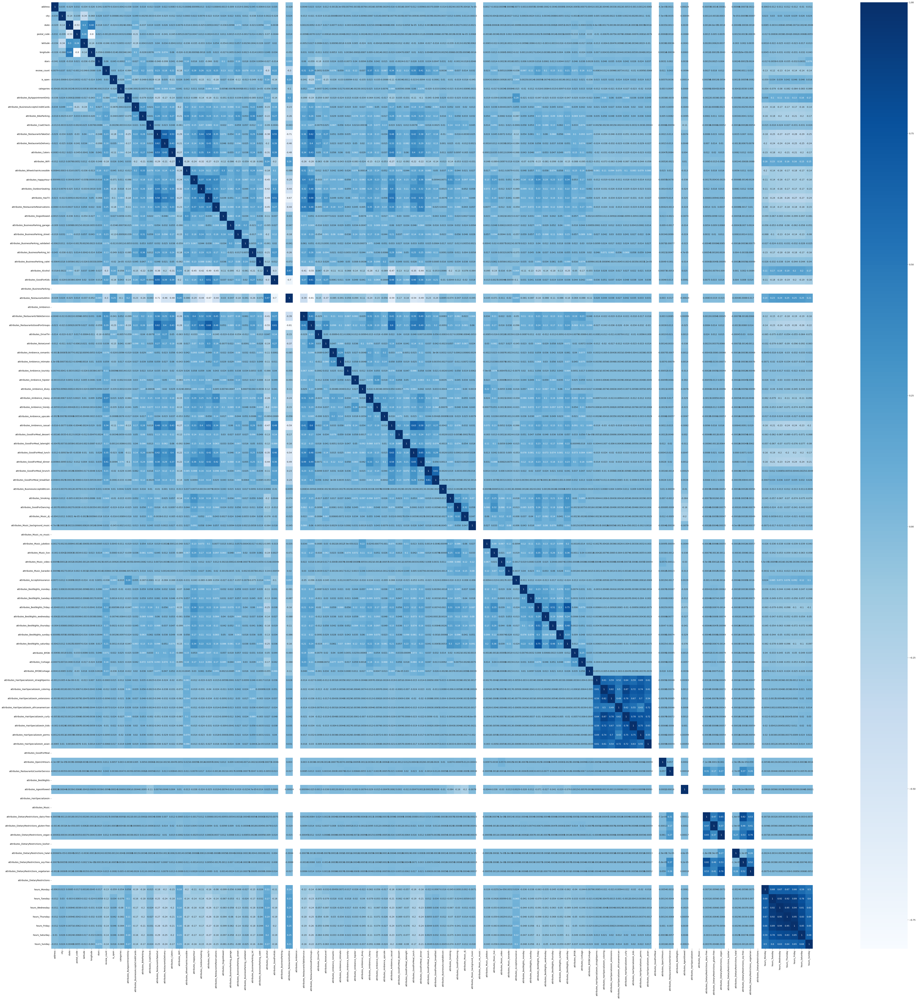

In [ ]:
# create a new dataframe so that the dates can be used in the correlation heatmap
df_corr = df_business.copy(deep=True)

# first we need to encode the categorical data
cat_cols = [col for col in df_business.drop(
    ['business_id', 'name', 'latitude', 'longitude',
        'attributes_RestaurantsPriceRange2'],
    axis=1).columns if (df_business[col].dtype == 'object' or df_business[col].dtype == 'bool')]

oe = OrdinalEncoder()
df_corr[cat_cols] = oe.fit_transform(df_corr[cat_cols])

fig, axes = plt.subplots(1, 1, figsize=(80, 80))
sns.heatmap(
    df_corr.corr(numeric_only=True),
    cmap="Blues",
    annot=True
)

Let's have a look at the corrolation between the different features of the users' dataset. As we can see, there is a high correlation between the number of cool/useful/funny votes sent by a particular user. 

There is also a high correlation between the different compliments received by any given user.

<AxesSubplot: >

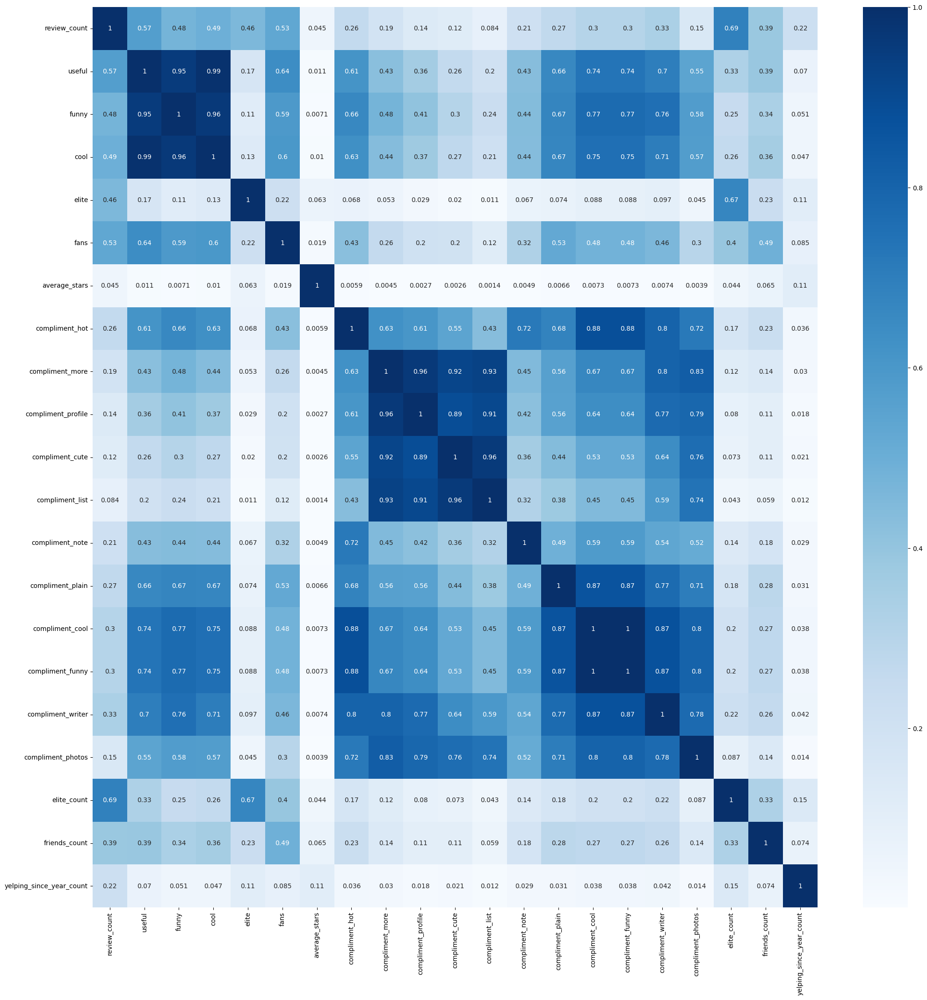

In [ ]:
# create a new dataframe so that the dates can be used in the correlation heatmap
df_corr = df_users.copy(deep=True)

# first we need to encode the categorical data
cat_cols = [col for col in df_users.drop(
    ['user_id', 'name', 'friends', 'yelping_since'],
    axis=1).columns if df_users[col].dtype == 'object']

oe = OrdinalEncoder()
df_corr[cat_cols] = oe.fit_transform(df_corr[cat_cols])

fig, axes = plt.subplots(1, 1, figsize=(25, 25))
sns.heatmap(
    df_corr.corr(numeric_only=True),
    cmap="Blues",
    annot=True
)

### Graphs

Graphs are strong representation tools of what the data actually means. It helps users draw conclusions about the data at hand without writing a single word.

Following are a few graphs that explain the relationship between some of the different features of each dataset.

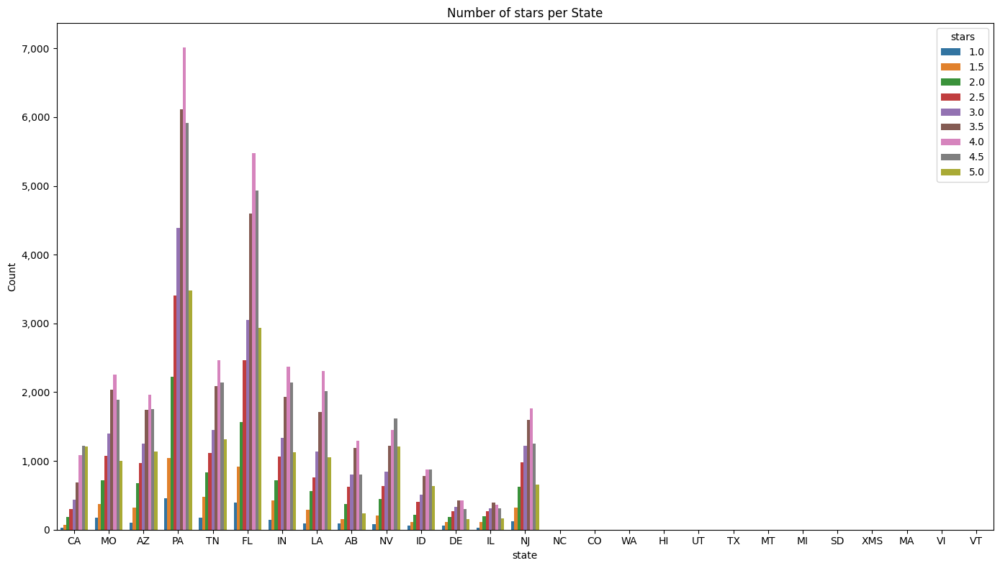

In [ ]:
# number of stars per state
fig, axes = plt.subplots(1, 1, figsize=(14, 8))

ax = sns.countplot(
    data=df_business, x=df_business['state'], hue=df_business['stars'])
# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.set_title('Number of stars per State')
ax.set_ylabel('Count')
ax.yaxis.set_major_formatter(ticker.FuncFormatter(
    lambda y, pos: '{:,.0f}'.format(y)))
plt.tight_layout()
plt.show()

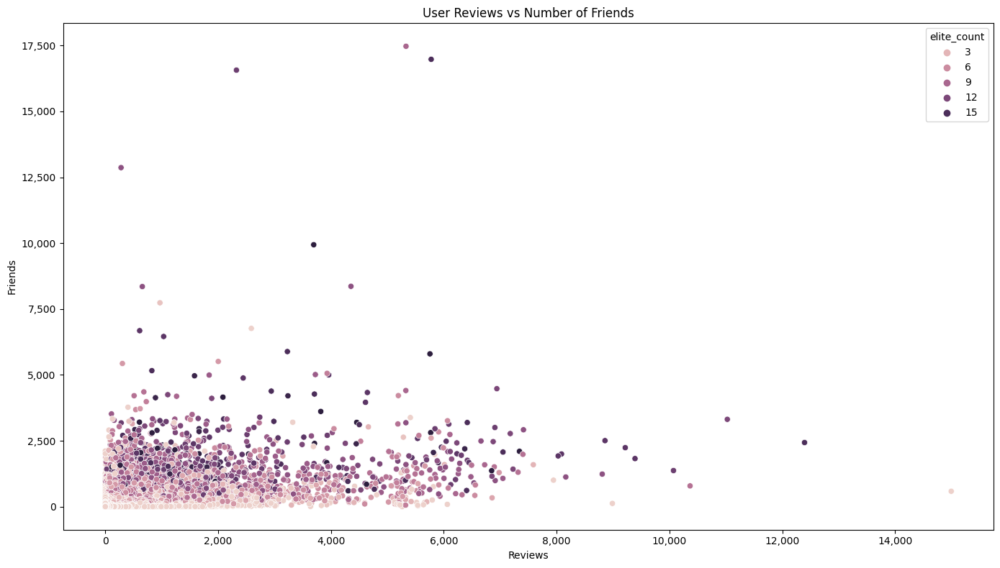

In [ ]:
# scatterplot for users
fig, axes = plt.subplots(1, 1, figsize=(14, 8))

ax = sns.scatterplot(
    data=df_users[['review_count', 'friends_count', 'elite_count']],
    x='friends_count',
    y='review_count',
    hue='elite_count')
# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.set_title('User Reviews vs Number of Friends')
ax.set_xlabel('Reviews')
ax.set_ylabel('Friends')
ax.yaxis.set_major_formatter(ticker.FuncFormatter(
    lambda y, pos: '{:,.0f}'.format(y)))
ax.xaxis.set_major_formatter(ticker.FuncFormatter(
    lambda x, pos: '{:,.0f}'.format(x)))
plt.tight_layout()
plt.show()

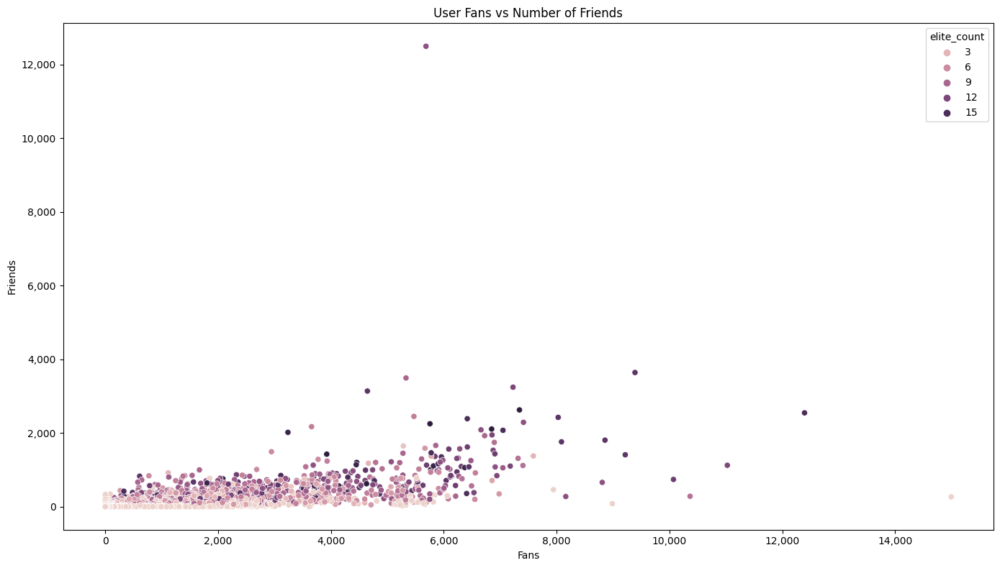

In [ ]:
# scatterplot for users
fig, axes = plt.subplots(1, 1, figsize=(14, 8))

ax = sns.scatterplot(
    data=df_users[['fans', 'friends_count', 'elite_count']],
    x='friends_count',
    y='fans',
    hue='elite_count')
# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.set_title('User Fans vs Number of Friends')
ax.set_xlabel('Fans')
ax.set_ylabel('Friends')
ax.yaxis.set_major_formatter(ticker.FuncFormatter(
    lambda y, pos: '{:,.0f}'.format(y)))
ax.xaxis.set_major_formatter(ticker.FuncFormatter(
    lambda x, pos: '{:,.0f}'.format(x)))
plt.tight_layout()
plt.show()

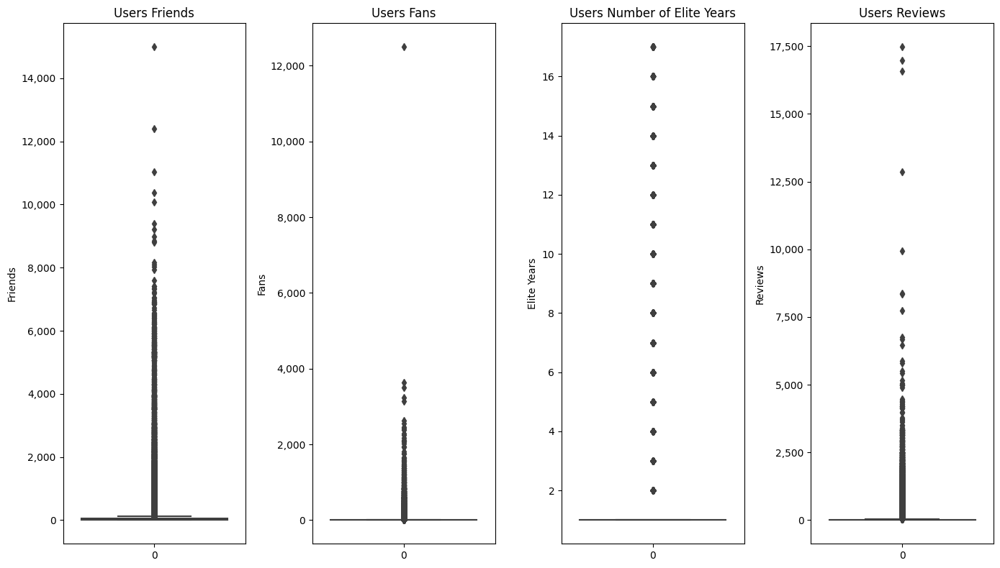

In [ ]:
# scatterplot for users
fig, axes = plt.subplots(1, 4, figsize=(14, 8))

ax = sns.boxplot(
    data=df_users['friends_count'],
    ax=axes[0])
ax.set_title('Users Friends')
ax.set_ylabel('Friends')
ax.yaxis.set_major_formatter(ticker.FuncFormatter(
    lambda y, pos: '{:,.0f}'.format(y)))

ax = sns.boxplot(
    data=df_users['fans'],
    ax=axes[1])
ax.set_title('Users Fans')
ax.set_ylabel('Fans')
ax.yaxis.set_major_formatter(ticker.FuncFormatter(
    lambda y, pos: '{:,.0f}'.format(y)))

ax = sns.boxplot(
    data=df_users['elite_count'],
    ax=axes[2])
ax.set_title('Users Number of Elite Years')
ax.set_ylabel('Elite Years')
ax.yaxis.set_major_formatter(ticker.FuncFormatter(
    lambda y, pos: '{:,.0f}'.format(y)))

ax = sns.boxplot(
    data=df_users['review_count'],
    ax=axes[3])
ax.set_title('Users Reviews')
ax.set_ylabel('Reviews')
ax.yaxis.set_major_formatter(ticker.FuncFormatter(
    lambda y, pos: '{:,.0f}'.format(y)))

plt.tight_layout()
plt.show()

# Machine Learning

In this section we will use the different machine learning algorithms to solve regression, classification, and clustering problems.

## Regression

For regression problems we will use the users dataframe that includes data from the users datasets. This is around 2M records. 

We will drop some of the columns that make little sense to have, and will use the bussiness stars as the target.

In [ ]:
df_users.head()


,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,average_stars,compliment_hot,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos,elite_count,friends_count,yelping_since_year_count
0,qVc8ODYU5SZjKXVBgXdI7w,Walker,585,2007-01-25 16:47:26,7217,1259,5994,2007,"NSCy54eWehBJyZdG2iE84w, pe42u7DcCH2QmI81NX-8qA...",267,3.91,250,65,55,56,18,232,844,467,467,239,180,1,14995,16
1,j14WgRoU_-2ZE1aw1dXrJg,Daniel,4333,2009-01-25 04:35:42,43091,13066,27281,"2009,2010,2011,2012,2013,2014,2015,2016,2017,2...","ueRPE0CX75ePGMqOFVj6IQ, 52oH4DrRvzzl8wh5UXyU0A...",3138,3.74,1145,264,184,157,251,1847,7054,3131,3131,1521,1946,14,4646,14
2,2WnXYQFK0hXEoTxPtV2zvg,Steph,665,2008-07-25 10:41:00,2086,1010,1003,"2009,2010,2011,2012,2013","LuO3Bn4f3rlhyHIaNfTlnA, j9B4XdHUhDfTKVecyWQgyA...",52,3.32,89,13,10,17,3,66,96,119,119,35,18,5,381,15
3,SZDeASXq7o05mMNLshsdIA,Gwen,224,2005-11-29 04:38:33,512,330,299,"2009,2010,2011","enx1vVPnfdNUdPho6PH_wg, 4wOcvMLtU6a9Lslggq74Vg...",28,4.27,24,4,1,6,2,12,16,26,26,10,9,3,131,18
4,hA5lMy-EnncsH4JoR-hFGQ,Karen,79,2007-01-05 19:40:59,29,15,7,,"PBK4q9KEEBHhFvSXCUirIw, 3FWPpM7KU1gXeOM_ZbYMbA...",1,3.54,1,1,0,0,0,1,1,0,0,0,0,1,27,16


In [ ]:
df_users.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1987897 entries, 0 to 1987896
Data columns (total 25 columns):
 #   Column                    Dtype  
---  ------                    -----  
 0   user_id                   object 
 1   name                      object 
 2   review_count              int64  
 3   yelping_since             object 
 4   useful                    int64  
 5   funny                     int64  
 6   cool                      int64  
 7   elite                     object 
 8   friends                   object 
 9   fans                      int64  
 10  average_stars             float64
 11  compliment_hot            int64  
 12  compliment_more           int64  
 13  compliment_profile        int64  
 14  compliment_cute           int64  
 15  compliment_list           int64  
 16  compliment_note           int64  
 17  compliment_plain          int64  
 18  compliment_cool           int64  
 19  compliment_funny          int64  
 20  compliment_writer       

In [ ]:
# split the x and y dataframes
x = df_users.drop(['user_id', 'name', 'yelping_since',
                  'elite', 'friends'],
                  axis=1)

# first we need to encode the categorical data
cat_cols = [col for col in x.columns if x[col].dtype == 'object']

# create am OrdinalEncoder object and fit_transform it
oe = OrdinalEncoder()
for col in cat_cols:
    print(col)
    x[col] = oe.fit_transform(x[col].values.reshape(-1, 1))  # type: ignore


### Simple Linear Regression

Simple linear regression models are useful for simple datasets, which is clearly not the case here with 10+ input features defining the dataset.

We will create a simple function that takes in one column against the average_stars column and create a simple linear regression model, print the different metrics and graph the relationship between each column and the average_stars column.

In [ ]:
def linear_regression_model(x, y, x_label, y_label):
    """"This function takes in x and y in a numpy array form, and returns the
    linear regression equation, R2, MSE, and RMSE. It also graphs the whole
    thing.
    """
    model = linear_model.LinearRegression().fit(x, y)

    # Get the intercept (a_0) and coefficient (a_1)
    a_0 = model.intercept_
    a_1 = model.coef_[0]

    # Scoring the prediction accuracy
    y_pred = model.predict(x)

    # R2, MSE and RMSE
    r_score = metrics.r2_score(y, y_pred)
    MSE = metrics.mean_squared_error(y, y_pred)
    RMSE = np.sqrt(metrics.mean_squared_error(y, y_pred))

    # Print the different scores
    if str(a_1).startswith('-'):
        a_1 = abs(a_1)
        print('The linear regression equation is y = {} - {}*x'.format(a_0, a_1))
    else:
        print('The linear regression equation is y = {} + {}*x'.format(a_0, a_1))
    print('R2 is {} '.format(r_score))
    print('The mean squared error (MSE) is {}'.format(MSE))
    print('The root mean squared error (RMSE) is {}'.format(RMSE))
    print()

    # Graph
    plt.scatter(x, y)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.plot(x, y_pred, c='r')
    plt.show()


Linear regression of review_count vs user average stars:
The linear regression equation is y = 3.6152789021452207 + 0.0006503796711227469*x
R2 is 0.0020593489875132542 
The mean squared error (MSE) is 1.397402073168588
The root mean squared error (RMSE) is 1.1821176223915233



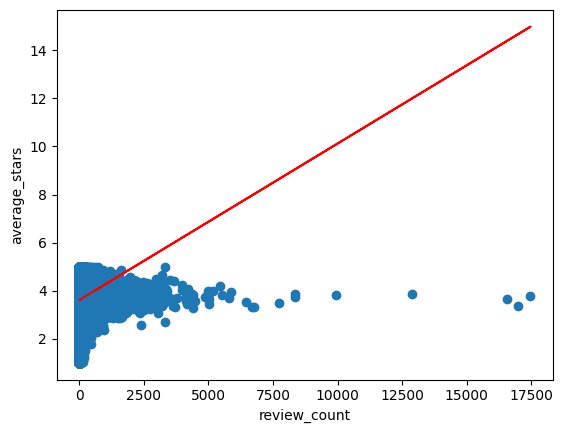

Linear regression of useful vs user average stars:
The linear regression equation is y = 3.6296379993982497 + 2.024172891277197e-05*x
R2 is 0.00012040523506506862 
The mean squared error (MSE) is 1.400117148475601
The root mean squared error (RMSE) is 1.183265459850663



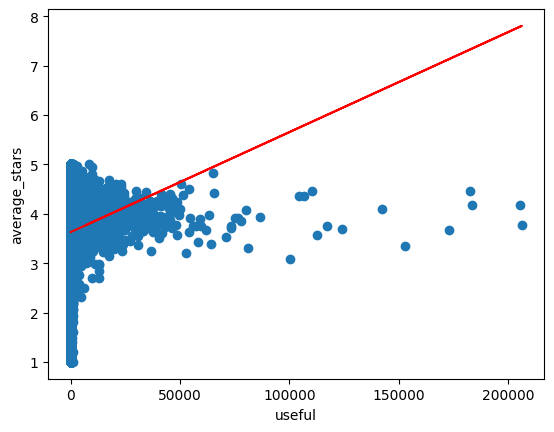

Linear regression of funny vs user average stars:
The linear regression equation is y = 3.630146475310594 + 2.0486980267434282e-05*x
R2 is 4.9847200767505484e-05 
The mean squared error (MSE) is 1.4002159498855906
The root mean squared error (RMSE) is 1.1833072085834644



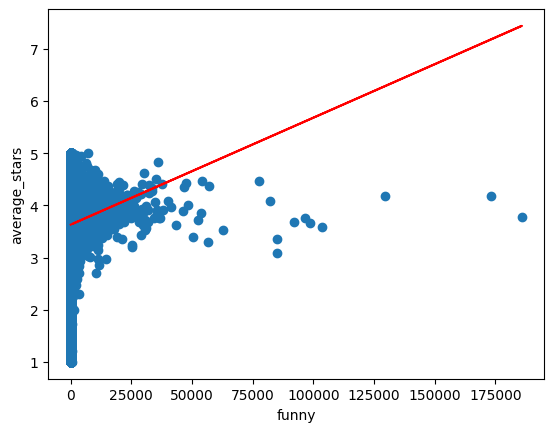

Linear regression of cool vs user average stars:
The linear regression equation is y = 3.6299743825519726 + 2.1845487393918866e-05*x
R2 is 0.00010892896393999152 
The mean squared error (MSE) is 1.400133218534523
The root mean squared error (RMSE) is 1.1832722503864117



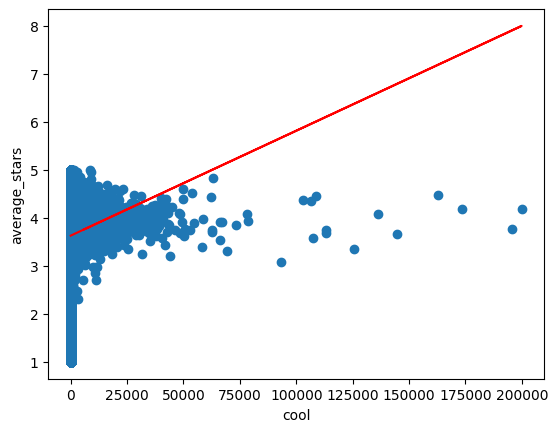

Linear regression of fans vs user average stars:
The linear regression equation is y = 3.6286370432242876 + 0.0012670095542353557*x
R2 is 0.0003768552427573235 
The mean squared error (MSE) is 1.3997580451841882
The root mean squared error (RMSE) is 1.1831137076309226



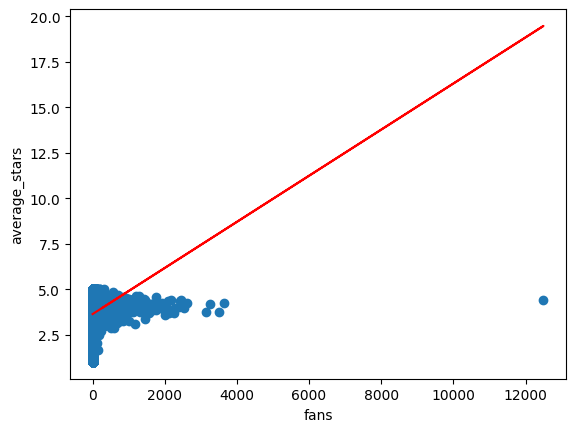

Linear regression of compliment_hot vs user average stars:
The linear regression equation is y = 3.630321911265541 + 9.531387665948074e-05*x
R2 is 3.5145743417563935e-05 
The mean squared error (MSE) is 1.4002365361268252
The root mean squared error (RMSE) is 1.183315907155323



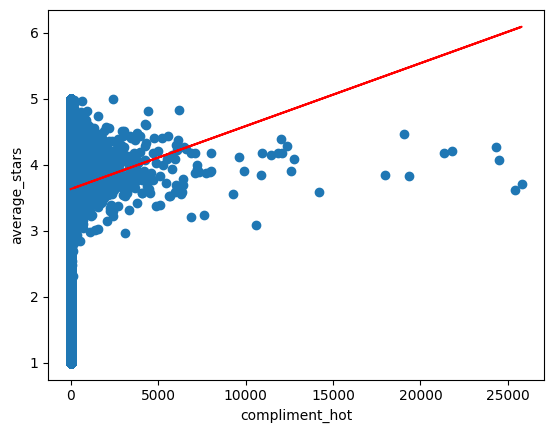

Linear regression of compliment_more vs user average stars:
The linear regression equation is y = 3.630373190802101 + 0.0004138720768802603*x
R2 is 2.0119054524148083e-05 
The mean squared error (MSE) is 1.4002575777851554
The root mean squared error (RMSE) is 1.1833247980944013



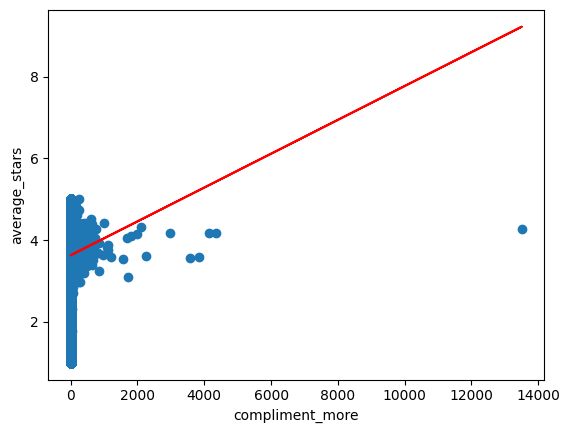

Linear regression of compliment_profile vs user average stars:
The linear regression equation is y = 3.630455718550014 + 0.00021432247648677834*x
R2 is 7.534335467074271e-06 
The mean squared error (MSE) is 1.4002751999879215
The root mean squared error (RMSE) is 1.1833322441258505



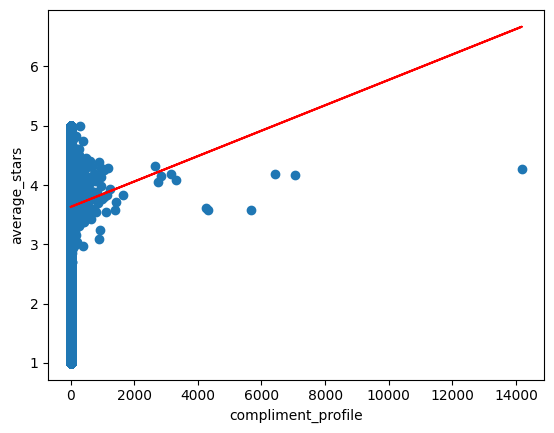

Linear regression of compliment_cute vs user average stars:
The linear regression equation is y = 3.6304579275203097 + 0.0002710290015360671*x
R2 is 6.765943463493684e-06 
The mean squared error (MSE) is 1.4002762759562946
The root mean squared error (RMSE) is 1.1833326987607056



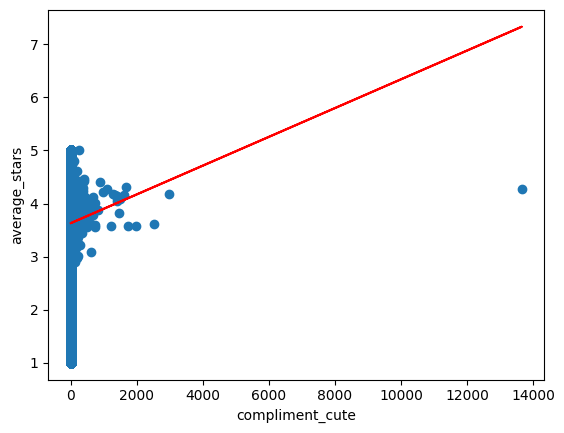

Linear regression of compliment_list vs user average stars:
The linear regression equation is y = 3.6304834202909184 + 0.00016790055133900517*x
R2 is 2.030806163011434e-06 
The mean squared error (MSE) is 1.4002829065015816
The root mean squared error (RMSE) is 1.183335500397745



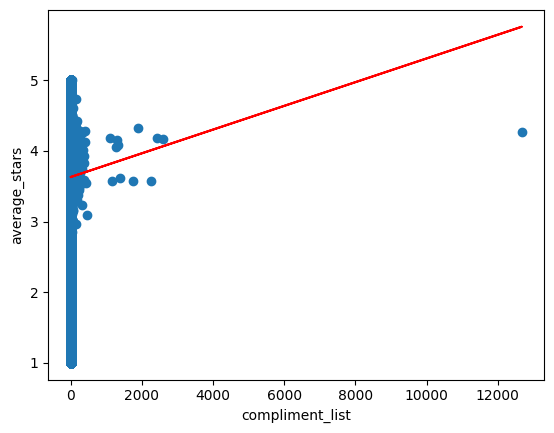

Linear regression of compliment_note vs user average stars:
The linear regression equation is y = 3.630355028010878 + 9.640288380163317e-05*x
R2 is 2.4026630985884978e-05 
The mean squared error (MSE) is 1.4002521060615183
The root mean squared error (RMSE) is 1.1833224860795633



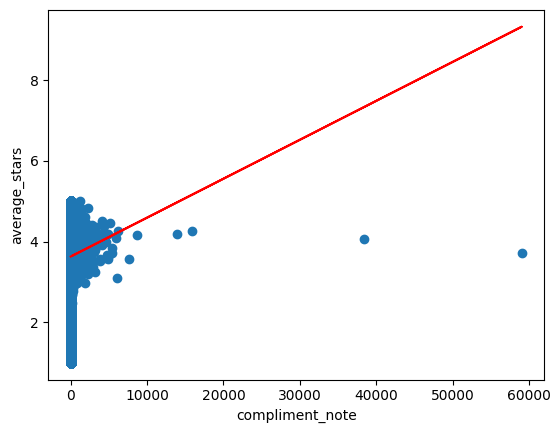

Linear regression of compliment_plain vs user average stars:
The linear regression equation is y = 3.6302973675466395 + 6.53363819557367e-05*x
R2 is 4.3453799173365226e-05 
The mean squared error (MSE) is 1.4002249024747382
The root mean squared error (RMSE) is 1.18331099144508



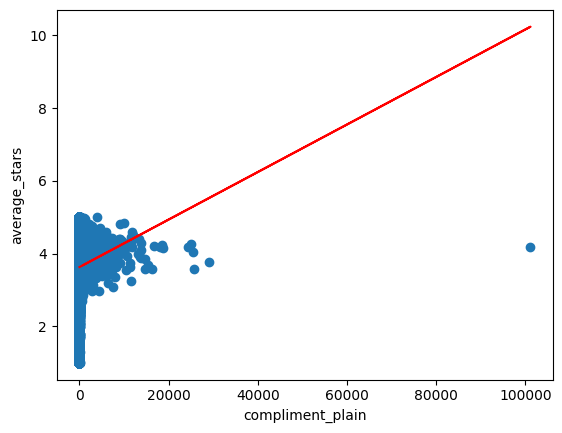

Linear regression of compliment_cool vs user average stars:
The linear regression equation is y = 3.6302409992875972 + 8.947454928438366e-05*x
R2 is 5.342079762582497e-05 
The mean squared error (MSE) is 1.400210945828833
The root mean squared error (RMSE) is 1.183305094144715



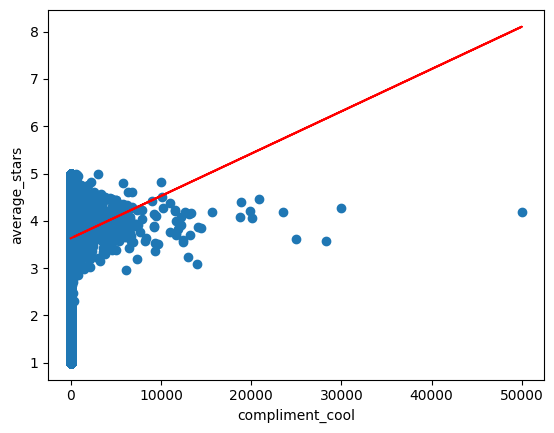

Linear regression of compliment_funny vs user average stars:
The linear regression equation is y = 3.6302409992875972 + 8.947454928438366e-05*x
R2 is 5.342079762582497e-05 
The mean squared error (MSE) is 1.400210945828833
The root mean squared error (RMSE) is 1.183305094144715



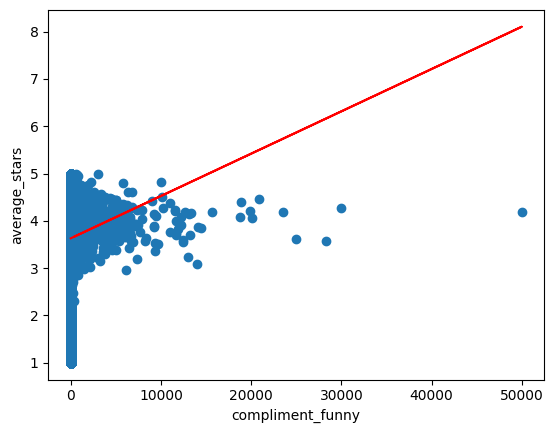

Linear regression of compliment_writer vs user average stars:
The linear regression equation is y = 3.6302078498374923 + 0.0002710029148936744*x
R2 is 5.431199751015914e-05 
The mean squared error (MSE) is 1.4002096978943344
The root mean squared error (RMSE) is 1.1833045668357467



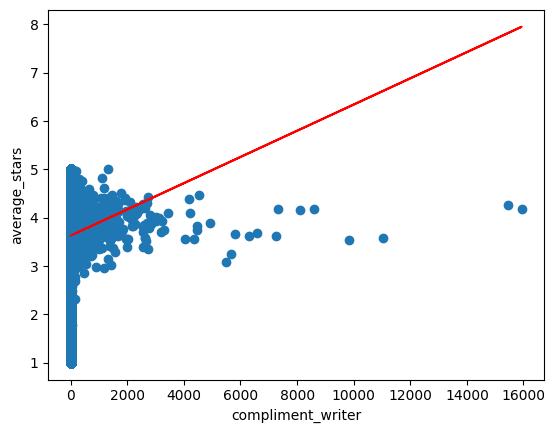

Linear regression of compliment_photos vs user average stars:
The linear regression equation is y = 3.6304348006469773 + 4.837531244989788e-05*x
R2 is 1.5132714692001059e-05 
The mean squared error (MSE) is 1.4002645600857682
The root mean squared error (RMSE) is 1.183327748379868



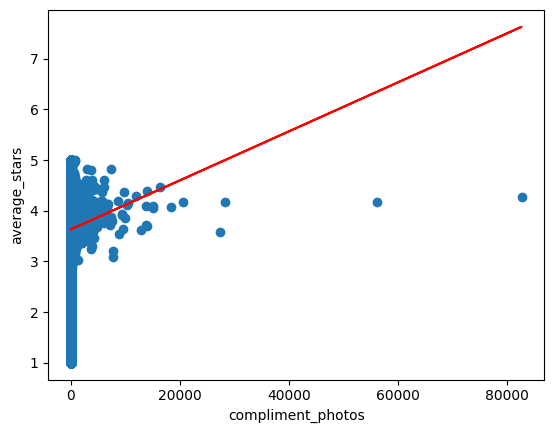

Linear regression of elite_count vs user average stars:
The linear regression equation is y = 3.563338994323514 + 0.058623672193759226*x
R2 is 0.0019415615117904794 
The mean squared error (MSE) is 1.397567009292396
The root mean squared error (RMSE) is 1.1821873833248246



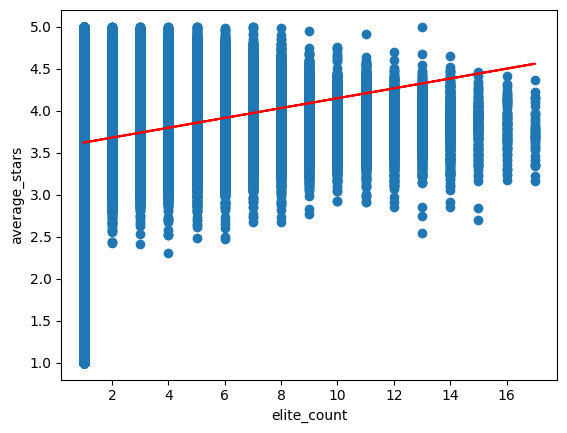

Linear regression of friends_count vs user average stars:
The linear regression equation is y = 3.6024639515066377 + 0.0005251558382616341*x
R2 is 0.004223762859007385 
The mean squared error (MSE) is 1.3943712752667767
The root mean squared error (RMSE) is 1.1808349907022475



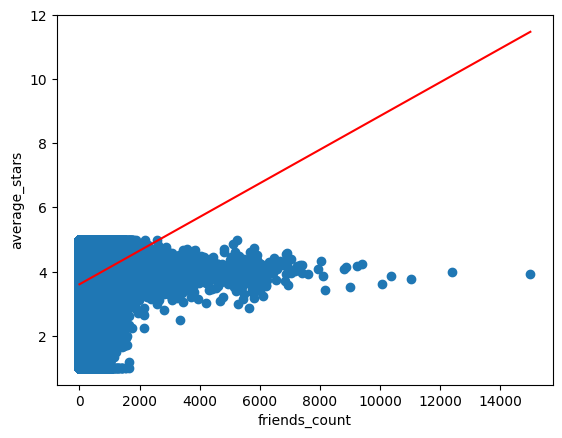

Linear regression of yelping_since_year_count vs user average stars:
The linear regression equation is y = 3.253262573238615 + 0.04323303208552336*x
R2 is 0.012894281112549422 
The mean squared error (MSE) is 1.3822300721094019
The root mean squared error (RMSE) is 1.1756828110121378



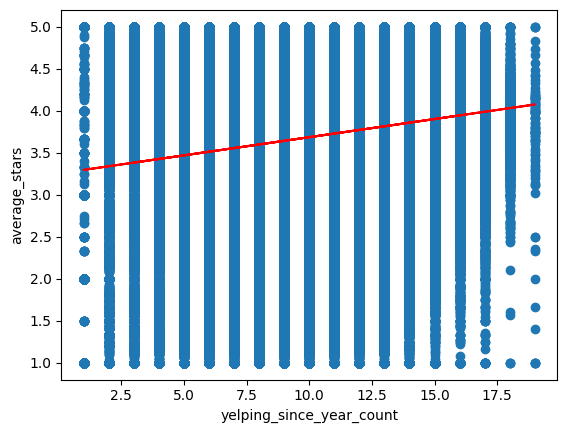

In [ ]:
for col in x.drop('average_stars', axis=1).columns.tolist():
    print(f'Linear regression of {col} vs user average stars:')
    x_, x_label = x[[col]].values, list(x[[col]].columns)
    y_, y_label = x['average_stars'].values, list(x[['average_stars']].columns)

    linear_regression_model(x_, y_, x_label[0], y_label[0])


### Multilinear Regression

Multilinear regression takes the complexity up a notch, and could draw the relationship between three different columns. 

We will create a simple function that takes in pairs of features to create the equation that includes the pair of features and average_stars.

In [ ]:
def mlinear_regression_model(x, y, x_label, y_label):
    """"This function takes in x and y in a numpy array form, and returns the
    linear regression equation, R2, MSE, and RMSE. It also graphs the whole
    thing.

    This function only works with either 2 x variables or 3. In the case of 3 x
    variables there will be no graph.
    """
    model = linear_model.LinearRegression().fit(x, y)

    # Get the intercept (a_0) and coefficients (a_1 / a_2)
    a_0 = model.intercept_
    a_1 = model.coef_[0]
    a_2 = model.coef_[1]

    if len(x_label) == 3:
        a_3 = model.coef_[2]
    else:
        a_3 = None

    # Scoring the prediction accuracy
    y_pred = model.predict(x)

    # R2, MSE and RMSE
    r_score = metrics.r2_score(y, y_pred)
    MSE = metrics.mean_squared_error(y, y_pred)
    RMSE = np.sqrt(metrics.mean_squared_error(y, y_pred))

    if len(x_label) == 2:
        print('The linear regression equation is y = {} + {}*x_1 + {}*x_2'.format(a_0, a_1, a_2))
    else:
        print('The linear regression equation is y = {} + {}*x_1 + {}*x_2 + {}*x_3'.format(a_0, a_1, a_2, a_3))
    print('R2 is {} '.format(r_score))
    print('The mean squared error (MSE) is {}'.format(MSE))
    print('The root mean squared error (RMSE) is {}'.format(RMSE))
    print()

    if len(x_label) == 2:
        # Graph
        fig = plt.figure(figsize=(8, 6), dpi=100).add_subplot(projection='3d')
        # mpl.rcParams['legend.fontsize'] = 12

        # ax = fig.gca()

        fig.view_init(45, 45)

        fig.scatter(x[:, 0], x[:, 1], y)
        fig.plot(x[:, 0], x[:, 1], y_pred, c='y')
        fig.set_xlabel(x_label[0])
        fig.set_ylabel(x_label[1])
        fig.set_zlabel(y_label[0])
        # ax.legend()
        plt.show()
    else:
        return


In [ ]:
x.columns.tolist()

['review_count',
 'useful',
 'funny',
 'cool',
 'fans',
 'average_stars',
 'compliment_hot',
 'compliment_more',
 'compliment_profile',
 'compliment_cute',
 'compliment_list',
 'compliment_note',
 'compliment_plain',
 'compliment_cool',
 'compliment_funny',
 'compliment_writer',
 'compliment_photos',
 'elite_count',
 'friends_count',
 'yelping_since_year_count']

The linear regression equation is y = 3.6127186014353696 + 0.0008345807025971813*x_1 + -4.1350476269558665e-05*x_2
R2 is 0.002396631580023567 
The mean squared error (MSE) is 1.3969297811605017
The root mean squared error (RMSE) is 1.1819178402750767



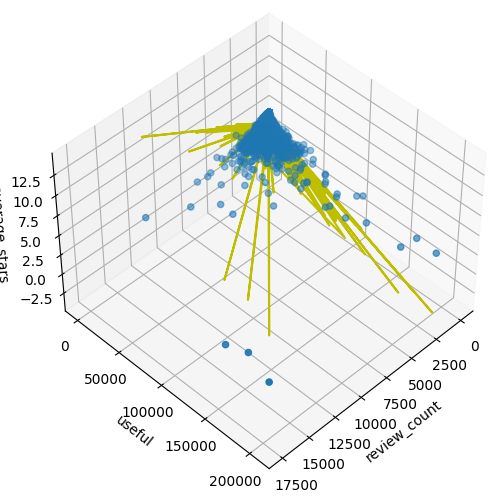

The linear regression equation is y = 3.6300263837356814 + -0.00012654452516180171*x_1 + 0.00010991907423870702*x_2
R2 is 0.00024019603942404544 
The mean squared error (MSE) is 1.3999494071192509
The root mean squared error (RMSE) is 1.1831945770325567



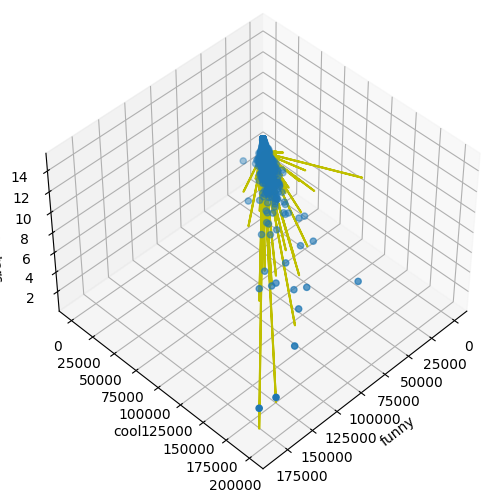

The linear regression equation is y = 3.630310873079317 + 8.257258804798046e-05*x_1 + 0.0001165477781617202*x_2
R2 is 3.6113154025074756e-05 
The mean squared error (MSE) is 1.4002351814755367
The root mean squared error (RMSE) is 1.183315334758887



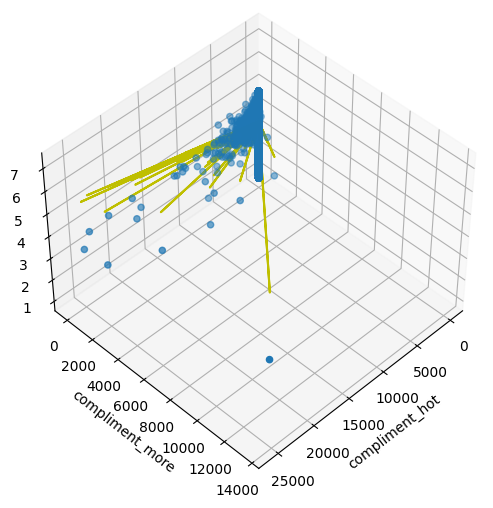

The linear regression equation is y = 3.6304546116343444 + 0.00016159235596041927*x_1 + 7.903040395323537e-05*x_2
R2 is 7.653558049769416e-06 
The mean squared error (MSE) is 1.4002750330422378
The root mean squared error (RMSE) is 1.1833321735853537



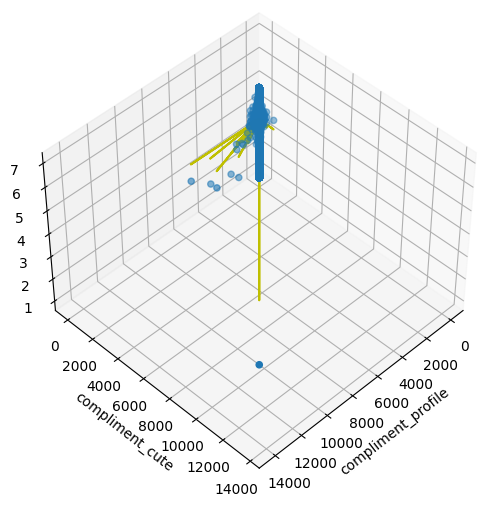

The linear regression equation is y = 3.63035482323849 + -1.657914663515068e-05*x_1 + 9.727896270376682e-05*x_2
R2 is 2.4044447788584833e-05 
The mean squared error (MSE) is 1.4002520811129033
The root mean squared error (RMSE) is 1.1833224755377982



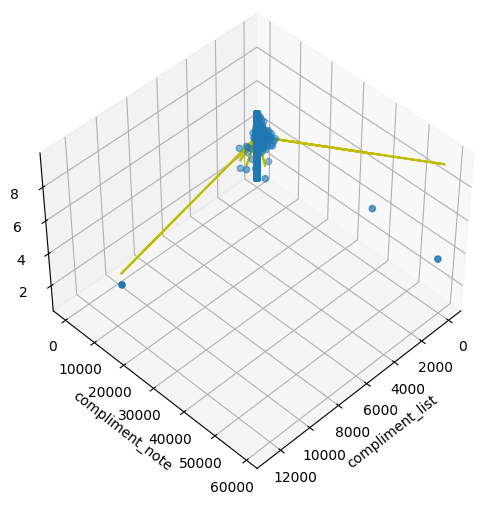

The linear regression equation is y = 3.630241184588441 + 1.0159201657148925e-05*x_1 + 7.859443234879538e-05*x_2
R2 is 5.368148453332999e-05 
The mean squared error (MSE) is 1.400210580792671
The root mean squared error (RMSE) is 1.1833049399003923



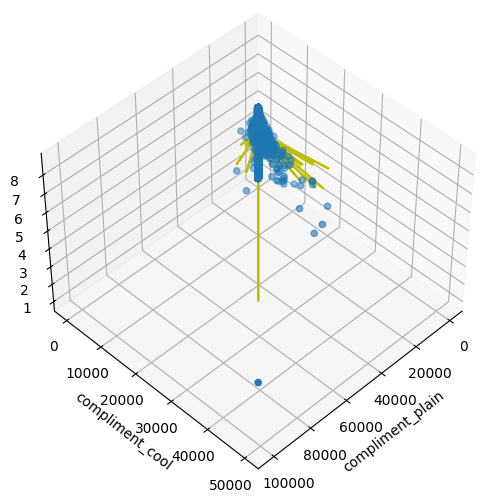

The linear regression equation is y = 3.6302054879071606 + 4.494498054521338e-05*x_1 + 0.000152870026214598*x_2
R2 is 5.747126272781511e-05 
The mean squared error (MSE) is 1.4002052740202688
The root mean squared error (RMSE) is 1.1833026975462655



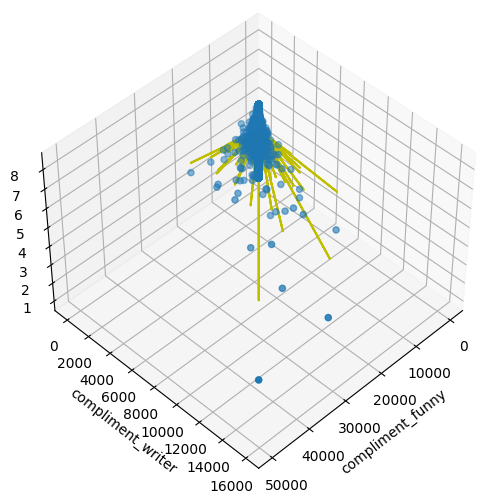

The linear regression equation is y = 3.630436824633199 + 5.685692422438339e-05*x_1 + -9.300260329779393e-05*x_2
R2 is 1.5464215053273556e-05 
The mean squared error (MSE) is 1.4002640958905361
The root mean squared error (RMSE) is 1.1833275522400957



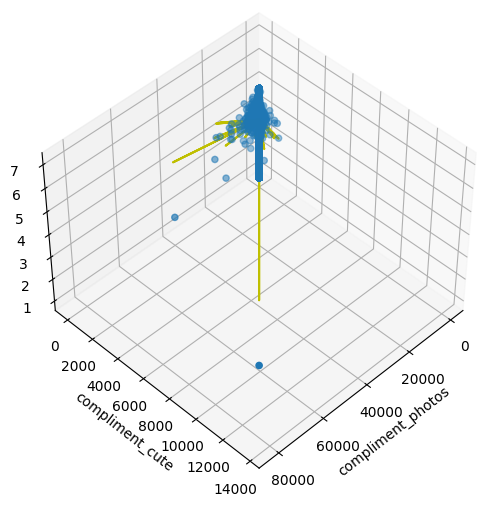

The linear regression equation is y = 3.6005604205474318 + -0.0010717820050336541*x_1 + 0.000590251565349656*x_2
R2 is 0.004428532277909958 
The mean squared error (MSE) is 1.3940845395674086
The root mean squared error (RMSE) is 1.1807135721958177



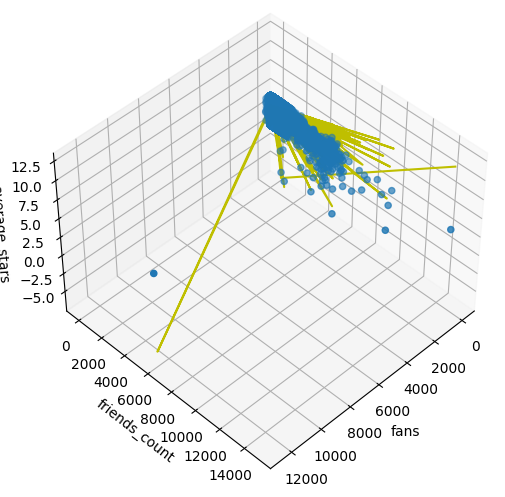

The linear regression equation is y = 3.223964609434605 + 0.037445610962542605*x_1 + 0.041674722373887474*x_2
R2 is 0.0136696780014528 
The mean squared error (MSE) is 1.3811442948951127
The root mean squared error (RMSE) is 1.1752209557760245



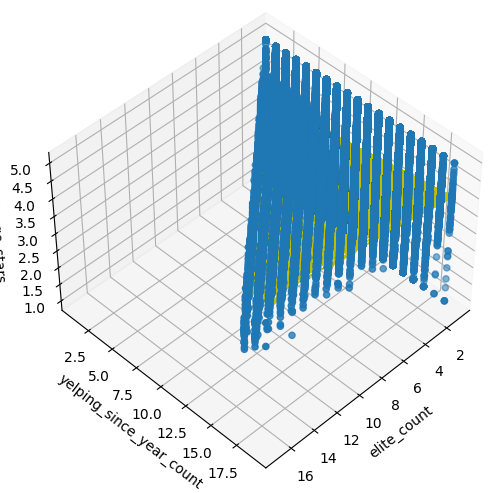

In [ ]:
# Set x & y values
pairs = [['review_count', 'useful'], ['funny', 'cool'], ['compliment_hot', 'compliment_more'], ['compliment_profile', 'compliment_cute'], ['compliment_list', 'compliment_note'], [
    'compliment_plain', 'compliment_cool'], ['compliment_funny', 'compliment_writer'], ['compliment_photos', 'compliment_cute'], ['fans', 'friends_count'], ['elite_count', 'yelping_since_year_count']]

for pair in pairs:
    x_, x_label = x[pair].values, list(x[pair].columns)
    y_, y_label = x['average_stars'].values, list(x[['average_stars']].columns)

    mlinear_regression_model(x_, y_, x_label, y_label)


### Polynomial Regression

Polynomial regression models create relationships between the input features and the target in higher degrees than the simple linear and multilinear regression models. 

We will write a simple function that produces two graphs:
1. The simple linear relationship between each column and average_stars
1. The polynomial linear relationsip between each column and average_stars

In [ ]:
def polynomial_regression_model(x, y, x_label, y_label, deg):
    """"This function takes in x and y in numpy array forms, and returns the
    polynomial regression equation, R2, MSE, and RMSE. This function works with 
    just one x variable.
    """
    # Create the polynomial regression model
    poly_reg = PolynomialFeatures(degree=deg)
    x_poly = poly_reg.fit_transform(x)

    # Create the linear regression model and fit x and y
    lin = linear_model.LinearRegression()
    lin.fit(x, y)

    # Create the linear regression model and fit x_poly and y
    lin2 = linear_model.LinearRegression()
    lin2.fit(x_poly, y)

    fig, axes = plt.subplots(1, 2, figsize=(20, 6))  # plot 2 graphs
    # Visualising the Linear Regression results
    axes[0].scatter(x, y, color='blue')
    axes[0].plot(x, lin.predict(x), color='red')
    axes[0].set_title('Linear Regression')

    # Visualising the Polynomial Regression results
    axes[1].scatter(x, y, color='blue')
    axes[1].plot(x, lin2.predict(poly_reg.fit_transform(x)), color='red')
    axes[1].set_title('Polynomial Regression')

    # Set the labels
    for ax in axes.flat:
        ax.set(xlabel=x_label, ylabel=y_label)

    plt.show()


review_count:


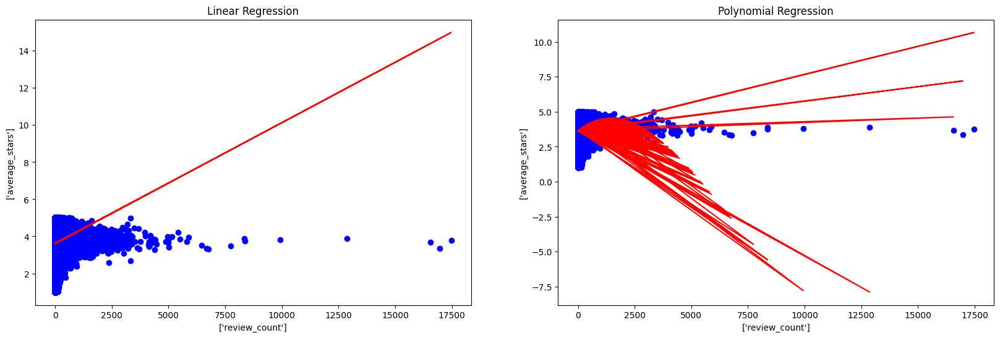

useful:


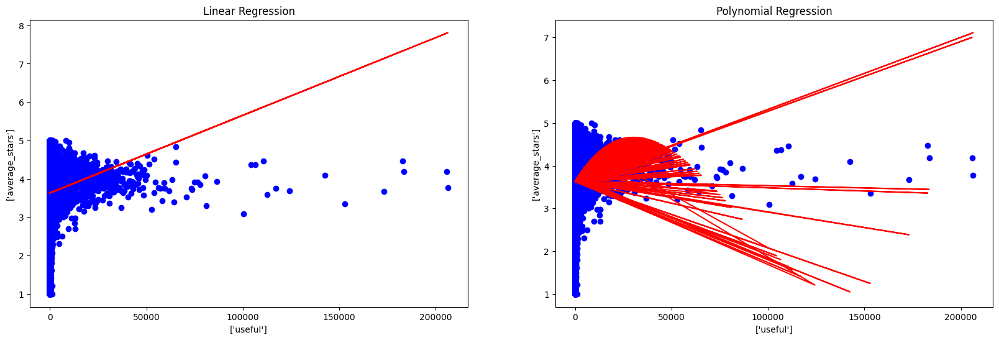

funny:


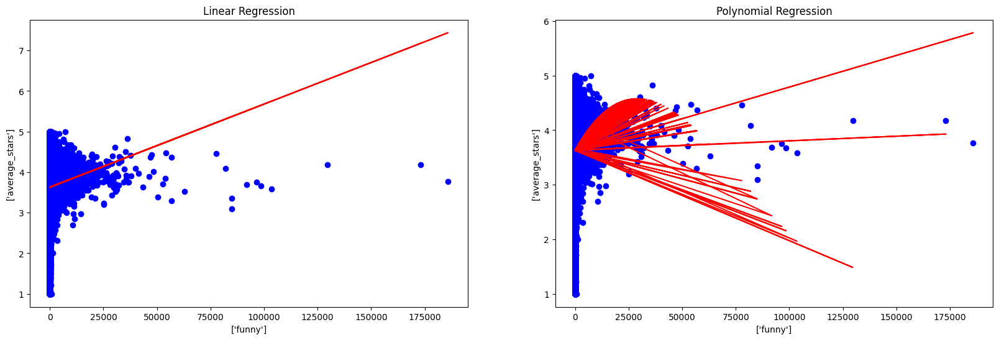

cool:


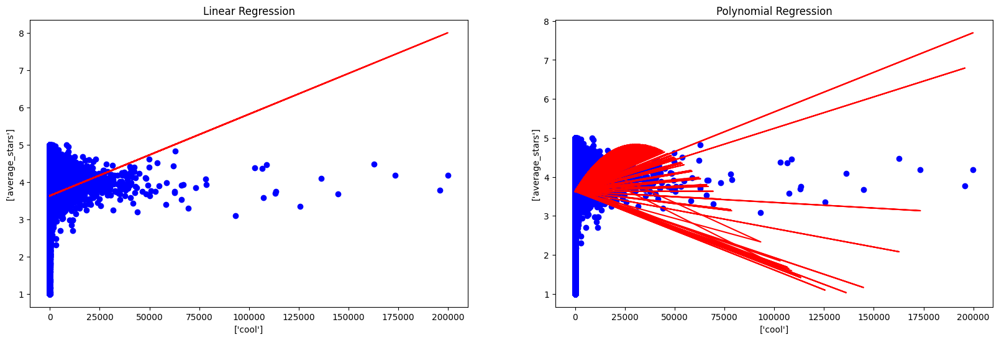

compliment_hot:


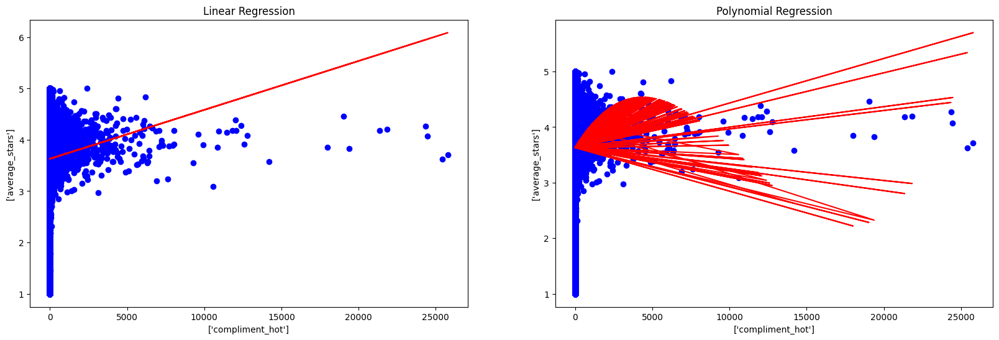

compliment_more:


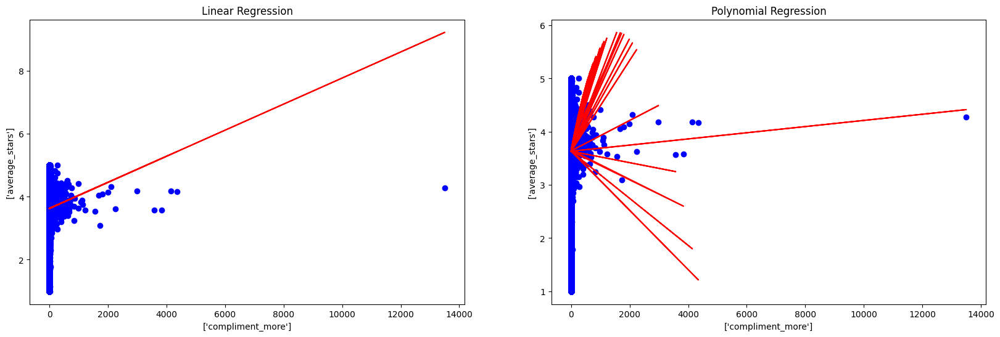

compliment_profile:


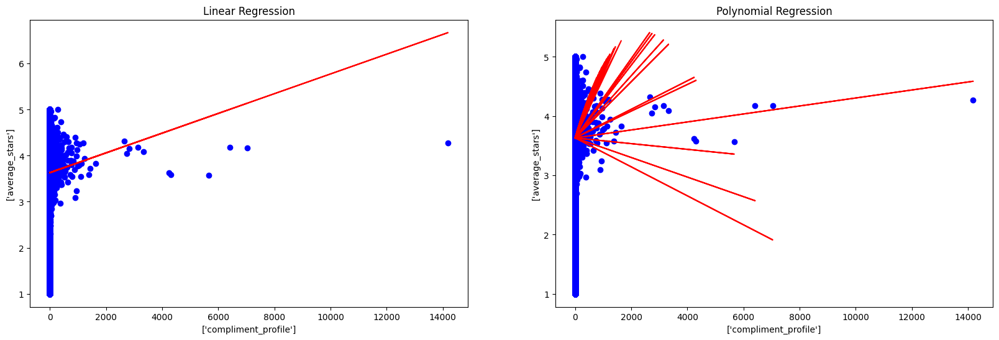

compliment_cute:


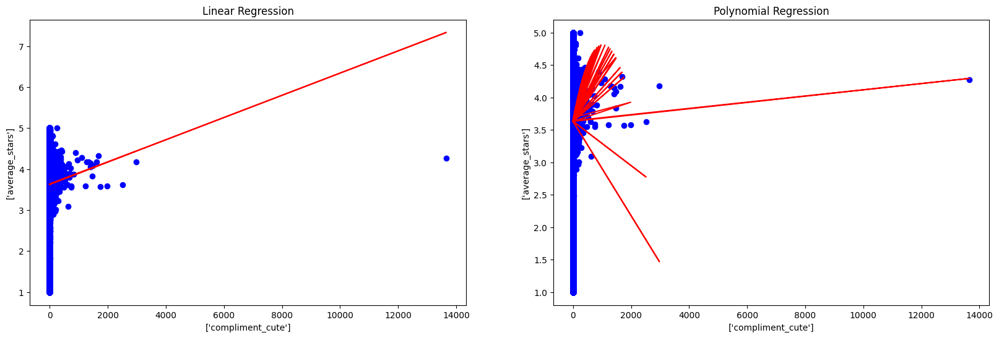

compliment_list:


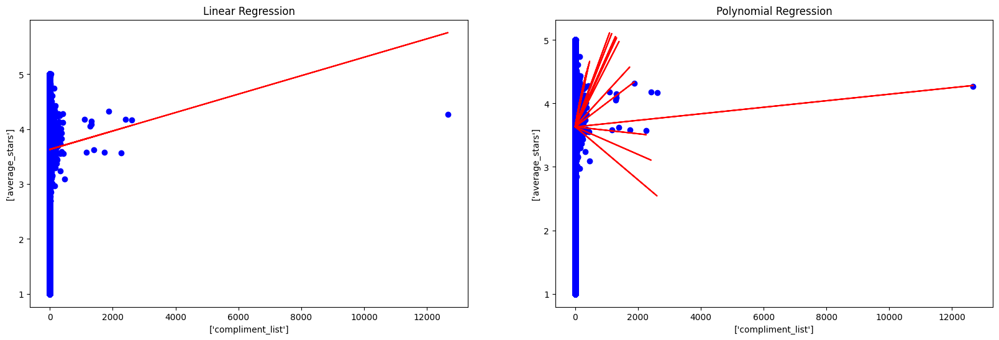

compliment_note:


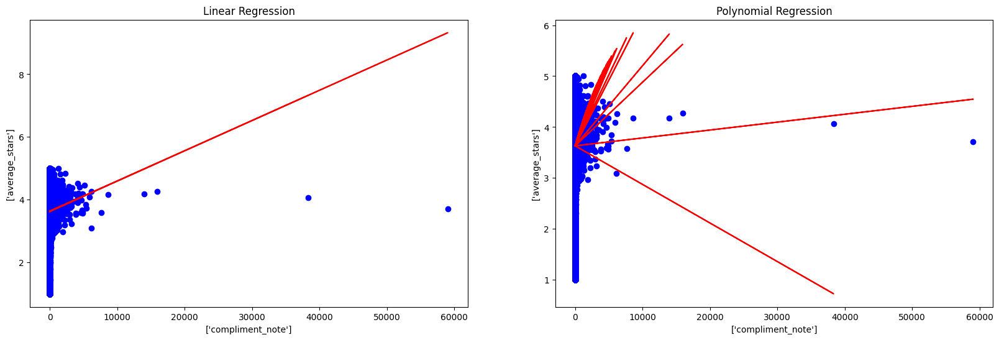

compliment_plain:


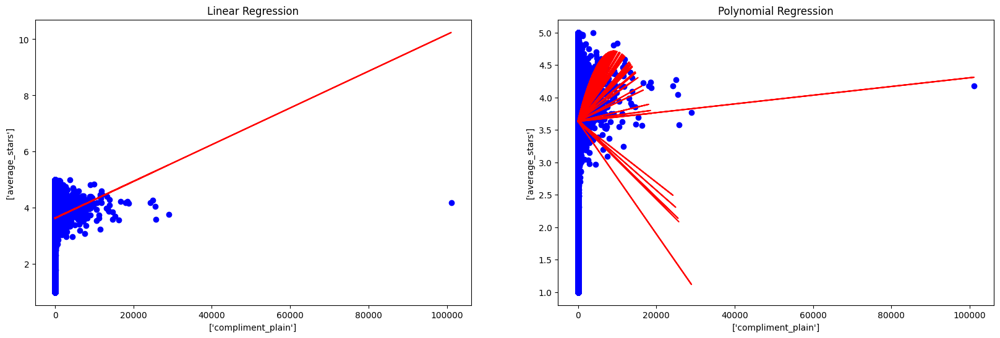

compliment_cool:


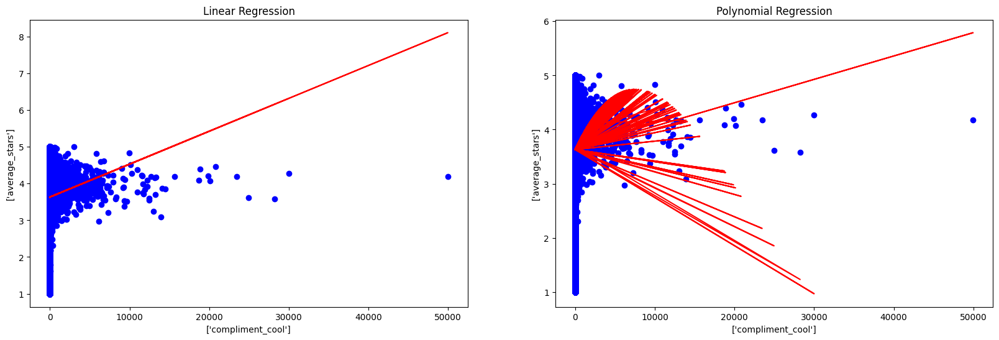

compliment_funny:


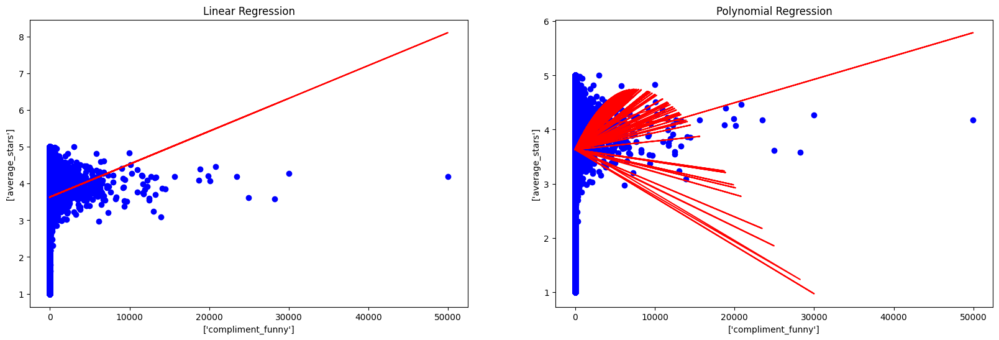

compliment_writer:


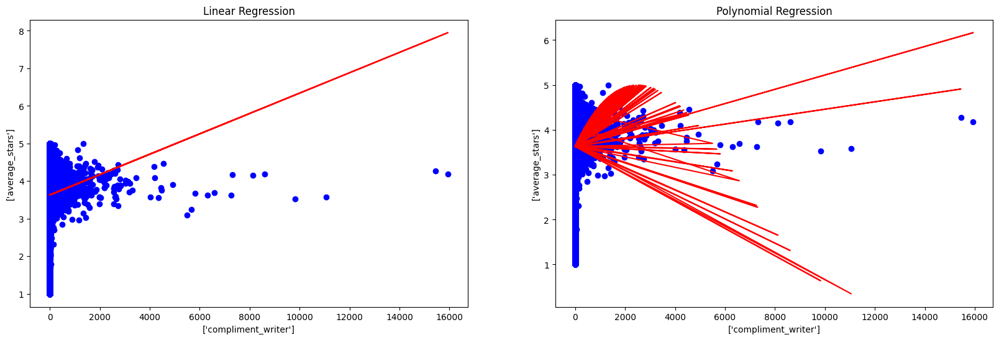

compliment_photos:


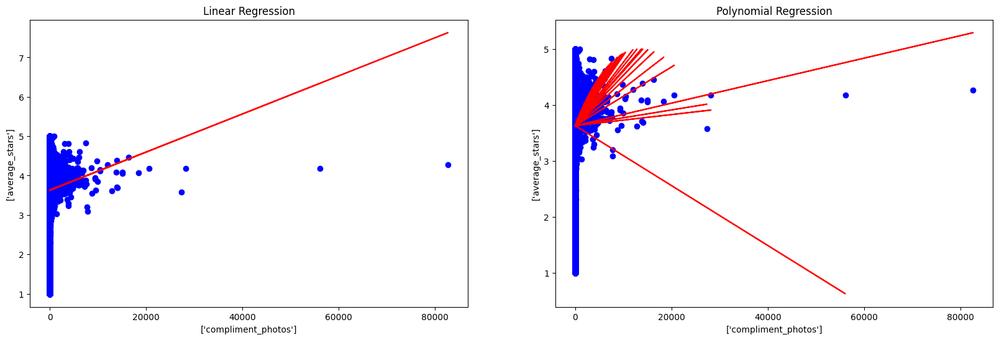

compliment_cute:


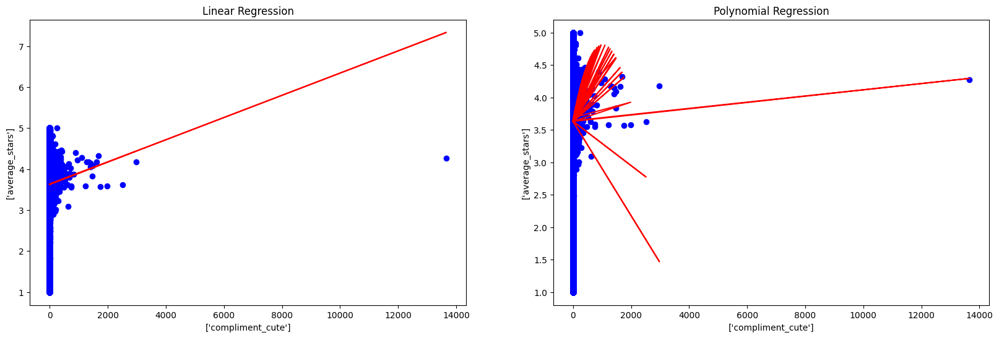

fans:


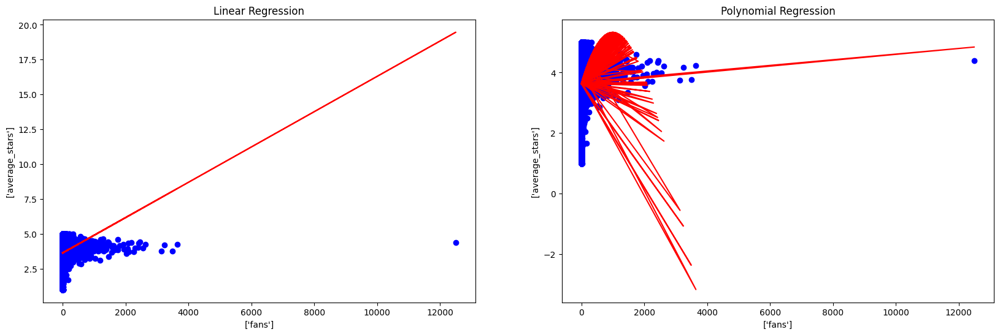

friends_count:


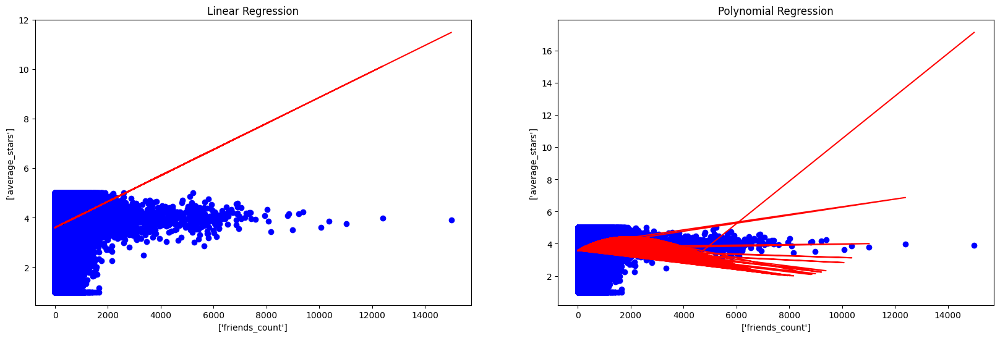

elite_count:


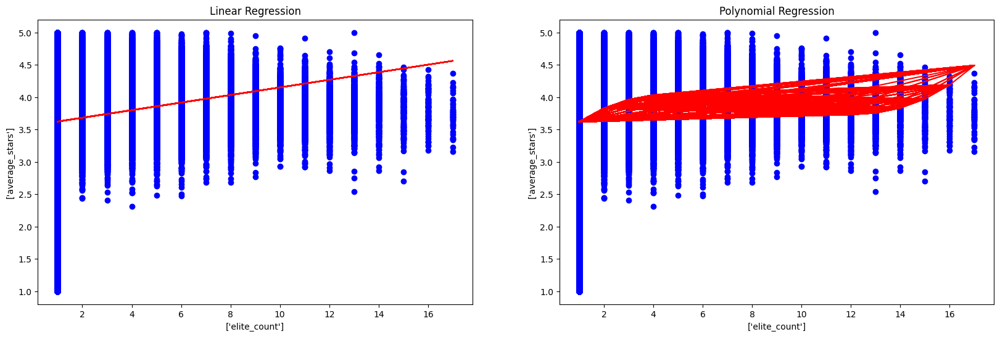

yelping_since_year_count:


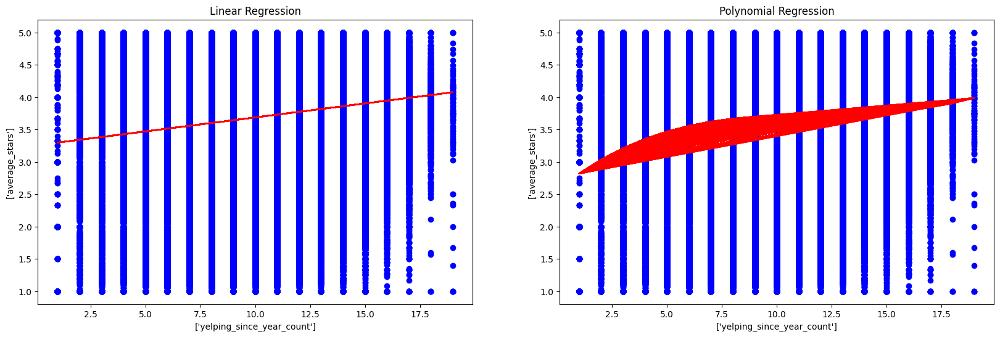

In [ ]:
# Set x & y values
for xdata in 'review_count', 'useful', 'funny', 'cool', 'compliment_hot', 'compliment_more', 'compliment_profile', 'compliment_cute', 'compliment_list', 'compliment_note', 'compliment_plain', 'compliment_cool', 'compliment_funny', 'compliment_writer', 'compliment_photos', 'compliment_cute', 'fans', 'friends_count', 'elite_count', 'yelping_since_year_count':
    print('{}:'.format(xdata))
    x_, x_label = x[[xdata]].values, list(x[[xdata]].columns)
    y_, y_label = x['average_stars'].values, list(x[['average_stars']].columns)

    polynomial_regression_model(x_, y_, x_label, y_label, 3)


### Regularization

In [ ]:
class RegressionModel():
    def __init__(self, df, ts=0.3, rs=1):
        print('Loading dataframe...')
        self.df = df
        self.x = self.df.drop(
            ['average_stars'], axis=1)
        self.y = self.df['average_stars']

        print('Train/Test splitting...')
        self.x_train, self.x_test, self.y_train, self.y_test = train_test_split(
            self.x, self.y, test_size=ts, random_state=rs)
        print('Creating simple linear regression model...')
        self.reg = linear_model.LinearRegression()
        print('Creating L1 regularized linear regression model (Lasso)...')
        self.lasso_reg = linear_model.Lasso(alpha=50, max_iter=500, tol=0.1)
        print('Creating L2 regularized linear regression model (Ridge)...')
        self.ridge_reg = linear_model.Ridge(alpha=50, max_iter=500, tol=0.1)

        print('All three regression models created successfully!')
        print('------------')
        self.fit()

    def fit(self):
        print('Fitting the simple linear regression model (R1)...')
        # using .values to suppress warnings
        self.reg.fit(self.x_train.values, self.y_train.values)
        print('Fitting the L1 regularized linear regression model (R2)...')
        self.lasso_reg.fit(self.x_train.values, self.y_train.values)
        print('Fitting the L2 regularized linear regression model (R3)...')
        self.ridge_reg.fit(self.x_train.values, self.y_train.values)

        print('All three models (R1/R2/R3) fitted successfully!')
        print('------------')

    def predict(self, x):
        x = np.array(x).reshape(1, -1)
        reg_pred = self.reg.predict(x)
        lasso_reg_pred = self.lasso_reg.predict(x)
        ridge_reg_pred = self.ridge_reg.predict(x)
        avg_pred = (reg_pred + lasso_reg_pred + ridge_reg_pred) / 3
        print('Using R1, y is predicted to be: {}'.format(str(reg_pred)))
        print('Using R2, y is predicted to be: {}'.format(str(lasso_reg_pred)))
        print('Using R3, y is predicted to be: {}'.format(str(ridge_reg_pred)))
        print('------------')
        print('The average prediction would be: {}'.format(str(avg_pred)))
        print('------------')

    def score(self):
        reg_score = self.reg.score(self.x_test.values, self.y_test.values)
        lasso_reg_score = self.lasso_reg.score(
            self.x_test.values, self.y_test.values)
        ridge_reg_score = self.ridge_reg.score(
            self.x_test.values, self.y_test.values)

        print('R1\'s score is: {}'.format(str(reg_score)))
        print('R2\'s score is: {}'.format(str(lasso_reg_score)))
        print('R3\'s score is: {}'.format(str(ridge_reg_score)))
        print('------------')

    def get_bias_var(self):
        models = {'R1': self.reg, 'R2': self.lasso_reg, 'R3': self.ridge_reg}

        for m in models:
            avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(
                models[m], self.x_train.values, self.y_train.values, self.x_test.values, self.y_test.values, loss='mse', num_rounds=5, random_seed=45)
            print('For regression model {}:'.format(m))
            print('++ Average Expected Loss: {}'.format(str(avg_expected_loss)))
            print('++ Average Bias: {}'.format(str(avg_bias)))
            print('++ Average Variance: {}'.format(str(avg_var)))
            print('------------')

    def __str__(self):
        models = {'R1': self.reg, 'R2': self.lasso_reg, 'R3': self.ridge_reg}

        formula = ''
        for m in models:
            formula += 'The linear regression formula for {} is as follows:\n'.format(
                m)
            formula += 'y = '
            formula += str(models[m].intercept_)
            for idx, coef in enumerate(models[m].coef_):
                if coef == 0.0:
                    continue
                if str(coef).startswith('-'):
                    formula += ' - '
                    coef = abs(coef)
                else:
                    formula += ' + '
                formula += '{}(x{})'.format(str(coef), str(idx + 1))
            formula += '\n\n'

            # print('{}:'.format(m))
            # print(formula)
        return formula


In [ ]:
reg_model = RegressionModel(x)

Loading dataframe...
Train/Test splitting...
Creating simple linear regression model...
Creating L1 regularized linear regression model (Lasso)...
Creating L2 regularized linear regression model (Ridge)...
All three regression models created successfully!
------------
Fitting the simple linear regression model (R1)...
Fitting the L1 regularized linear regression model (R2)...
Fitting the L2 regularized linear regression model (R3)...
All three models (R1/R2/R3) fitted successfully!
------------


In [ ]:
reg_model.score()

R1's score is: 0.01947179317846015
R2's score is: -1.6836472993553286e-07
R3's score is: 0.019471781062309845
------------


In [ ]:
reg_model.get_bias_var()


For regression model R1:
++ Average Expected Loss: 1.3759077419137813
++ Average Bias: 1.3754512066800482
++ Average Variance: 0.00045653523373298836
------------
For regression model R2:
++ Average Expected Loss: 1.4023511347825262
++ Average Bias: 1.402350601860552
++ Average Variance: 5.329219740964335e-07
------------
For regression model R3:
++ Average Expected Loss: 1.3759077573765954
++ Average Bias: 1.3754512510664325
++ Average Variance: 0.0004565063101633482
------------


In [ ]:
print(reg_model)


The linear regression formula for R1 is as follows:
y = 3.1947426069573055 + 0.001174407381231255(x1) - 0.0015617310413856473(x2) - 0.00023917281956763772(x3) + 0.0018098967517313584(x4) + 0.00016772539605830524(x5) + 1.747702919179587e-05(x6) - 0.0035144435471606314(x7) + 0.0010356677967518985(x8) - 0.003848499084848393(x9) + 0.003795707771193232(x10) + 3.9654941573251886e-05(x11) + 7.417043577057047e-05(x12) - 0.0001763782982919989(x13) - 0.00017637829829197552(x14) + 0.0011601733275779238(x15) - 2.8294198200916133e-05(x16) + 0.0254849998523367(x17) + 0.0005720978680429378(x18) + 0.0430850272757418(x19)

The linear regression formula for R2 is as follows:
y = 3.6303580886321276

The linear regression formula for R3 is as follows:
y = 3.1947463890626855 + 0.0011744258028370178(x1) - 0.001561729370250315(x2) - 0.0002391738769009012(x3) + 0.0018098943278804969(x4) + 0.00016773290169370164(x5) + 1.7473906451225197e-05(x6) - 0.0035142887594841175(x7) + 0.0010356653947328617(x8) - 0.003848

### Decision Tree Regression

Decision tree regression observes features of an object and trains a model in the structure of a tree to predict data in the future to produce meaningful continuous output. Continuous output means that the output/result is not discrete, i.e., it is not represented just by a discrete, known set of numbers or values.

In [ ]:
# prepare the train and test data
y = x['average_stars']
x = x.drop(['average_stars'], axis=1)

x_train, x_test, y_train, y_test = train_test_split(
    x, y, test_size=0.3, random_state=0)


In [ ]:
dtregressor = DecisionTreeRegressor()

dtregressor.fit(x_train, y_train)


DecisionTreeRegressor()

In [ ]:
columns = x.columns.tolist()

print(tree.export_text(dtregressor, feature_names=columns, show_weights=True))


|--- review_count <= 1.50
|   |--- useful <= 1.50
|   |   |--- funny <= 0.50
|   |   |   |--- yelping_since_year_count <= 3.50
|   |   |   |   |--- useful <= 0.50
|   |   |   |   |   |--- yelping_since_year_count <= 2.50
|   |   |   |   |   |   |--- cool <= 0.50
|   |   |   |   |   |   |   |--- friends_count <= 8.50
|   |   |   |   |   |   |   |   |--- review_count <= 0.50
|   |   |   |   |   |   |   |   |   |--- yelping_since_year_count <= 1.50
|   |   |   |   |   |   |   |   |   |   |--- value: [3.67]
|   |   |   |   |   |   |   |   |   |--- yelping_since_year_count >  1.50
|   |   |   |   |   |   |   |   |   |   |--- value: [4.33]
|   |   |   |   |   |   |   |   |--- review_count >  0.50
|   |   |   |   |   |   |   |   |   |--- compliment_plain <= 0.50
|   |   |   |   |   |   |   |   |   |   |--- compliment_photos <= 0.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 11
|   |   |   |   |   |   |   |   |   |   |--- compliment_photos >  0.50
|   |   |   | 

Probably best if we visualize the decision tree in a PDF file instead of inside this notebook.

In [ ]:
# create the tree figure object
tree_fig = tree.export_graphviz(
    dtregressor,
    feature_names=columns,
    filled=True)

# export the tree figure object a pdf file
graph = graphviz.Source(
    tree_fig,
    format='pdf')

graph.render(directory='./decision_trees/',
             filename='decision_tree_regression.pdf',
             format='pdf',
             view=False)


CalledProcessError: Command '[PosixPath('dot'), '-Kdot', '-Tpdf', '-O', 'decision_tree_regression.pdf']' died with <Signals.SIGSEGV: 11>. [stderr: b'']

Let's have a look at the model's feature importance.

([<matplotlib.axis.YTick at 0x178afc0a0>,
 [Text(0, 0, 'compliment_list'),
  Text(0, 1, 'elite_count'),
  Text(0, 2, 'compliment_cute'),
  Text(0, 3, 'compliment_profile'),
  Text(0, 4, 'compliment_photos'),
  Text(0, 5, 'compliment_cool'),
  Text(0, 6, 'compliment_hot'),
  Text(0, 7, 'compliment_funny'),
  Text(0, 8, 'compliment_more'),
  Text(0, 9, 'compliment_writer'),
  Text(0, 10, 'compliment_note'),
  Text(0, 11, 'compliment_plain'),
  Text(0, 12, 'fans'),
  Text(0, 13, 'cool'),
  Text(0, 14, 'funny'),
  Text(0, 15, 'yelping_since_year_count'),
  Text(0, 16, 'useful'),
  Text(0, 17, 'review_count'),
  Text(0, 18, 'friends_count')])

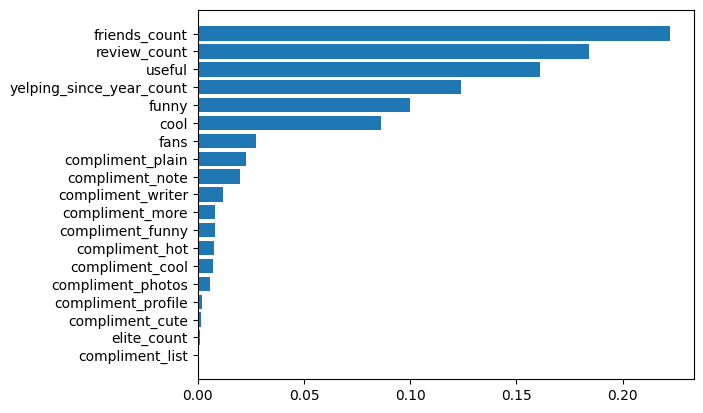

In [ ]:
importance = dtregressor.feature_importances_

indicies = np.argsort(importance)

plt.barh(range(len(indicies)), importance[indicies])
plt.yticks(range(len(indicies)), [columns[i] for i in indicies])


We will assess the model's different performance metrics.

In [ ]:
# predict new y's
y_pred = dtregressor.predict(x_test)

mae = metrics.mean_absolute_error(y_test, y_pred)
mse = metrics.mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = metrics.mean_absolute_percentage_error(y_test, y_pred)
r2_score = metrics.r2_score(y_test, y_pred)

print('MAE\t\t=', mae)
print('MSE\t\t=', mse)
print('RMSE\t\t=', rmse)
print('MAPE\t\t=', mape)  # value is under 10% which is very good
print('R2 Score\t=', r2_score)


MAE		= 0.9488951851489319
MSE		= 1.4949145952473109
RMSE		= 1.2226670009644125
MAPE		= 0.3906884612059821
R2 Score	= -0.07013736632071921


### Random Forest Regression

In [ ]:
rfregressor = RandomForestRegressor(n_jobs=-1)
rfregressor.fit(x_train, y_train)


RandomForestRegressor(n_jobs=-1)

Let's visualize the random forest regression model.

In [ ]:
columns = x_train.columns.tolist()
for tree_in_forest in rfregressor.estimators_:
    tree_fig = tree.export_graphviz(
        tree_in_forest, feature_names=columns, filled=True)
    graph = graphviz.Source(tree_fig, format='pdf')
    graph

graph.render(
    filename='random_forest_regression',
    directory='./decision_trees',
    format='pdf',
    view=False)


KeyboardInterrupt: 

Let's have a look at the model's feature importance.

([<matplotlib.axis.YTick at 0x179839a80>,
 [Text(0, 0, 'compliment_list'),
  Text(0, 1, 'compliment_cute'),
  Text(0, 2, 'elite_count'),
  Text(0, 3, 'compliment_profile'),
  Text(0, 4, 'compliment_photos'),
  Text(0, 5, 'compliment_hot'),
  Text(0, 6, 'compliment_funny'),
  Text(0, 7, 'compliment_cool'),
  Text(0, 8, 'compliment_more'),
  Text(0, 9, 'compliment_writer'),
  Text(0, 10, 'compliment_note'),
  Text(0, 11, 'compliment_plain'),
  Text(0, 12, 'fans'),
  Text(0, 13, 'cool'),
  Text(0, 14, 'funny'),
  Text(0, 15, 'yelping_since_year_count'),
  Text(0, 16, 'useful'),
  Text(0, 17, 'review_count'),
  Text(0, 18, 'friends_count')])

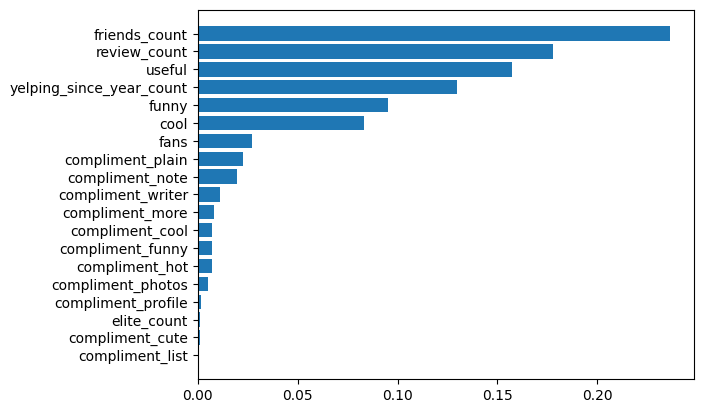

In [ ]:
importance = rfregressor.feature_importances_

indicies = np.argsort(importance)

plt.barh(range(len(indicies)), importance[indicies])
plt.yticks(range(len(indicies)), [columns[i] for i in indicies])


We will assess the model's different performance metrics.

In [ ]:
# predict new y's
y_pred = rfregressor.predict(x_test)

mae = metrics.mean_absolute_error(y_test, y_pred)
mse = metrics.mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mape = metrics.mean_absolute_percentage_error(y_test, y_pred)
r2_score = metrics.r2_score(y_test, y_pred)

print('MAE\t\t=', mae)
print('MSE\t\t=', mse)
print('RMSE\t\t=', rmse)
print('MAPE\t\t=', mape)  # value is under 10% which is very good
print('R2 Score\t=', r2_score)

MAE		= 0.8481881867594023
MSE		= 1.224104435802365
RMSE		= 1.1063925324234456
MAPE		= 0.36211219507881476
R2 Score	= 0.12372258509233447


### Decision Forests using Tensorflow

Just wanted to try out Tensorflow Decision Forests and see if it performs any better than Scikit-learn's implementation. Here's a quick excerpt from the Tensorflow webpage.

Decision forests are a family of machine learning algorithms with quality and speed competitive with (and often favorable to) neural networks, especially when you’re working with tabular data. They’re built from many decision trees, which makes them easy to use and understand - and you can take advantage of a plethora of interpretability tools and techniques that already exist today.

![Decision Forests](https://1.bp.blogspot.com/-Ax59WK4DE8w/YK6o9bt_9jI/AAAAAAAAEQA/9KbBf9cdL6kOFkJnU39aUn4m8ydThPenwCLcBGAsYHQ/s0/Random%2BForest%2B03.gif)

TF-DF brings this class of models along with a suite of tailored tools to TensorFlow users:

- Beginners will find it easier to develop and explain decision forest models. There is no need to explicitly list or pre-process input features (as decision forests can naturally handle numeric and categorical attributes), specify an architecture (for example, by trying different combinations of layers like you would in a neural network), or worry about models diverging. Once your model is trained, you can plot it directly or analyse it with easy to interpret statistics.
- Advanced users will benefit from models with very fast inference time (sub-microseconds per example in many cases). And, this library offers a great deal of composability for model experimentation and research. In particular, it is easy to combine neural networks and decision forests.

If you’re already using decision forests outside of TensorFlow, here’s a little of what TF-DF offers:

- It provides a slew of state-of-the-art Decision Forest training and serving algorithms such as random forests, gradient-boosted trees, CART, (Lambda)MART, DART, Extra Trees, greedy global growth, oblique trees, one-side-sampling, categorical-set learning, random categorical learning, out-of-bag evaluation and feature importance, and structural feature importance.
- This library can serve as a bridge to the rich TensorFlow ecosystem by making it easier for you to integrate tree-based models with various TensorFlow tools, libraries, and platforms such as TFX. 
- And for users new to neural networks, you can use decision forests as an easy way to get started with TensorFlow, and continue to explore neural networks from there.

In [ ]:
split = 0.8

# split into x_train and x_test dataframes (both include the target feature)
train_df = df_users.drop(['user_id', 'name', 'yelping_since',
                  'elite', 'friends'],
                  axis=1)[:int(split * df_users.shape[0])]

test_df = df_users.drop(['user_id', 'name', 'yelping_since',
                  'elite', 'friends'],
                  axis=1)[int(split * df_users.shape[0]):]


In [ ]:
# Convert the dataframes into a TensorFlow dataset
train_ds = tfdf.keras.pd_dataframe_to_tf_dataset(
    train_df, label="average_stars", task=tfdf.keras.Task.REGRESSION)

# Train the model
model = tfdf.keras.RandomForestModel(task=tfdf.keras.Task.REGRESSION)
model.fit(train_ds)


Use /var/folders/7n/_2mtj9_n18936qksyr5qs1zw0000gn/T/tmpzwgt0qyq as temporary training directory
Reading training dataset...


2023-01-27 16:07:19.546795: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


Training dataset read in 0:00:23.478550. Found 1590317 examples.
Training model...


[INFO 2023-01-27T16:13:24.859368+02:00 kernel.cc:1175] Loading model from path /var/folders/7n/_2mtj9_n18936qksyr5qs1zw0000gn/T/tmpzwgt0qyq/model/ with prefix cf99928ac4e147c3
[INFO 2023-01-27T16:13:44.86019+02:00 decision_forest.cc:640] Model loaded with 300 root(s), 8012834 node(s), and 19 input feature(s).
[INFO 2023-01-27T16:13:44.860244+02:00 abstract_model.cc:1307] Engine "RandomForestOptPred" built
[INFO 2023-01-27T16:13:44.860274+02:00 kernel.cc:1021] Use fast generic engine


Model trained in 0:06:05.047243
Compiling model...


2023-01-27 16:13:47.836541: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


Model compiled.


2023-01-27 16:13:48.049124: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


In [ ]:
# Convert the test dataframe to a TensorFlow dataset
test_ds = tfdf.keras.pd_dataframe_to_tf_dataset(
    test_df, label="average_stars", task=tfdf.keras.Task.REGRESSION)

# Evaluate the model
model.compile(metrics=["mse"])
print(model.evaluate(test_ds))

# Export the model to a TensorFlow SavedModel
model.save("./models/tfdf_regression_model")


2023-01-27 16:14:51.263427: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


398/398 [==============================] - 35s 86ms/step - loss: 0.0000e+00 - mse: 1.4339
[0.0, 1.4338690042495728]


INFO:tensorflow:Assets written to: ./models/tfdf_regression_model/assets


INFO:tensorflow:Assets written to: ./models/tfdf_regression_model/assets


And finally, let's visualize the model. This will store it in HTML format which can be viewed separately on any browser.

In [ ]:
with open('./tfdf_exports/regression_model.html', 'w') as f:
    f.write(tfdf.model_plotter.plot_model(model))

## Classification

For the classification problem we'll use the business dataset to predict the number of stars each business has based on the other columns in the dataset.

To do this we will define our x and y datasets, split them into train and test sets and then apply the different classification algorithms and compare the different metrics as well.

In [ ]:
df_business.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,categories,attributes_ByAppointmentOnly,attributes_BusinessAcceptsCreditCards,attributes_BikeParking,attributes_RestaurantsPriceRange2,attributes_CoatCheck,attributes_RestaurantsTakeOut,attributes_RestaurantsDelivery,attributes_Caters,attributes_WiFi,attributes_WheelchairAccessible,attributes_HappyHour,attributes_OutdoorSeating,attributes_HasTV,attributes_RestaurantsReservations,attributes_DogsAllowed,attributes_BusinessParking_garage,attributes_BusinessParking_street,attributes_BusinessParking_validated,attributes_BusinessParking_lot,attributes_BusinessParking_valet,attributes_Alcohol,attributes_GoodForKids,attributes_BusinessParking,attributes_RestaurantsAttire,attributes_Ambience,attributes_RestaurantsTableService,attributes_RestaurantsGoodForGroups,attributes_DriveThr,attributes_NoiseLevel,attributes_Ambience_romantic,attributes_Ambience_intimate,attributes_Ambience_touristy,attributes_Ambience_hipster,attributes_Ambience_divey,attributes_Ambience_classy,attributes_Ambience_trendy,attributes_Ambience_upscale,attributes_Ambience_casual,attributes_GoodForMeal_dessert,attributes_GoodForMeal_latenight,attributes_GoodForMeal_lunch,attributes_GoodForMeal_dinner,attributes_GoodForMeal_brunch,attributes_GoodForMeal_breakfast,attributes_BusinessAcceptsBitcoin,attributes_Smoking,attributes_GoodForDancing,attributes_Music_dj,attributes_Music_background_music,attributes_Music_no_music,attributes_Music_jukebox,attributes_Music_live,attributes_Music_video,attributes_Music_karaoke,attributes_AcceptsInsurance,attributes_BestNights_monday,attributes_BestNights_tuesday,attributes_BestNights_friday,attributes_BestNights_wednesday,attributes_BestNights_thursday,attributes_BestNights_sunday,attributes_BestNights_saturday,attributes_BYOB,attributes_Corkage,attributes_BYOBCorkage,attributes_HairSpecializesIn_straightperms,attributes_HairSpecializesIn_coloring,attributes_HairSpecializesIn_extensions,attributes_HairSpecializesIn_africanamerican,attributes_HairSpecializesIn_curly,attributes_HairSpecializesIn_kids,attributes_HairSpecializesIn_perms,attributes_HairSpecializesIn_asian,attributes_GoodForMeal,attributes_Open24Hours,attributes_RestaurantsCounterService,attributes_BestNights,attributes_AgesAllowed,attributes_HairSpecializesIn,attributes_Music,attributes_DietaryRestrictions_dairy-free,attributes_DietaryRestrictions_gluten-free,attributes_DietaryRestrictions_vegan,attributes_DietaryRestrictions_kosher,attributes_DietaryRestrictions_halal,attributes_DietaryRestrictions_soy-free,attributes_DietaryRestrictions_vegetarian,attributes_DietaryRestrictions,hours_Monday,hours_Tuesday,hours_Wednesday,hours_Thursday,hours_Friday,hours_Saturday,hours_Sunday
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.43,-119.71,5.00,7,0,"Doctors, Traditional Chinese Medicine, Naturop...",True,False,False,0,False,False,False,False,no,False,False,False,False,False,False,False,False,False,False,False,none,False,False,non-specific,False,False,False,False,average,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,no,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,no,False,False,False,False,False,False,False,False,False,False,False,False,allages,False,False,False,False,False,False,False,False,False,False,closed,closed,closed,closed,closed,closed,closed
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.55,-90.34,3.00,15,1,"Shipping Centers, Local Services, Notaries, Ma...",False,True,False,0,False,False,False,False,no,False,False,False,False,False,False,False,False,False,False,False,none,False,False,non-specific,False,False,False,False,average,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,no,False,False,False,False,False,False,False,

In [ ]:
df_business.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150346 entries, 0 to 150345
Columns: 107 entries, business_id to hours_Sunday
dtypes: bool(80), float64(3), int64(3), object(21)
memory usage: 42.4+ MB


In [ ]:
df_business.columns.tolist()

['business_id',
 'name',
 'address',
 'city',
 'state',
 'postal_code',
 'latitude',
 'longitude',
 'stars',
 'review_count',
 'is_open',
 'categories',
 'attributes_ByAppointmentOnly',
 'attributes_BusinessAcceptsCreditCards',
 'attributes_BikeParking',
 'attributes_RestaurantsPriceRange2',
 'attributes_CoatCheck',
 'attributes_RestaurantsTakeOut',
 'attributes_RestaurantsDelivery',
 'attributes_Caters',
 'attributes_WiFi',
 'attributes_WheelchairAccessible',
 'attributes_HappyHour',
 'attributes_OutdoorSeating',
 'attributes_HasTV',
 'attributes_RestaurantsReservations',
 'attributes_DogsAllowed',
 'attributes_BusinessParking_garage',
 'attributes_BusinessParking_street',
 'attributes_BusinessParking_validated',
 'attributes_BusinessParking_lot',
 'attributes_BusinessParking_valet',
 'attributes_Alcohol',
 'attributes_GoodForKids',
 'attributes_BusinessParking',
 'attributes_RestaurantsAttire',
 'attributes_Ambience',
 'attributes_RestaurantsTableService',
 'attributes_RestaurantsGoo

In [ ]:
# prepare the dataframe that will be used for the classification task
df = df_business.drop(['business_id', 'name', 'address', 'city',
                     'state', 'postal_code', 'latitude', 'longitude'], axis=1)

# first we need to encode the categorical data
cat_cols = [col for col in df.columns if df[col].dtype == 'object']
bool_cols = [col for col in df.columns if df[col].dtype == 'bool']

# create am OrdinalEncoder object and fit_transform it
oe = OrdinalEncoder()
for col in cat_cols:
    df[col] = oe.fit_transform(df[col].values.reshape(-1, 1))  # type: ignore

for col in bool_cols:
    df[col] = oe.fit_transform(df[col].values.reshape(-1, 1))  # type: ignore

# create a LabelEncoder object and fit_transform it
le = LabelEncoder()
df['stars'] = le.fit_transform(df['stars'].values.reshape(-1, 1))  # type: ignore


In [ ]:
df.head()

,stars,review_count,is_open,categories,attributes_ByAppointmentOnly,attributes_BusinessAcceptsCreditCards,attributes_BikeParking,attributes_RestaurantsPriceRange2,attributes_CoatCheck,attributes_RestaurantsTakeOut,attributes_RestaurantsDelivery,attributes_Caters,attributes_WiFi,attributes_WheelchairAccessible,attributes_HappyHour,attributes_OutdoorSeating,attributes_HasTV,attributes_RestaurantsReservations,attributes_DogsAllowed,attributes_BusinessParking_garage,attributes_BusinessParking_street,attributes_BusinessParking_validated,attributes_BusinessParking_lot,attributes_BusinessParking_valet,attributes_Alcohol,attributes_GoodForKids,attributes_BusinessParking,attributes_RestaurantsAttire,attributes_Ambience,attributes_RestaurantsTableService,attributes_RestaurantsGoodForGroups,attributes_DriveThr,attributes_NoiseLevel,attributes_Ambience_romantic,attributes_Ambience_intimate,attributes_Ambience_touristy,attributes_Ambience_hipster,attributes_Ambience_divey,attributes_Ambience_classy,attributes_Ambience_trendy,attributes_Ambience_upscale,attributes_Ambience_casual,attributes_GoodForMeal_dessert,attributes_GoodForMeal_latenight,attributes_GoodForMeal_lunch,attributes_GoodForMeal_dinner,attributes_GoodForMeal_brunch,attributes_GoodForMeal_breakfast,attributes_BusinessAcceptsBitcoin,attributes_Smoking,attributes_GoodForDancing,attributes_Music_dj,attributes_Music_background_music,attributes_Music_no_music,attributes_Music_jukebox,attributes_Music_live,attributes_Music_video,attributes_Music_karaoke,attributes_AcceptsInsurance,attributes_BestNights_monday,attributes_BestNights_tuesday,attributes_BestNights_friday,attributes_BestNights_wednesday,attributes_BestNights_thursday,attributes_BestNights_sunday,attributes_BestNights_saturday,attributes_BYOB,attributes_Corkage,attributes_BYOBCorkage,attributes_HairSpecializesIn_straightperms,attributes_HairSpecializesIn_coloring,attributes_HairSpecializesIn_extensions,attributes_HairSpecializesIn_africanamerican,attributes_HairSpecializesIn_curly,attributes_HairSpecializesIn_kids,attributes_HairSpecializesIn_perms,attributes_HairSpecializesIn_asian,attributes_GoodForMeal,attributes_Open24Hours,attributes_RestaurantsCounterService,attributes_BestNights,attributes_AgesAllowed,attributes_HairSpecializesIn,attributes_Music,attributes_DietaryRestrictions_dairy-free,attributes_DietaryRestrictions_gluten-free,attributes_DietaryRestrictions_vegan,attributes_DietaryRestrictions_kosher,attributes_DietaryRestrictions_halal,attributes_DietaryRestrictions_soy-free,attributes_DietaryRestrictions_vegetarian,attributes_DietaryRestrictions,hours_Monday,hours_Tuesday,hours_Wednesday,hours_Thursday,hours_Friday,hours_Saturday,hours_Sunday
0,8,7,0,23768.00,1.00,0.00,0.00,0,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,0.00,3.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1315.00,1414.00,1403.00,1462.00,1538.00,1439.00,1291.00
1,4,15,1,71017.00,0.00,1.00,0.00,0,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,0.00,3.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1191.00,1176.00,1233.00,1295.00,1170.00,1291.00
2,5,22,0,22260.00,0.00,1.00,1.00,2,0.00,0.00,0.00,0.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,2.00,0.00,0.00,3.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00

Let's have a look at our classification target (stars). There seems to be an imbalance specially in the lower number stars (1.00 and 1.50). We will not apply any oversampling techniques for now.

In [ ]:
df['stars'].value_counts()

6    31125
7    27181
5    26519
4    18453
8    16307
3    14316
2     9527
1     4932
0     1986
Name: stars, Length: 9, dtype: int64

It's always a good practice to investigate the relationship between the different values and each other. In other words, if column A values range between 1 and 5, but column B values range between 1 and 1,000,000, it's good to normalize those values.

For this we will use Sklearn's MinMaxScaler module that transforms values in a given range between 0 and 1.

In [ ]:
mms = MinMaxScaler()

for col in df.drop('stars', axis=1).columns.tolist():
    df[col] = mms.fit_transform(df[col].values.reshape(-1, 1))

df.head()

,stars,review_count,is_open,categories,attributes_ByAppointmentOnly,attributes_BusinessAcceptsCreditCards,attributes_BikeParking,attributes_RestaurantsPriceRange2,attributes_CoatCheck,attributes_RestaurantsTakeOut,attributes_RestaurantsDelivery,attributes_Caters,attributes_WiFi,attributes_WheelchairAccessible,attributes_HappyHour,attributes_OutdoorSeating,attributes_HasTV,attributes_RestaurantsReservations,attributes_DogsAllowed,attributes_BusinessParking_garage,attributes_BusinessParking_street,attributes_BusinessParking_validated,attributes_BusinessParking_lot,attributes_BusinessParking_valet,attributes_Alcohol,attributes_GoodForKids,attributes_BusinessParking,attributes_RestaurantsAttire,attributes_Ambience,attributes_RestaurantsTableService,attributes_RestaurantsGoodForGroups,attributes_DriveThr,attributes_NoiseLevel,attributes_Ambience_romantic,attributes_Ambience_intimate,attributes_Ambience_touristy,attributes_Ambience_hipster,attributes_Ambience_divey,attributes_Ambience_classy,attributes_Ambience_trendy,attributes_Ambience_upscale,attributes_Ambience_casual,attributes_GoodForMeal_dessert,attributes_GoodForMeal_latenight,attributes_GoodForMeal_lunch,attributes_GoodForMeal_dinner,attributes_GoodForMeal_brunch,attributes_GoodForMeal_breakfast,attributes_BusinessAcceptsBitcoin,attributes_Smoking,attributes_GoodForDancing,attributes_Music_dj,attributes_Music_background_music,attributes_Music_no_music,attributes_Music_jukebox,attributes_Music_live,attributes_Music_video,attributes_Music_karaoke,attributes_AcceptsInsurance,attributes_BestNights_monday,attributes_BestNights_tuesday,attributes_BestNights_friday,attributes_BestNights_wednesday,attributes_BestNights_thursday,attributes_BestNights_sunday,attributes_BestNights_saturday,attributes_BYOB,attributes_Corkage,attributes_BYOBCorkage,attributes_HairSpecializesIn_straightperms,attributes_HairSpecializesIn_coloring,attributes_HairSpecializesIn_extensions,attributes_HairSpecializesIn_africanamerican,attributes_HairSpecializesIn_curly,attributes_HairSpecializesIn_kids,attributes_HairSpecializesIn_perms,attributes_HairSpecializesIn_asian,attributes_GoodForMeal,attributes_Open24Hours,attributes_RestaurantsCounterService,attributes_BestNights,attributes_AgesAllowed,attributes_HairSpecializesIn,attributes_Music,attributes_DietaryRestrictions_dairy-free,attributes_DietaryRestrictions_gluten-free,attributes_DietaryRestrictions_vegan,attributes_DietaryRestrictions_kosher,attributes_DietaryRestrictions_halal,attributes_DietaryRestrictions_soy-free,attributes_DietaryRestrictions_vegetarian,attributes_DietaryRestrictions,hours_Monday,hours_Tuesday,hours_Wednesday,hours_Thursday,hours_Friday,hours_Saturday,hours_Sunday
0,8,0.00,0.00,0.29,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.50,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
1,4,0.00,1.00,0.85,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.50,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.84,0.84,0.84,0.84,0.81,1.00
2,5,0.00,0.00,0.27,0.00,1.00,1.00,0.50,0.00,0.00,0.00,0.00,0.50,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,

In [ ]:
x = df.drop('stars', axis=1)
y = df['stars']

x_train, x_test, y_train, y_test = train_test_split(
    x, y, test_size=0.2, random_state=0)


In [ ]:
# define the ClassifierModels class
class ClassifierModels():
    def __init__(self, df, x, y, x_test, y_test):
        '''Init function. Make sure to pass x_train and y_train here.'''

        self.df = df
        self.x = x
        self.y = y
        self.x_test = x_test
        self.y_test = y_test

        print('#' * 60)
        print(f'{" Loading dataframe ":#^60}')
        print('#' * 60)
        # print(f'{" Getting best parameters to create our models ":#^60}')
        # print('#' * 60)

        # hold abbreviations and full names
        self.model_abr = {'lr': 'Logistic Regression', 'knn': 'KNeighbors Classifier', 'dtc': 'Decision Tree Classifier',
                          'rfc': 'Random Forest Classifier', 'ensemble': 'Voting Classifier', 'xgb': 'XGB Classifier', 'nb': 'Naive Bayes'}
        # self.model_abr = {'lr': 'Logistic Regression', 'svm': 'Support Vector Machine', 'dtc': 'Decision Tree Classifier',
        #                   'rfc': 'Random Forest Classifier', 'ensemble': 'Voting Classifier', 'xgb': 'XGB Classifier', 'nb': 'Naive Bayes'}

        # hold the actual models
        self.models = {}
        self.model_predicts = {}
        self.model_predicts_proba = {}

        # loop over the models dict to get each model's best params
        for model in self.model_abr:
            print('#' * 60)
            print(f'{" " + self.model_abr[model] + " ":#^60}')
            print('#' * 60)
            # params = self.get_best_params(model)

            # print('+++++ Best parameters for the {} model: {}'.format(
            #     self.model_abr[model], params))
            print('+++++ Creating and fitting the {} model using its default parameters...'.format(
                self.model_abr[model]))

            if model == 'lr':
                # m = LogisticRegression(
                #     solver=params['solver'], penalty=params['penalty'], C=params['C'])
                m = LogisticRegression(solver='lbfgs', max_iter=500, n_jobs=-1)
                m.fit(self.x, self.y)

                self.models[model] = m

            elif model == 'knn':
                # m = KNeighborsClassifier(
                #     n_neighbors=params['n_neighbors'], weights=params['weights'], metric=params['metric'])
                m = KNeighborsClassifier(n_jobs=-1)
                m.fit(self.x, self.y)

                self.models[model] = m

            elif model == 'svm':
                # m = SVC(kernel=params['kernel'],
                #         C=params['C'], gamma=params['gamma'], probability=True)
                m = SVC(n_jobs=-1, probability=True)
                m.fit(self.x, self.y)

                self.models[model] = m

            elif model == 'dtc':
                # m = DecisionTreeClassifier(
                #     criterion=params['criterion'], splitter=params['splitter'], max_features=params['max_features'])
                m = DecisionTreeClassifier()
                m.fit(self.x, self.y)

                self.models[model] = m

            elif model == 'rfc':
                # m = RandomForestClassifier(
                #     n_estimators=params['n_estimators'], max_features=params['max_features'])
                m = RandomForestClassifier(n_jobs=-1)
                m.fit(self.x, self.y)

                self.models[model] = m

            elif model == 'ensemble':
                # m = VotingClassifier(estimators=[('Logistic Regression', self.models['lr']), ('Decission Tree Classifier', self.models['dtc']), (
                #     'Random Forrest Classifier', self.models['rfc']), ('KNN', self.models['knn']), ('SVM', self.models['svm'])], weights=[10, 10, 10, 10, 10], voting='soft')
                m = VotingClassifier(estimators=[('Logistic Regression', self.models['lr']), ('Decission Tree Classifier', self.models['dtc']), (
                    'Random Forrest Classifier', self.models['rfc']), ('KNN', self.models['knn'])], weights=[10, 10, 10, 10], voting='soft', n_jobs=-1)
                m.fit(self.x, self.y)

                self.models[model] = m

            elif model == 'xgb':
                m = XGBClassifier(use_label_encoder=False, n_jobs=-1)
                m.fit(self.x, self.y)

                self.models[model] = m

            elif model == 'nb':
                m = GaussianNB()
                m.fit(self.x, self.y)

                self.models[model] = m

        print('#' * 60)
        print(f'{" All models created and fitted successfully! ":#^60}')
        print('#' * 60)

        # loop over the models and get the y_pred
        for model in self.model_abr:
            y_pred = self.models[model].predict(self.x_test)

            self.model_predicts[model] = y_pred

        # loop over the models and get the y_pred_proba
        for model in self.model_abr:
            y_pred_proba = self.models[model].predict_proba(self.x_test)

            self.model_predicts_proba[model] = y_pred_proba
            
        print('#' * 60)
        print(f'{" All model predictions generated successfully! ":#^60}')
        print('#' * 60)

    @ignore_warnings(category=ConvergenceWarning)
    def get_best_params(self, model):
        '''This method returns the best params for hypertuning each model'''

        if model == 'lr':
            # model
            lr_model = LogisticRegression()

            # params
            solver = ['newton-cg', 'lbfgs', 'liblinear']
            penalty = ['l2']
            C = [100, 10, 1.0, 0.1, 0.01]
            lr_params = dict(solver=solver, penalty=penalty, C=C)

            # cross validation
            cv = RepeatedStratifiedKFold(
                n_splits=2, n_repeats=1, random_state=1)
            lr_gsearch = GridSearchCV(estimator=lr_model, param_grid=lr_params,
                                      cv=cv, scoring='accuracy', error_score=0, n_jobs=-1)
            lr_gresult = lr_gsearch.fit(self.x, self.y)

            return lr_gresult.best_params_

        elif model == 'knn':
            # model
            knn_model = KNeighborsClassifier()

            # params
            n_neighbors = range(1, 31, 2)
            weights = ['uniform', 'distance']
            metric = ['euclidean', 'manhattan', 'minkowski']
            knn_params = dict(n_neighbors=n_neighbors,
                              weights=weights, metric=metric)

            # cross validation
            cv = RepeatedStratifiedKFold(
                n_splits=2, n_repeats=1, random_state=1)
            knn_gsearch = GridSearchCV(estimator=knn_model, param_grid=knn_params,
                                       cv=cv, scoring='accuracy', error_score=0, n_jobs=-1)
            knn_gresult = knn_gsearch.fit(self.x, self.y)

            return knn_gresult.best_params_

        elif model == 'svm':
            # model
            svm_model = SVC()

            # params
            kernel = ['poly', 'rbf', 'sigmoid']
            C = [50, 10, 1.0, 0.1, 0.01]
            gamma = ['scale']
            svm_params = dict(kernel=kernel, C=C, gamma=gamma)

            # cross validation
            cv = RepeatedStratifiedKFold(
                n_splits=2, n_repeats=1, random_state=1)
            svm_gsearch = GridSearchCV(estimator=svm_model, param_grid=svm_params,
                                       cv=cv, scoring='accuracy', error_score=0, n_jobs=-1)
            svm_gresult = svm_gsearch.fit(self.x, self.y)

            return svm_gresult.best_params_

        elif model == 'dtc':
            # model
            dtc_model = DecisionTreeClassifier()

            # params
            criterion = ['gini', 'entropy', 'log_loss']
            splitter = ['best', 'random']
            max_features = ['sqrt', 'log2', None]
            dtc_params = dict(criterion=criterion,
                              splitter=splitter, max_features=max_features)

            # cross validation
            cv = RepeatedStratifiedKFold(
                n_splits=2, n_repeats=1, random_state=1)
            dtc_gsearch = GridSearchCV(estimator=dtc_model, param_grid=dtc_params,
                                       cv=cv, scoring='accuracy', error_score=0, n_jobs=-1)
            dtc_gresult = dtc_gsearch.fit(self.x, self.y)

            return dtc_gresult.best_params_

        elif model == 'rfc':
            # model
            rfc_model = RandomForestClassifier()

            # params
            n_estimators = [10, 100, 1000]
            max_features = ['sqrt', 'log2']
            rfc_params = dict(n_estimators=n_estimators,
                              max_features=max_features)

            # cross validation
            cv = RepeatedStratifiedKFold(
                n_splits=2, n_repeats=1, random_state=1)
            rfc_gsearch = GridSearchCV(estimator=rfc_model, param_grid=rfc_params,
                                       cv=cv, scoring='accuracy', error_score=0, n_jobs=-1)
            rfc_gresult = rfc_gsearch.fit(self.x, self.y)

            return rfc_gresult.best_params_

        elif model == 'ensemble':
            return

        elif model == 'xgb':
            return

        elif model == 'nb':
            return

        else:
            raise NameError(
                'No grid search model available for {}.'.format(model))

    def show_performance(self):
        '''This method prints the accuracy, precision, recall, and f1 score for each model.'''

        headers = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
        tbldata = []
        for model in self.models:
            accuracy = metrics.accuracy_score(
                self.y_test, self.model_predicts[model])
            f1score = metrics.f1_score(
                self.y_test, self.model_predicts[model], average='weighted', zero_division=0)
            precision = metrics.precision_score(
                self.y_test, self.model_predicts[model], average='weighted', zero_division=0)
            recall = metrics.recall_score(
                self.y_test, self.model_predicts[model], average='weighted', zero_division=0)

            tbldata.append([self.model_abr[model], accuracy,
                           precision, recall, f1score])

        return tabulate(tbldata, headers=headers, tablefmt="pretty")

In [ ]:
cm = ClassifierModels(df, x_train, y_train, x_test, y_test)


############################################################
#################### Loading dataframe #####################
############################################################
############################################################
################### Logistic Regression ####################
############################################################
+++++ Creating and fitting the Logistic Regression model using its default parameters...


/Users/sergani/virtual_envs/yelp_project/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


############################################################
################## KNeighbors Classifier ###################
############################################################
+++++ Creating and fitting the KNeighbors Classifier model using its default parameters...
############################################################
################# Decision Tree Classifier #################
############################################################
+++++ Creating and fitting the Decision Tree Classifier model using its default parameters...
############################################################
################# Random Forest Classifier #################
############################################################
+++++ Creating and fitting the Random Forest Classifier model using its default parameters...
############################################################
#################### Voting Classifier #####################
##################################################

/Users/sergani/virtual_envs/yelp_project/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


############################################################
###################### XGB Classifier ######################
############################################################
+++++ Creating and fitting the XGB Classifier model using its default parameters...
############################################################
####################### Naive Bayes ########################
############################################################
+++++ Creating and fitting the Naive Bayes model using its default parameters...
############################################################
####### All models created and fitted successfully! ########
############################################################
############################################################
###### All model predictions generated successfully! #######
############################################################


### Model Performance

In my opinion, the scores are too low. This is probably due to the high number of columns/features being passed on to the different ML algorithms which are just not too well suited for this application.

In [ ]:
print('Model Performance:\n', cm.show_performance(), sep='')


Model Performance:
+--------------------------+---------------------+---------------------+---------------------+---------------------+
|                          |      Accuracy       |      Precision      |       Recall        |      F1 Score       |
+--------------------------+---------------------+---------------------+---------------------+---------------------+
|   Logistic Regression    | 0.2537080146325241  | 0.24961291532438315 | 0.2537080146325241  | 0.22471341188902408 |
|  KNeighbors Classifier   | 0.2152643831060858  | 0.22601980297477503 | 0.2152643831060858  | 0.21846000644270294 |
| Decision Tree Classifier | 0.21905553708014633 | 0.22125320280345412 | 0.21905553708014633 | 0.2200370706081514  |
| Random Forest Classifier | 0.2668107748586631  | 0.25838612235030545 | 0.2668107748586631  | 0.2604676446220762  |
|    Voting Classifier     | 0.23155969404722315 | 0.23072843998266304 | 0.23155969404722315 | 0.23107854315948775 |
|      XGB Classifier      | 0.29022281343531

### ROC

Text(0.5, 1.0, 'ROC Curve')

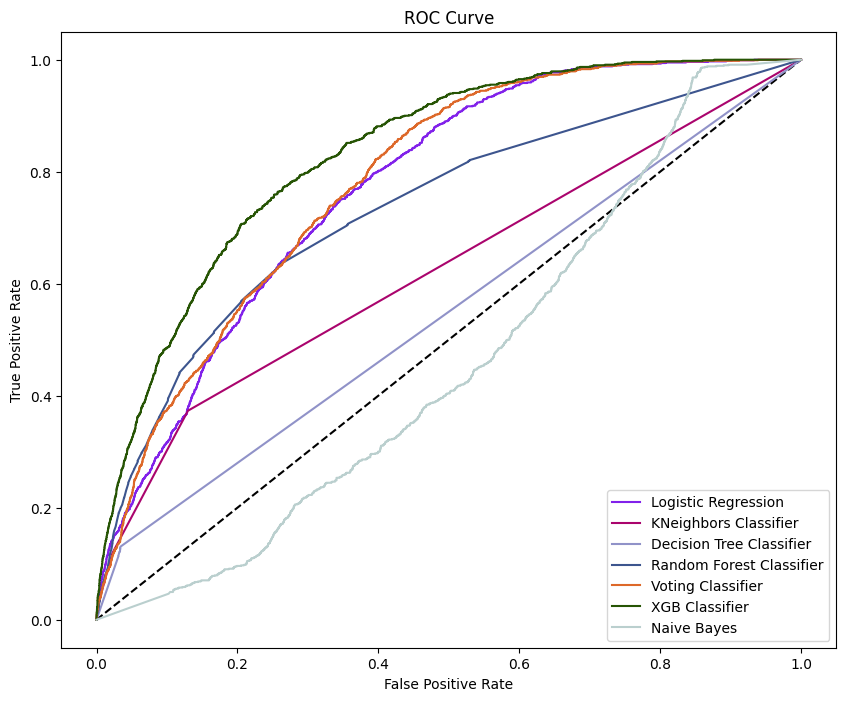

In [ ]:
# empty dictionary to hold the roc values
roc_results = {}

# get the fpr and tpr for each set of models
for model in cm.model_abr:
    fpr, tpr, thresholds = metrics.roc_curve(
        cm.y_test, cm.model_predicts_proba[model][:, 1], pos_label=1)

    roc_results[model] = [fpr, tpr, thresholds]

# three subplots please
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

# plot the ROC
ax.plot([0, 1], [0, 1], 'k--')
for model in roc_results:
    ax.plot(roc_results[model][0],
             roc_results[model][1], c=np.random.rand(3,), label=cm.model_abr[model])
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')

ax.legend()
ax.set_title('ROC Curve')

### AUC

In [ ]:
# table headers and a dictionary to hold the values
headers = ['AUC']
tbl_data_dict = {}

# loop over the classifier models and then their keys abbreviated keys
# for model in [cm_base, cm_smote, cm_rus]:
# for model in [cm_base, cm_rus]:
for k in cm.model_abr:
    auc = metrics.roc_auc_score(
        cm.y_test, cm.model_predicts_proba[k], multi_class='ovo')
    tbl_data_dict.setdefault(cm.model_abr[k], []).append(auc)

# create the table data from the dictionary created above
# tabulate doesn't take table data in the form of dictionary created above
tbldata = []
for k, v in tbl_data_dict.items():
    tbldata.append([k] + v)

print(tabulate(tbldata, headers=headers, tablefmt='pretty'))


+--------------------------+--------------------+
|                          |        AUC         |
+--------------------------+--------------------+
|   Logistic Regression    | 0.6885952602781892 |
|  KNeighbors Classifier   | 0.6056827123629591 |
| Decision Tree Classifier | 0.5429435535412661 |
| Random Forest Classifier | 0.6816778328266015 |
|    Voting Classifier     | 0.6914028049277668 |
|      XGB Classifier      | 0.7374800400485563 |
|       Naive Bayes        | 0.5931268651091434 |
+--------------------------+--------------------+


In [ ]:
# store the AUC values inside a dataframe to make it easier to visualize
df_auc = pd.DataFrame(['AUC'], columns=['Data']).merge(
    right=pd.DataFrame(tbl_data_dict), left_index=True, right_index=True)

df_auc.melt(id_vars=['Data'], var_name='Model', value_name='AUC')

,Data,Model,AUC
0,AUC,Logistic Regression,0.69
1,AUC,KNeighbors Classifier,0.61
2,AUC,Decision Tree Classifier,0.54
3,AUC,Random Forest Classifier,0.68
4,AUC,Voting Classifier,0.69
5,AUC,XGB Classifier,0.74
6,AUC,Naive Bayes,0.59


Text(0.5, 1.0, 'AUC for Models')

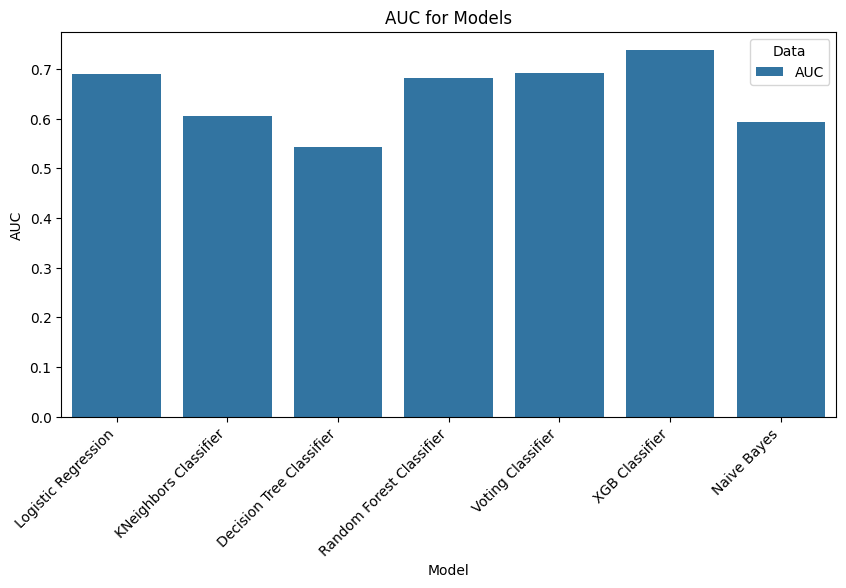

In [ ]:
fig, axes = plt.subplots(figsize=(10, 5))
ax = sns.barplot(df_auc.melt(id_vars=['Data'], var_name='Model',
                 value_name='AUC'), x='Model', y='AUC', hue='Data')
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
ax.set_title('AUC for Models')

### Decision Forests using Tensorflow

In [ ]:
split = 0.8

# split into x_train and x_test dataframes (both include the target feature)
train_df = df[:int(split * df.shape[0])]

test_df = df[int(split * df.shape[0]):]


In [ ]:
# Convert the dataframes into a TensorFlow dataset
train_ds = tfdf.keras.pd_dataframe_to_tf_dataset(train_df, label="stars", task=tfdf.keras.Task.CLASSIFICATION)

# Train the model
model = tfdf.keras.RandomForestModel(task=tfdf.keras.Task.CLASSIFICATION)
model.fit(train_ds)


Use /var/folders/7n/_2mtj9_n18936qksyr5qs1zw0000gn/T/tmp9661bolk as temporary training directory
Reading training dataset...


2023-01-27 16:24:04.195881: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


Training dataset read in 0:00:07.204535. Found 120276 examples.
Training model...


[INFO 2023-01-27T16:24:48.381636+02:00 kernel.cc:1175] Loading model from path /var/folders/7n/_2mtj9_n18936qksyr5qs1zw0000gn/T/tmp9661bolk/model/ with prefix 9db4d2c4332f4c15
[INFO 2023-01-27T16:25:07.199567+02:00 decision_forest.cc:640] Model loaded with 300 root(s), 3034746 node(s), and 85 input feature(s).
[INFO 2023-01-27T16:25:07.199602+02:00 abstract_model.cc:1307] Engine "RandomForestGeneric" built
[INFO 2023-01-27T16:25:07.19963+02:00 kernel.cc:1021] Use fast generic engine


Model trained in 0:00:58.034344
Compiling model...
Model compiled.


2023-01-27 16:25:09.273238: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2023-01-27 16:25:09.479291: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


In [ ]:
# Convert the test dataframe to a TensorFlow dataset
test_ds = tfdf.keras.pd_dataframe_to_tf_dataset(
    test_df, label="stars", task=tfdf.keras.Task.CLASSIFICATION)

# Evaluate the model
model.compile(metrics=["accuracy"])
print(model.evaluate(test_ds))

# Export the model to a TensorFlow SavedModel
model.save("./models/tfdf_classification_model")


2023-01-27 16:25:12.735204: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


31/31 [==============================] - 4s 117ms/step - loss: 0.0000e+00 - accuracy: 0.2849
[0.0, 0.2849351465702057]


INFO:tensorflow:Assets written to: ./models/tfdf_classification_model/assets


INFO:tensorflow:Assets written to: ./models/tfdf_classification_model/assets


And finally, let's visualize the model. This will store it in HTML format which can be viewed separately on any browser.

In [ ]:
with open('./tfdf_exports/classification_model.html', 'w') as f:
    f.write(tfdf.model_plotter.plot_model(model))

## Clustering

In [ ]:
pass

# Deep Learning

In this section we will deploy deep learning on the photos dataset, where we will build three different classification models. One will be a very basic model, another will be more advanced, and the third will be based off an existing model using transfer learning.

Since we'll be working with 200,100 photos, it will be unwise to store them all in memory. We will have to rely on keras's image_dataset_from_directory function to generate deliver the images to our code directly from disk. This requires howver that images are stored in subdirectories first, where each subdirectory is the image's class or label.

Based on pandas profiling, here are our labels (hugely disproportionate):

![Image Classes](./screenshots/image_classes.png)


In [ ]:
# we don't need the rest of the data for this exercise
df_photos = df_photos[['photo_id', 'label']]

df_photos.head()

,photo_id,label
0,zsvj7vloL4L5jhYyPIuVwg,inside
1,HCUdRJHHm_e0OCTlZetGLg,outside
2,vkr8T0scuJmGVvN2HJelEA,drink
3,pve7D6NUrafHW3EAORubyw,food
4,H52Er-uBg6rNrHcReWTD2w,food


In [ ]:
def move_photo(photo_ids, label):
    '''Move photos to folder and return new pathname of photo'''

    folder_photos = './photos/photos/'
    folder_label = folder_photos + label + '/'

    # create labelled directories first
    if not os.path.exists(folder_label):
        os.mkdir(folder_label)

    # move image to new location

    # print(photo_ids)
    for img in photo_ids:
        image_file = img + '.jpg'
        curr_location = folder_photos + image_file
        new_location = folder_label + image_file

        if os.path.exists(folder_photos + image_file):
            shutil.move(curr_location, new_location)

        # return new_location


In [ ]:
for label in df_photos['label'].unique().tolist():
    print(label)
    photo_ids = df_photos[(df_photos['label'] == label)]['photo_id'].values.tolist()
    move_photo(photo_ids, label)


inside
outside
drink
food
menu


Unfortunately some of the images in the dataset are not actually images or are just broken files so we need to delete them.

In [ ]:
from pathlib import Path
import imghdr

for label in df_photos['label'].unique().tolist():
    data_dir = f'./photos/photos/{label}/'
    # add there all your images file extensions
    image_extensions = ['.png', '.jpg', '.jpeg']

    img_type_accepted_by_tf = ['bmp', 'gif', 'jpeg', 'png']
    for filepath in Path(data_dir).rglob('*'):
        if filepath.suffix.lower() in image_extensions:
            img_type = imghdr.what(filepath)
            if img_type is None:
                print(f'{filepath} is not an image, deleting.')
                os.remove(filepath)
            elif img_type not in img_type_accepted_by_tf:
                print(
                    f'{filepath} is a {img_type}, not accepted by TensorFlow, deleting.')
                os.remove(filepath)


photos/photos/inside/yAf6R6OSgPo8-mmdDh8qIw.jpg is not an image, deleting.
photos/photos/food/43fHlHSYQ_79OBJW1aVUxA.jpg is not an image, deleting.
photos/photos/food/AMSyCOP3-Eb_ivNA8w1Vhw.jpg is not an image, deleting.
photos/photos/food/AkiGRjaMKHdJyV7bdHsQjw.jpg is not an image, deleting.
photos/photos/food/LhLfsQtYwJ5OmEzilubhXQ.jpg is not an image, deleting.
photos/photos/food/B7xR9CuhRpP52PoehQHVow.jpg is not an image, deleting.
photos/photos/food/PjfJoBrEFgDrxiJy8nyatA.jpg is not an image, deleting.
photos/photos/food/pW1IPuTdLIUB61goirbXaA.jpg is not an image, deleting.
photos/photos/food/CA9z96gGA4y9QOes2Y9eGw.jpg is not an image, deleting.
photos/photos/food/cNkUV0sInfh_Py5PP8SHtQ.jpg is not an image, deleting.
photos/photos/food/hjEfal2a1DWRDu8_AUDLNg.jpg is not an image, deleting.
photos/photos/food/74upe0h6XxwgzqpdnAh_7Q.jpg is not an image, deleting.
photos/photos/food/gJH0d6Sut4eZDlbV0GCByg.jpg is not an image, deleting.
photos/photos/food/N6hL8FQ84A2DznF2S2Lp7g.jpg is 

Furthermore, some of the images are actually PNG and Keras will complain about them later on. It may be a good idea to get rid of those using your bash terminal. Here's a small script that can be used to clean them up.

`cd photos/photos/`

`for f in food/*.jpg ; do if [[ $(file -b "$f") =~ PNG ]]; then echo "$f"; rm "$f"; fi; done`

`for f in drink/*.jpg ; do if [[ $(file -b "$f") =~ PNG ]]; then echo "$f"; rm "$f"; fi; done`

`for f in inside/*.jpg ; do if [[ $(file -b "$f") =~ PNG ]]; then echo "$f"; rm "$f"; fi; done`

`for f in outside/*.jpg ; do if [[ $(file -b "$f") =~ PNG ]]; then echo "$f"; rm "$f"; fi; done`

`for f in menu/*.jpg ; do if [[ $(file -b "$f") =~ PNG ]]; then echo "$f"; rm "$f"; fi; done`

Now we're ready to split the data into training and validation datasets using Keras's the *image_dataset_from_directory* utility which allows us to create the datasets without loading all the images in memory.

In [ ]:
batch_size = 16
img_height = 128
img_width = 128

data_dir = './photos/photos/'

train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=0,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=0,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 198050 files belonging to 5 classes.
Using 158440 files for training.
Found 198050 files belonging to 5 classes.
Using 39610 files for validation.


Let's visualize some of the data just to make sure we're on the right path.

In [ ]:
class_names = train_ds.class_names
num_classes = len(class_names)
print(class_names)

['drink', 'food', 'inside', 'menu', 'outside']


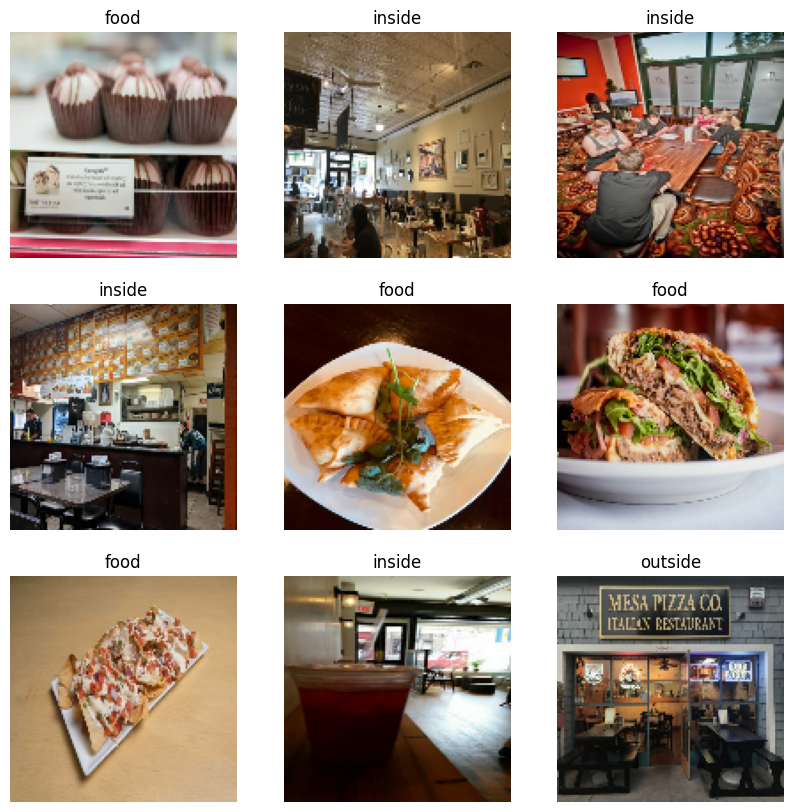

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

In [ ]:
for image_batch, labels_batch in train_ds:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

(32, 128, 128, 3)
(32,)


According to the documentation, we need to make sure to use buffered prefetching, so that we can yield data from disk without having I/O become blocking. These are two important methods we should use when loading data:

- *Dataset.cache* keeps the images in memory after they're loaded off disk during the first epoch. This will ensure the dataset does not become a bottleneck while training the model. If the dataset is too large to fit into memory, we can also use this method to create a performant on-disk cache.
- *Dataset.prefetch* overlaps data preprocessing and model execution while training.

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(512).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

Since images are in the RGB channel, which have values between 0 and 255, this is not ideal for a neural network. We need to normalize the values so that they fall between 0 and 1. We will implement this within the models themselves and keep the data as is for now.

## Baseline Model

In [ ]:
%load_ext tensorboard

# create folders
# now = datetime.now().strftime('%Y%m%d%H%M')
log_folder = f'Tensorboard Logs/Baseline Model'

# callbacks for TensorBoard
callbacks = TensorBoard(log_dir=log_folder, histogram_freq=1)

model = Sequential()
model.add(Rescaling(1. / 255, input_shape=(img_height, img_width, 3)))
model.add(Conv2D(16, (3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D((2, 2)))
model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(MaxPooling2D((2, 2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(num_classes, activation='softmax'))

# compile model
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'])

model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 128, 128, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 128, 128, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 32, 32, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 64)        1

In [ ]:
epochs = 10

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/10


2023-01-27 23:02:18.041214: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-01-27 23:02:25.857197: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-01-27 23:02:27.312006: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-01-27 23:02:28.118377: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 558 of 1000
2023-01-27 23:02:31.502044: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-01-27 23:02:35.680797: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-01-27 23:02:35.760760: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.


 155/5000 [..............................] - ETA: 2:50 - loss: 0.8317 - accuracy: 0.6996

2023-01-27 23:02:43.018436: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


 191/5000 [>.............................] - ETA: 2:49 - loss: 0.8093 - accuracy: 0.7093

2023-01-27 23:02:44.279118: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


 241/5000 [>.............................] - ETA: 2:49 - loss: 0.7843 - accuracy: 0.7203

2023-01-27 23:02:46.107418: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


 271/5000 [>.............................] - ETA: 2:47 - loss: 0.7644 - accuracy: 0.7254

2023-01-27 23:02:47.156759: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


 493/5000 [=>............................] - ETA: 2:39 - loss: 0.6952 - accuracy: 0.7523

2023-01-27 23:02:54.999419: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


 679/5000 [===>..........................] - ETA: 2:32 - loss: 0.6446 - accuracy: 0.7707

2023-01-27 23:03:01.548639: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


 775/5000 [===>..........................] - ETA: 2:29 - loss: 0.6240 - accuracy: 0.7783

2023-01-27 23:03:05.019685: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


 933/5000 [====>.........................] - ETA: 2:26 - loss: 0.6017 - accuracy: 0.7870

2023-01-27 23:03:11.279364: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


1361/5000 [=======>......................] - ETA: 2:26 - loss: 0.5567 - accuracy: 0.8042

2023-01-27 23:03:32.348169: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


1496/5000 [=======>......................] - ETA: 2:23 - loss: 0.5446 - accuracy: 0.8085

2023-01-27 23:03:38.698178: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


1660/5000 [========>.....................] - ETA: 2:18 - loss: 0.5319 - accuracy: 0.8133

2023-01-27 23:03:46.348062: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


1982/5000 [==========>...................] - ETA: 2:09 - loss: 0.5149 - accuracy: 0.8193

2023-01-27 23:04:02.448395: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


2190/5000 [============>.................] - ETA: 2:01 - loss: 0.5035 - accuracy: 0.8237

2023-01-27 23:04:12.598156: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


2266/5000 [============>.................] - ETA: 1:58 - loss: 0.5005 - accuracy: 0.8247

2023-01-27 23:04:15.916308: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


2429/5000 [=============>................] - ETA: 1:52 - loss: 0.4946 - accuracy: 0.8268

2023-01-27 23:04:23.547730: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


2490/5000 [=============>................] - ETA: 1:49 - loss: 0.4922 - accuracy: 0.8276

2023-01-27 23:04:26.447527: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


2783/5000 [===============>..............] - ETA: 1:37 - loss: 0.4829 - accuracy: 0.8312

2023-01-27 23:04:39.762292: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


2858/5000 [================>.............] - ETA: 1:34 - loss: 0.4802 - accuracy: 0.8322

2023-01-27 23:04:44.247175: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


2904/5000 [================>.............] - ETA: 1:33 - loss: 0.4786 - accuracy: 0.8327

2023-01-27 23:04:46.901124: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


2912/5000 [================>.............] - ETA: 1:33 - loss: 0.4786 - accuracy: 0.8327

2023-01-27 23:04:47.297816: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


3119/5000 [=================>............] - ETA: 1:24 - loss: 0.4710 - accuracy: 0.8354

2023-01-27 23:04:57.597534: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


3295/5000 [==================>...........] - ETA: 1:16 - loss: 0.4667 - accuracy: 0.8368

2023-01-27 23:05:05.764819: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


3326/5000 [==================>...........] - ETA: 1:15 - loss: 0.4656 - accuracy: 0.8371

2023-01-27 23:05:07.165514: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


3829/5000 [=====================>........] - ETA: 52s - loss: 0.4530 - accuracy: 0.8411

2023-01-27 23:05:30.463694: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


4999/5000 [============================>.] - ETA: 0s - loss: 0.4307 - accuracy: 0.8494

2023-01-27 23:06:21.561779: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-01-27 23:06:23.146840: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-01-27 23:06:28.559031: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-01-27 23:06:32.814738: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-01-27 23:06:34.564899: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2023-01-27 23:06:49.778480: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


5000/5000 [==============================] - 274s 51ms/step - loss: 0.4306 - accuracy: 0.8494 - val_loss: 0.3291 - val_accuracy: 0.8841
Epoch 2/10
5000/5000 [==============================] - 298s 60ms/step - loss: 0.3005 - accuracy: 0.8948 - val_loss: 0.3413 - val_accuracy: 0.8824
Epoch 3/10
5000/5000 [==============================] - 292s 58ms/step - loss: 0.2289 - accuracy: 0.9182 - val_loss: 0.3239 - val_accuracy: 0.8902
Epoch 4/10
5000/5000 [==============================] - 297s 59ms/step - loss: 0.1579 - accuracy: 0.9434 - val_loss: 0.4056 - val_accuracy: 0.8908
Epoch 5/10
5000/5000 [==============================] - 317s 63ms/step - loss: 0.1010 - accuracy: 0.9639 - val_loss: 0.5023 - val_accuracy: 0.8829
Epoch 6/10
5000/5000 [==============================] - 313s 63ms/step - loss: 0.0685 - accuracy: 0.9753 - val_loss: 0.6286 - val_accuracy: 0.8805
Epoch 7/10
5000/5000 [==============================] - 299s 60ms/step - loss: 0.0548 - accuracy: 0.9805 - val_loss: 0.7761 - val

In [ ]:
# save model
model.save('./models/cnn_baseline_model.h5')


## Enhanced Model

In [ ]:
%load_ext tensorboard

# create folders
# now = datetime.now().strftime('%Y%m%d%H%M')
log_folder = f'Tensorboard Logs/Enahnced Model'

# callbacks for TensorBoard
tb = TensorBoard(log_dir=log_folder, histogram_freq=1)
es = EarlyStopping(
    monitor='val_loss',
    min_delta=0,
    patience=3,
    verbose=0,
    mode='auto',
    baseline=None,
    restore_best_weights=True)

model_enhanced = Sequential()
model_enhanced.add(Rescaling(1. / 255, input_shape=(img_height, img_width, 3)))
model_enhanced.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model_enhanced.add(BatchNormalization())
model_enhanced.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model_enhanced.add(BatchNormalization())
model_enhanced.add(MaxPooling2D((2, 2)))
model_enhanced.add(Dropout(0.2))
model_enhanced.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
model_enhanced.add(BatchNormalization())
model_enhanced.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
model_enhanced.add(BatchNormalization())
model_enhanced.add(MaxPooling2D((2, 2)))
model_enhanced.add(Dropout(0.3))
model_enhanced.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
model_enhanced.add(BatchNormalization())
model_enhanced.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
model_enhanced.add(BatchNormalization())
model_enhanced.add(MaxPooling2D((2, 2)))
model_enhanced.add(Dropout(0.4))
model_enhanced.add(Flatten())
model_enhanced.add(Dense(128, activation='relu'))
model_enhanced.add(BatchNormalization())
model_enhanced.add(Dropout(0.5))
model_enhanced.add(Dense(num_classes))

# compile model
model_enhanced.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'])

model_enhanced.summary()


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 128, 128, 3)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 128, 128, 32)      896       
                                                                 
 batch_normalization_7 (Batc  (None, 128, 128, 32)     128       
 hNormalization)                                                 
                                                                 
 conv2d_7 (Conv2D)           (None, 128, 128, 32)      9248      
                                                                 
 batch_normalization_8 (Batc  (None, 128, 128, 32)     128       
 hNormalization)                                                 
                              

In [ ]:
# fit model
history_enhanced = model_enhanced.fit(
    train_ds,
    epochs=10,
    validation_data=val_ds,
    callbacks=[tb, es],
    verbose=1)

Epoch 1/10


2023-01-28 15:19:13.732302: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-01-28 15:19:23.942270: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 218 of 1000
2023-01-28 15:19:33.947101: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 463 of 1000
2023-01-28 15:19:43.940876: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 714 of 1000
2023-01-28 15:19:53.955905: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 957 of 1000
2023-01-28 15:19:55.909859: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.


2476/2476 [==============================] - ETA: 0s - loss: 0.4426 - accuracy: 0.8502

2023-01-28 15:31:05.805116: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


2476/2476 [==============================] - 766s 289ms/step - loss: 0.4426 - accuracy: 0.8502 - val_loss: 0.3482 - val_accuracy: 0.8812
Epoch 2/10
2476/2476 [==============================] - 715s 289ms/step - loss: 0.2775 - accuracy: 0.9019 - val_loss: 0.4729 - val_accuracy: 0.8619
Epoch 3/10
2476/2476 [==============================] - 713s 288ms/step - loss: 0.1757 - accuracy: 0.9371 - val_loss: 0.2957 - val_accuracy: 0.8972
Epoch 4/10
2476/2476 [==============================] - 803s 324ms/step - loss: 0.0698 - accuracy: 0.9752 - val_loss: 0.3634 - val_accuracy: 0.9067
Epoch 5/10
2476/2476 [==============================] - 1532s 619ms/step - loss: 0.0355 - accuracy: 0.9881 - val_loss: 0.5110 - val_accuracy: 0.8920
Epoch 6/10
2476/2476 [==============================] - 1510s 610ms/step - loss: 0.0261 - accuracy: 0.9910 - val_loss: 0.4272 - val_accuracy: 0.9118


In [ ]:
# save model
model_enhanced.save('./models/cnn_enhanced_model.h5')

## Transfer Learning

For this we will use the infamous VGG16 model to train on our data. We start by loading our images again using *image_dataset_from_directory*.

In [ ]:
batch_size = 32
img_height = 128
img_width = 128

data_dir = './photos/photos/'

train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=0,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=0,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 198050 files belonging to 5 classes.
Using 158440 files for training.


2023-01-30 10:48:46.956014: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-30 10:48:46.992475: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-30 10:48:46.992767: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-30 10:48:46.993377: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operati

Found 198050 files belonging to 5 classes.
Using 39610 files for validation.


In [ ]:
class_names = train_ds.class_names
num_classes = len(class_names)
print(class_names)

['drink', 'food', 'inside', 'menu', 'outside']


And then we start building our model. We include the VGG16 model without the top layers. And then we add an input and rescaling layer before it.

In [ ]:
initial_model = keras.applications.VGG16(include_top=False, weights='imagenet')
input = Input(shape=(img_height, img_width, 3), name='image_input')
x = Rescaling(1. / 255)(initial_model(input))


Now we have a model without the top layers, otherwise known as the output layer. We'll add those here.

In [ ]:
avg = GlobalAveragePooling2D()(x)
output = Dense(num_classes)(avg)

final_model = keras.models.Model(inputs=input, outputs=output)

We now have to freeze all the middle layers to avoid changing the trained VGG16 weights when we start training the output layers. Let's have a look at the number of trainable parameters after we do this.

As you can see, we only have 2,565 trainiable parameters, while 14,717,253 are non-trainable for now.

In [ ]:
for layer in initial_model.layers:
    layer.trainable = False

final_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 image_input (InputLayer)    [(None, 128, 128, 3)]     0         
                                                                 
 vgg16 (Functional)          (None, None, None, 512)   14714688  
                                                                 
 rescaling (Rescaling)       (None, 4, 4, 512)         0         
                                                                 
 global_average_pooling2d (G  (None, 512)              0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 5)                 2565      
                                                                 
Total params: 14,717,253
Trainable params: 2,565
Non-trainable params: 14,714,688
_____________________________________________

We are now ready to start training/fitting our new model with the training and validation datasets. We do this by training the final compiled model for just 5 epochs, and a generally speaking big learning rate.

In [ ]:
# we use a larger learning rate and a small number of epochs to get those weights converged quickly
optimizer = keras.optimizers.Adam(learning_rate=0.2)

final_model.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    optimizer=optimizer,
    metrics=['accuracy'])

history = final_model.fit(
    train_ds,
    epochs=5,
    validation_data=val_ds,
    verbose=1)

Epoch 1/5


2023-01-30 10:48:58.963861: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8100
2023-01-30 10:49:02.585159: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x7f78f1168f70 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-01-30 10:49:02.585198: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
2023-01-30 10:49:02.590582: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-01-30 10:49:02.616948: W tensorflow/compiler/xla/service/gpu/nvptx_helper.cc:56] Can't find libdevice directory ${CUDA_DIR}/nvvm/libdevice. This may result in compilation or runtime failures, if the program we try to run uses routines from libdevice.
Searched for CUDA in the following directories:
  /usr/lib/cuda
  /usr/local/cuda-11.2
  /usr/local/cuda
  .

4952/4952 [==============================] - 268s 53ms/step - loss: 0.3398 - accuracy: 0.8976 - val_loss: 0.3263 - val_accuracy: 0.9029
Epoch 2/5
4952/4952 [==============================] - 269s 54ms/step - loss: 0.3460 - accuracy: 0.9001 - val_loss: 0.3058 - val_accuracy: 0.9060
Epoch 3/5
4952/4952 [==============================] - 252s 51ms/step - loss: 0.3466 - accuracy: 0.8999 - val_loss: 0.4030 - val_accuracy: 0.8867
Epoch 4/5
4952/4952 [==============================] - 276s 56ms/step - loss: 0.3464 - accuracy: 0.9002 - val_loss: 0.3347 - val_accuracy: 0.8999
Epoch 5/5
4952/4952 [==============================] - 281s 57ms/step - loss: 0.3459 - accuracy: 0.9002 - val_loss: 0.3328 - val_accuracy: 0.8998


In [ ]:
final_model.save('./models/cnn_transfer_learning_1.h5')  # with frozen layers

The next step is to unfreeze the middle layers of the model and retrain the whole model at a smaller learning rate. 

In [ ]:
%load_ext tensorboard

# create folders
# now = datetime.now().strftime('%Y%m%d%H%M')
log_folder = f'Tensorboard Logs/Transfer Learning Model'

# callbacks for TensorBoard
tb = TensorBoard(log_dir=log_folder, histogram_freq=1)
es = EarlyStopping(
    monitor='val_loss',
    min_delta=0,
    patience=3,
    verbose=0,
    mode='auto',
    baseline=None,
    restore_best_weights=True)
mcp = ModelCheckpoint(
    filepath='./model_checkpoints',
    save_weights_only=False,
    verbose=1,
    save_best_only=True,
    save_freq='epoch')

# unfreeze the layers from the VGG16 model
for layer in initial_model.layers:
    layer.trainable = True

final_model.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    optimizer='adam',
    metrics=['accuracy'])

history = final_model.fit(
    train_ds,
    epochs=10,
    validation_data=val_ds,
    callbacks=[tb, es, mcp],
    verbose=1)


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
Epoch 1/10
4952/4952 [==============================] - ETA: 0s - loss: 1.5518 - accuracy: 0.7329
Epoch 1: val_loss improved from inf to 0.50843, saving model to ./model_checkpoints


INFO:tensorflow:Assets written to: ./model_checkpoints/assets


INFO:tensorflow:Assets written to: ./model_checkpoints/assets


4952/4952 [==============================] - 699s 140ms/step - loss: 1.5518 - accuracy: 0.7329 - val_loss: 0.5084 - val_accuracy: 0.8335
Epoch 2/10
4951/4952 [============================>.] - ETA: 0s - loss: 0.4367 - accuracy: 0.8533
Epoch 2: val_loss improved from 0.50843 to 0.45774, saving model to ./model_checkpoints


INFO:tensorflow:Assets written to: ./model_checkpoints/assets


INFO:tensorflow:Assets written to: ./model_checkpoints/assets


4952/4952 [==============================] - 699s 141ms/step - loss: 0.4367 - accuracy: 0.8533 - val_loss: 0.4577 - val_accuracy: 0.8505
Epoch 3/10
4951/4952 [============================>.] - ETA: 0s - loss: 0.4006 - accuracy: 0.8648
Epoch 3: val_loss improved from 0.45774 to 0.34375, saving model to ./model_checkpoints


INFO:tensorflow:Assets written to: ./model_checkpoints/assets


INFO:tensorflow:Assets written to: ./model_checkpoints/assets


4952/4952 [==============================] - 671s 136ms/step - loss: 0.4005 - accuracy: 0.8648 - val_loss: 0.3438 - val_accuracy: 0.8810
Epoch 4/10
4951/4952 [============================>.] - ETA: 0s - loss: 0.3800 - accuracy: 0.8715
Epoch 4: val_loss improved from 0.34375 to 0.32550, saving model to ./model_checkpoints


INFO:tensorflow:Assets written to: ./model_checkpoints/assets


INFO:tensorflow:Assets written to: ./model_checkpoints/assets


4952/4952 [==============================] - 695s 140ms/step - loss: 0.3800 - accuracy: 0.8715 - val_loss: 0.3255 - val_accuracy: 0.8892
Epoch 5/10
4952/4952 [==============================] - ETA: 0s - loss: 0.3502 - accuracy: 0.8802
Epoch 5: val_loss improved from 0.32550 to 0.32146, saving model to ./model_checkpoints


INFO:tensorflow:Assets written to: ./model_checkpoints/assets


INFO:tensorflow:Assets written to: ./model_checkpoints/assets


4952/4952 [==============================] - 698s 141ms/step - loss: 0.3502 - accuracy: 0.8802 - val_loss: 0.3215 - val_accuracy: 0.8900
Epoch 6/10
4952/4952 [==============================] - ETA: 0s - loss: 0.3531 - accuracy: 0.8807
Epoch 6: val_loss did not improve from 0.32146
4952/4952 [==============================] - 686s 139ms/step - loss: 0.3531 - accuracy: 0.8807 - val_loss: 0.3387 - val_accuracy: 0.8858
Epoch 7/10
4952/4952 [==============================] - ETA: 0s - loss: 0.3581 - accuracy: 0.8810
Epoch 7: val_loss did not improve from 0.32146
4952/4952 [==============================] - 723s 146ms/step - loss: 0.3581 - accuracy: 0.8810 - val_loss: 0.3424 - val_accuracy: 0.8826
Epoch 8/10
4952/4952 [==============================] - ETA: 0s - loss: 0.3360 - accuracy: 0.8861
Epoch 8: val_loss improved from 0.32146 to 0.32089, saving model to ./model_checkpoints


INFO:tensorflow:Assets written to: ./model_checkpoints/assets


INFO:tensorflow:Assets written to: ./model_checkpoints/assets


4952/4952 [==============================] - 726s 146ms/step - loss: 0.3360 - accuracy: 0.8861 - val_loss: 0.3209 - val_accuracy: 0.8904
Epoch 9/10
4951/4952 [============================>.] - ETA: 0s - loss: 0.3454 - accuracy: 0.8840
Epoch 9: val_loss improved from 0.32089 to 0.31492, saving model to ./model_checkpoints


INFO:tensorflow:Assets written to: ./model_checkpoints/assets


INFO:tensorflow:Assets written to: ./model_checkpoints/assets


4952/4952 [==============================] - 665s 134ms/step - loss: 0.3454 - accuracy: 0.8840 - val_loss: 0.3149 - val_accuracy: 0.8961
Epoch 10/10
4952/4952 [==============================] - ETA: 0s - loss: 0.3333 - accuracy: 0.8875
Epoch 10: val_loss did not improve from 0.31492
4952/4952 [==============================] - 679s 137ms/step - loss: 0.3333 - accuracy: 0.8875 - val_loss: 0.3357 - val_accuracy: 0.8870


In [ ]:
# save the model
final_model.save('./models/cnn_transfer_learning_model.h5')

In [ ]:
# evaluate the model accuracy after tuning it to our dataset
loss, acc = final_model.evaluate(val_ds, verbose=1)
print('Model accuracy: {:5.2f}%'.format(100 * acc))

1238/1238 [==============================] - 49s 40ms/step - loss: 0.3357 - accuracy: 0.8870
Model accuracy: 88.70%


# Natural Language Processing (NLP)

In this step we define the stopwords like I, we, they etc...

In [5]:
import ssl

try:
    _create_unverified_https_context = ssl._create_unverified_context
except AttributeError:
    pass
else:
    ssl._create_default_https_context = _create_unverified_https_context

# download the stop words
from nltk.corpus import stopwords
nltk.download("stopwords")
stop_words = stopwords.words('english')


[nltk_data] Downloading package stopwords to /home/jovyan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Then we adjust the dataframe that we'll use for this section, we only need the review text, the number of stars, and the sentiment.

In [4]:
df_reviews = df_reviews[['text', 'stars_reviews', 'sentiment']]
df_reviews.head()


,text,stars_reviews,sentiment
0,Possibly the slowest service in town. Over 2 h...,1,negative
1,I went to the Pep Boys on Street Road in Bensa...,1,negative
2,Food was fresh! Duck fried rice was so good. I...,4,positive
3,We were on a road trip from Chicago down to Fl...,4,positive
4,We just moved to Tampa from CA and have fallen...,5,positive


Let's have a look at each sentiment's count.

In [13]:
print((df_reviews.sentiment == 'positive').sum())
print((df_reviews.sentiment == 'neutral').sum())
print((df_reviews.sentiment == 'negative').sum())


4684523
691934
1613790


Since the dataset is huge, we will randomly select 50,000 records for the rest of the exercise.

In [14]:
df_reviews = df_reviews.sample(100_000)
df_reviews.reset_index(inplace=True, drop=True)
df_reviews.head()

,text,stars_reviews,sentiment
0,Possibly the slowest service in town. Over 2 h...,1,negative
1,I went to the Pep Boys on Street Road in Bensa...,1,negative
2,Food was fresh! Duck fried rice was so good. I...,4,positive
3,We were on a road trip from Chicago down to Fl...,4,positive
4,We just moved to Tampa from CA and have fallen...,5,positive


In [15]:
# store the 100k reviews dataframe to a pickle file for quicker loading next time
# df_reviews.to_pickle('./picklejar/df_reviews_100k.pkl')

We define a few "text clean-up" functions that will be used to bring down our corpus to just the essentials.

In [6]:
# Text preprocessing
def remove_urls(text):
    url = re.compile(r'https?://\S+|www\.\S+')
    return url.sub(r'', text)

# check the string module here
# https://www.digitalocean.com/community/tutorials/python-string-module


def remove_punct(text):
    translator = str.maketrans('', '', string.punctuation)
    return text.translate(translator)


def remove_mention_hashtag(text):
    mention_hashtag = re.compile(r'(@|#)[a-zA-Z0-9_]*')
    return mention_hashtag.sub(r'', text)


def remove_spaces(text):
    leading_spaces = re.compile(r'^\s+')
    trailing_spaces = re.compile(r'\s+$')
    text = leading_spaces.sub('', text)

    return trailing_spaces.sub('', text)


def remove_stopwords(text):
    cleaned_words = [word.lower()
                     for word in text.split() if word.lower() not in stop_words]
    return ' '.join(cleaned_words)


string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

Then we apply these functions to our text reviews.

In [7]:
# clean up all the reviews
df_reviews['text'] = df_reviews.text.apply(remove_urls)
df_reviews['text'] = df_reviews.text.apply(remove_mention_hashtag)
df_reviews['text'] = df_reviews.text.apply(remove_punct)
df_reviews['text'] = df_reviews.text.apply(remove_spaces)
df_reviews['text'] = df_reviews.text.apply(remove_stopwords)


We just need to add another column for the sentiment value instead of it being a string.

In [8]:
df_reviews['label'] = 0
df_reviews.loc[df_reviews['sentiment'] == 'neutral', 'label'] = 1
df_reviews.loc[df_reviews['sentiment'] == 'negative', 'label'] = 2


In [9]:
df_reviews.head()

,text,stars_reviews,sentiment,label
0,possibly slowest service town 2 hours waiting ...,1,negative,2
1,went pep boys street road bensalem pa service ...,1,negative,2
2,food fresh duck fried rice good usually order ...,4,positive,0
3,road trip chicago florida first stop booked qu...,4,positive,0
4,moved tampa ca fallen love lime staff authenti...,5,positive,0


Better store this dataframe in a pickle file to avoid data loss and delays in case of project continuation at a different time.

In [10]:
# store the business information dataframe to a pickle file for quicker loading next time
df_reviews.to_pickle('./picklejar/df_reviews_clean.pkl')

We will need to create a Counter object that tracks the number of words.

In [11]:
# count all the unique words
counter = Counter()

for text in df_reviews['text'].values:
    for word in text.split():
        counter[word] += 1

counter


Counter({'possibly': 502,
         'slowest': 65,
         'service': 33099,
         'town': 4164,
         '2': 8587,
         'hours': 3908,
         'waiting': 3896,
         'average': 1936,
         'wings': 2755,
         'bland': 1539,
         'food': 51137,
         'overall': 4903,
         'recommend': 10905,
         'place': 44971,
         'went': 13725,
         'pep': 64,
         'boys': 406,
         'street': 3672,
         'road': 904,
         'bensalem': 20,
         'pa': 259,
         'people': 12696,
         'straight': 761,
         'lied': 192,
         'said': 11070,
         'needed': 3950,
         'brand': 736,
         'new': 12622,
         'tire': 680,
         'couldnt': 3949,
         'pluggedaaa': 1,
         'came': 14406,
         'plugged': 35,
         'havent': 1873,
         'trouble': 424,
         'sincei': 1,
         'would': 28373,
         'never': 14065,
         'go': 24819,
         'againplease': 1,
         'get': 30567,
         

In [12]:
# number of unique words
len(counter)


106195

In [13]:
# top common words
counter.most_common(10)


[('food', 51137),
 ('good', 46615),
 ('place', 44971),
 ('great', 43713),
 ('service', 33099),
 ('time', 31871),
 ('like', 30939),
 ('get', 30567),
 ('one', 29957),
 ('back', 29147)]

In [14]:
# define the number of unique words
num_uniq_words = len(counter)


Let's split the data into train and validation sets.

In [15]:
# split dataset to train and validation datasets
train_size = int(df_reviews.shape[0] * 0.8)  # 80%

train_df = df_reviews[:train_size]
val_df = df_reviews[train_size:]

# split text and labels
train_sentences = train_df['text'].values
train_labels = train_df['label'].values

train_labels = keras.utils.to_categorical(train_labels)

val_sentences = val_df['text'].values
val_labels = val_df['label'].values

val_labels = keras.utils.to_categorical(val_labels)


In [16]:
train_sentences, train_labels


(array(['possibly slowest service town 2 hours waiting average wings bland food overall recommend place',
        'went pep boys street road bensalem pa service people straight lied said needed brand new tire couldnt pluggedaaa came plugged tire havent trouble sincei would never go pep boys againplease get second opinion letting people work carthe called service manager interested trying put moneyi told put tire back looked disappointed didnt buy brand new tire',
        'food fresh duck fried rice good usually order thai hot eat thai food decided go hot careful order hot flaming hot probably hotter thai hot places enjoy',
        ...,
        'born raised peruvian living nyc safely say ive share peruvian food country pollo la brasa superb excellent taste moist juicy delicious even fries amazing every restaurant offering dish version green sauces ajis served side didnt disappoint quality food taste rival much find famous restaurants lima bonus excellent waitstaff lorena particularly aw

In [17]:
train_sentences.shape, val_sentences.shape


((80000,), (20000,))

The next steps will be tokenizing the texts and converting all review texts to sequences.

In [18]:
# tokenize the text
tokenizer = Tokenizer()
tokenizer.fit_on_texts(train_sentences)


In [19]:
# word indices
word_index = tokenizer.word_index


In [20]:
word_index

{'food': 1,
 'good': 2,
 'place': 3,
 'great': 4,
 'service': 5,
 'time': 6,
 'like': 7,
 'get': 8,
 'one': 9,
 'back': 10,
 'would': 11,
 'go': 12,
 'really': 13,
 'also': 14,
 'us': 15,
 'got': 16,
 'dont': 17,
 'best': 18,
 'even': 19,
 'nice': 20,
 'well': 21,
 'ordered': 22,
 'staff': 23,
 'order': 24,
 'im': 25,
 'ive': 26,
 'always': 27,
 'love': 28,
 'didnt': 29,
 'friendly': 30,
 'delicious': 31,
 'restaurant': 32,
 'first': 33,
 'came': 34,
 'never': 35,
 'went': 36,
 'chicken': 37,
 'could': 38,
 'definitely': 39,
 'little': 40,
 'try': 41,
 'experience': 42,
 'new': 43,
 'people': 44,
 'amazing': 45,
 'much': 46,
 'made': 47,
 'menu': 48,
 'come': 49,
 'make': 50,
 'said': 51,
 'recommend': 52,
 'two': 53,
 'day': 54,
 'going': 55,
 'wait': 56,
 'way': 57,
 'bar': 58,
 'know': 59,
 'better': 60,
 'right': 61,
 'everything': 62,
 'ever': 63,
 'pretty': 64,
 'take': 65,
 'area': 66,
 'fresh': 67,
 'told': 68,
 'want': 69,
 'night': 70,
 'cheese': 71,
 'still': 72,
 'pizza': 7

At this, stage we're now ready to convert our text reviews into numerical sequences.

In [21]:
# convert sentences to sequences
train_sequences = tokenizer.texts_to_sequences(train_sentences)
val_sequences = tokenizer.texts_to_sequences(val_sentences)


Let's have a brief look.

In [22]:
train_sentences[:5], train_sequences[:5]


(array(['possibly slowest service town 2 hours waiting average wings bland food overall recommend place',
        'went pep boys street road bensalem pa service people straight lied said needed brand new tire couldnt pluggedaaa came plugged tire havent trouble sincei would never go pep boys againplease get second opinion letting people work carthe called service manager interested trying put moneyi told put tire back looked disappointed didnt buy brand new tire',
        'food fresh duck fried rice good usually order thai hot eat thai food decided go hot careful order hot flaming hot probably hotter thai hot places enjoy',
        'road trip chicago florida first stop booked quite last minute know far would get road trip accommodating us unfortunately one adults room unable get cot available firstcomefirst serve basis like said checked late unlucky checkin easy greeted nice lobby area comforting hot waterteacoffee station chilly night nice business area key entry 2 computers printer ni

We need to 'pad' all sequences so that they all have the same length. To do this we need to know what's the length of the longest sequence.

In [23]:
# pad all sequences to ensure they all have the same length for the training model
max_length = 0
for sequence in train_sequences:
    # print(sequence)
    if len(sequence) > max_length:
        max_length = len(sequence)

max_length

524

In [24]:
# pad sequences at the end
train_sequences_padded = pad_sequences(
    train_sequences, maxlen=max_length, padding='post', truncating='post')
val_sequences_padded = pad_sequences(
    val_sequences, maxlen=max_length, padding='post', truncating='post')

train_sequences_padded.shape, val_sequences_padded.shape


((80000, 524), (20000, 524))

In [25]:
print(train_sentences[4])  # sentences
print(train_sequences[4])  # sequences
print(train_sequences_padded[4])  # after padding

moved tampa ca fallen love lime staff authentic food full bar great beer list us eating every week husband loves chicken enchiladas im huge fan new guacamole cart smart idea cart comes table make freshest guacamole right good every time go
[570, 651, 3514, 5159, 28, 1770, 23, 559, 1, 182, 58, 4, 139, 474, 15, 312, 80, 274, 200, 1250, 37, 2070, 25, 236, 455, 43, 1261, 2450, 3495, 718, 2450, 366, 79, 50, 3879, 1261, 61, 2, 80, 6, 12]
[ 570  651 3514 5159   28 1770   23  559    1  182   58    4  139  474
   15  312   80  274  200 1250   37 2070   25  236  455   43 1261 2450
 3495  718 2450  366   79   50 3879 1261   61    2   80    6   12    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0  

In [26]:
# reverse the word index for lookups later on
reverse_word_index = dict((v, k) for (k, v) in word_index.items())
reverse_word_index

{1: 'food',
 2: 'good',
 3: 'place',
 4: 'great',
 5: 'service',
 6: 'time',
 7: 'like',
 8: 'get',
 9: 'one',
 10: 'back',
 11: 'would',
 12: 'go',
 13: 'really',
 14: 'also',
 15: 'us',
 16: 'got',
 17: 'dont',
 18: 'best',
 19: 'even',
 20: 'nice',
 21: 'well',
 22: 'ordered',
 23: 'staff',
 24: 'order',
 25: 'im',
 26: 'ive',
 27: 'always',
 28: 'love',
 29: 'didnt',
 30: 'friendly',
 31: 'delicious',
 32: 'restaurant',
 33: 'first',
 34: 'came',
 35: 'never',
 36: 'went',
 37: 'chicken',
 38: 'could',
 39: 'definitely',
 40: 'little',
 41: 'try',
 42: 'experience',
 43: 'new',
 44: 'people',
 45: 'amazing',
 46: 'much',
 47: 'made',
 48: 'menu',
 49: 'come',
 50: 'make',
 51: 'said',
 52: 'recommend',
 53: 'two',
 54: 'day',
 55: 'going',
 56: 'wait',
 57: 'way',
 58: 'bar',
 59: 'know',
 60: 'better',
 61: 'right',
 62: 'everything',
 63: 'ever',
 64: 'pretty',
 65: 'take',
 66: 'area',
 67: 'fresh',
 68: 'told',
 69: 'want',
 70: 'night',
 71: 'cheese',
 72: 'still',
 73: 'pizza

In [27]:
def decode_sequence(seq):
    '''Return original string from the given the index value. Return "?" for unknown words.'''
    
    return ' '.join(reverse_word_index.get(idx, '?') for idx in seq)

In [28]:
# let's give this a test
print(train_sentences[4])
print(train_sequences[4])
print(decode_sequence(train_sequences[4]))

moved tampa ca fallen love lime staff authentic food full bar great beer list us eating every week husband loves chicken enchiladas im huge fan new guacamole cart smart idea cart comes table make freshest guacamole right good every time go
[570, 651, 3514, 5159, 28, 1770, 23, 559, 1, 182, 58, 4, 139, 474, 15, 312, 80, 274, 200, 1250, 37, 2070, 25, 236, 455, 43, 1261, 2450, 3495, 718, 2450, 366, 79, 50, 3879, 1261, 61, 2, 80, 6, 12]
moved tampa ca fallen love lime staff authentic food full bar great beer list us eating every week husband loves chicken enchiladas im huge fan new guacamole cart smart idea cart comes table make freshest guacamole right good every time go


Let's create our RNN model!

In [29]:
# create folders
# now = datetime.now().strftime('%Y%m%d%H%M')
log_folder = f'Tensorboard Logs/NLP Baseline Model'

# callbacks for TensorBoard
tb = TensorBoard(log_dir=log_folder, histogram_freq=1)
es = EarlyStopping(
    monitor='val_accuracy',
    min_delta=0,
    patience=2,
    verbose=1,
    mode='auto',
    baseline=None,
    restore_best_weights=True)

# create the RNN model
model = keras.models.Sequential()

model.add(layers.Embedding(num_uniq_words, 32, input_length=max_length))
model.add(layers.LSTM(32, dropout=0.1, return_sequences=True))
model.add(layers.BatchNormalization())
model.add(layers.LSTM(64, dropout=0.1, return_sequences=True))
model.add(layers.BatchNormalization())
model.add(layers.LSTM(128, dropout=0.1, return_sequences=True))
model.add(layers.BatchNormalization())
model.add(layers.LSTM(256, dropout=0.1))
model.add(layers.Dense(3, activation='softmax'))

model.summary()


2023-02-09 20:45:20.729119: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-09 20:45:20.780518: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-09 20:45:20.781209: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-09 20:45:20.782365: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operati

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 524, 32)           3398240   
                                                                 
 lstm (LSTM)                 (None, 524, 32)           8320      
                                                                 
 batch_normalization (BatchN  (None, 524, 32)          128       
 ormalization)                                                   
                                                                 
 lstm_1 (LSTM)               (None, 524, 64)           24832     
                                                                 
 batch_normalization_1 (Batc  (None, 524, 64)          256       
 hNormalization)                                                 
                                                                 
 lstm_2 (LSTM)               (None, 524, 128)          9

In [30]:
loss = keras.losses.BinaryCrossentropy(from_logits=False)
optimizer = keras.optimizers.Adam(learning_rate=0.001)
metrics = ['accuracy']

model.compile(
    loss=loss,
    optimizer=optimizer,
    metrics=metrics)


In [31]:
history = model.fit(
    train_sequences_padded,
    train_labels,
    epochs=20,
    validation_data=(val_sequences_padded, val_labels),
    callbacks=[tb, es],
    verbose=1)


Epoch 1/20


2023-02-09 20:46:55.396713: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8100
2023-02-09 20:46:56.170741: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x7f5dd28a7730 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-02-09 20:46:56.170781: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
2023-02-09 20:46:56.175663: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-02-09 20:46:56.304436: I tensorflow/compiler/jit/xla_compilation_cache.cc:477] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


2500/2500 [==============================] - 299s 116ms/step - loss: 0.5007 - accuracy: 0.6703 - val_loss: 0.4958 - val_accuracy: 0.6751
Epoch 2/20
2500/2500 [==============================] - 215s 86ms/step - loss: 0.4993 - accuracy: 0.6705 - val_loss: 0.4960 - val_accuracy: 0.6751
Epoch 3/20
2500/2500 [==============================] - 208s 83ms/step - loss: 0.4990 - accuracy: 0.6707 - val_loss: 0.4956 - val_accuracy: 0.6751
Epoch 3: early stopping


At this point it's good to save the model in its own file.

In [32]:
# save the model
model.save('./models/nlp_model.h5')

In [35]:
loss, acc = model.evaluate(
    val_sequences_padded,
    val_labels)

print(f'Model\'s accuracy is {acc:.4%}')

625/625 [==============================] - 19s 31ms/step - loss: 0.4958 - accuracy: 0.6751
Model's accuracy is 67.5050%


Of course it's better if we had a test dataset that was not "seen" by the model before to test the accuracy.